In [1]:
from google.colab import drive
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!cp "/content/drive/My Drive/BaseDeDatos/datos_completosRNN+H.csv" "/content/"

In [4]:
data = pd.read_csv("datos_completosRNN+H.csv")

In [5]:
df = data.copy()

In [6]:
df['Fecha'] = pd.to_datetime(df['Fecha'])

# Establecer la columna de fecha como el índice
df.set_index('Fecha', inplace=True)

# Configurar una frecuencia diaria
df = df.asfreq('D')

In [7]:
df

,Humedad_Relativa_Minima,Humedad_Relativa_Media,Humedad_Relativa_Maxima,Direccion_de_Viento_Minima,Direccion_de_Viento_Maxima,Velocidad_de_Viento_Minima,Velocidad_de_Viento_Maxima,eTo,Temperatura_Maxima,Temperatura_Minima,Precipitacion
Fecha,,,,,,,,,,,
2000-01-01,42.0,58.0,87.0,0.000000,6.000000,0.000000,18.500000,5.750000,27.5,13.7,0.0
2000-01-02,28.0,45.0,67.0,0.000000,6.000000,0.000000,33.400000,6.500000,29.3,12.3,0.1
2000-01-03,41.0,52.0,60.0,0.000000,14.000000,0.000000,37.100000,5.590000,27.1,13.9,0.0
2000-01-04,36.0,51.0,67.0,0.000000,2.000000,0.000000,11.100000,6.220000,28.4,12.1,8.6
2000-01-05,40.0,58.0,89.0,0.000000,6.000000,0.000000,18.500000,5.510000,25.9,11.7,2.7
...,...,...,...,...,...,...,...,...,...,...,...
2022-12-27,21.0,33.0,51.0,1.471528,9.251265,3.372669,16.324402,3.619068,31.8,13.0,0.0
2022-12-28,36.0,51.0,81.0,4.802479,9.251265,3.372679,16.324591,3.615566,27.1,12.2,6.5
2022-12-29,53.0,57.0,62.0,3.638818,9.251265,3.372688,16.324770,3.612043,27.3,17.0,0.0


In [8]:
df1 = df.copy()

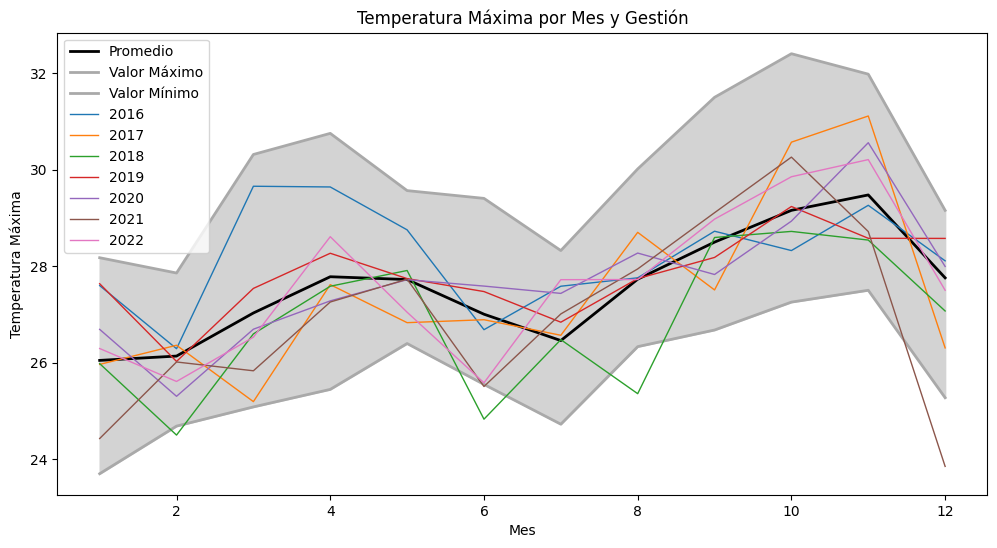

In [9]:
T_Max = df1[['Temperatura_Maxima']].copy()
T_Max = T_Max.resample('M').mean()

T_Max['Mes'] = T_Max.index.month

# Utilizar pivot_table para organizar el DataFrame
TMax_pivot = T_Max.pivot_table(index=T_Max.index.year, columns='Mes', values='Temperatura_Maxima', aggfunc='mean')

TMax_pivot.loc['Promedio'] = TMax_pivot.loc[2000:2015].mean()  # Calcular el promedio por columna para el período 2000-2015
TMax_pivot.loc['Valor Máximo'] = TMax_pivot.loc[2000:2015].max()  # Obtener el valor máximo por columna para el período 2000-2015
TMax_pivot.loc['Valor Mínimo'] = TMax_pivot.loc[2000:2015].min()  # Obtener el valor mínimo por columna para el período 2000-2015

TMax_pivot = TMax_pivot.drop(range(2000, 2016))

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar la fila 'Promedio' en color negro y línea más gruesa
ax.plot(TMax_pivot.columns, TMax_pivot.loc['Promedio'], color='black', linewidth=2, label='Promedio')

# Graficar la fila 'Valor Máximo' en color gris oscuro y línea más gruesa
ax.plot(TMax_pivot.columns, TMax_pivot.loc['Valor Máximo'], color='darkgray', linewidth=2, label='Valor Máximo')

# Graficar la fila 'Valor Mínimo' en color gris oscuro y línea más gruesa
ax.plot(TMax_pivot.columns, TMax_pivot.loc['Valor Mínimo'], color='darkgray', linewidth=2, label='Valor Mínimo')

# Graficar las demás filas en diferentes colores y línea más delgada
for index, row in TMax_pivot.iterrows():
    if index not in ['Promedio', 'Valor Máximo', 'Valor Mínimo']:
        ax.plot(TMax_pivot.columns, row, label=index, linewidth=1)

# Colorear el área entre las líneas del valor mínimo y valor máximo
ax.fill_between(TMax_pivot.columns, TMax_pivot.loc['Valor Mínimo'], TMax_pivot.loc['Valor Máximo'], color='lightgray')

# Configurar el gráfico
ax.set_xlabel('Mes')
ax.set_ylabel('Temperatura Máxima')
ax.set_title('Temperatura Máxima por Mes y Gestión')
ax.legend()

# Mostrar el gráfico
plt.show()

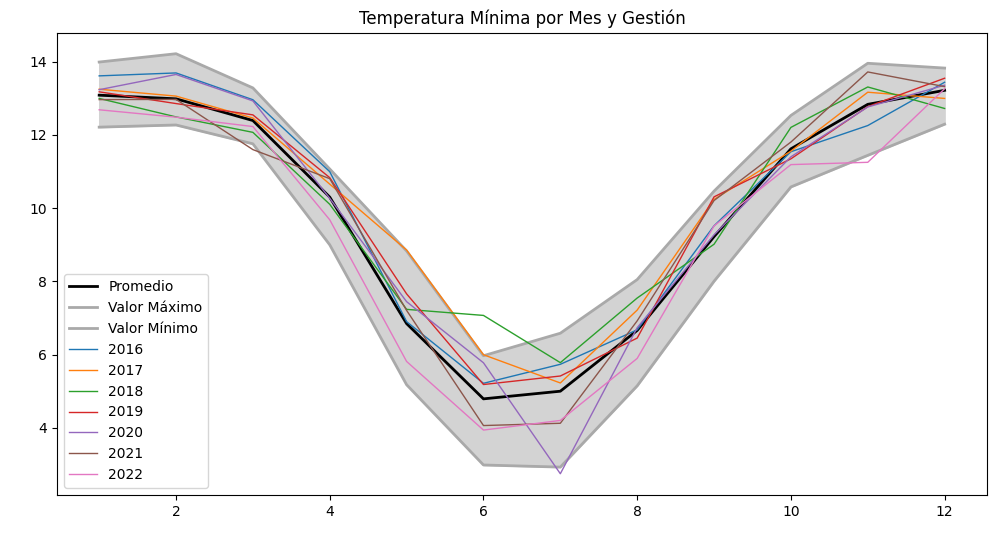

In [10]:
T_Min = df1[['Temperatura_Minima']].copy()
T_Min = T_Min.resample('M').mean()

T_Min['Mes'] = T_Min.index.month

# Utilizar pivot_table para organizar el DataFrame
TMin_pivot = T_Min.pivot_table(index=T_Min.index.year, columns='Mes', values='Temperatura_Minima', aggfunc='mean')

TMin_pivot.loc['Promedio'] = TMin_pivot.loc[2000:2015].mean()  # Calcular el promedio por columna para el período 2000-2015
TMin_pivot.loc['Valor Máximo'] = TMin_pivot.loc[2000:2015].max()  # Obtener el valor máximo por columna para el período 2000-2015
TMin_pivot.loc['Valor Mínimo'] = TMin_pivot.loc[2000:2015].min()  # Obtener el valor mínimo por columna para el período 2000-2015

TMin_pivot = TMin_pivot.drop(range(2000, 2016))

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar la fila 'Promedio' en color negro y línea más gruesa
ax.plot(TMin_pivot.columns, TMin_pivot.loc['Promedio'], color='black', linewidth=2, label='Promedio')

# Graficar la fila 'Valor Máximo' en color gris oscuro y línea más gruesa
ax.plot(TMin_pivot.columns, TMin_pivot.loc['Valor Máximo'], color='darkgray', linewidth=2, label='Valor Máximo')

# Graficar la fila 'Valor Mínimo' en color gris oscuro y línea más gruesa
ax.plot(TMin_pivot.columns, TMin_pivot.loc['Valor Mínimo'], color='darkgray', linewidth=2, label='Valor Mínimo')

# Graficar las demás filas en diferentes colores y línea más delgada
for index, row in TMin_pivot.iterrows():
    if index not in ['Promedio', 'Valor Máximo', 'Valor Mínimo']:
        ax.plot(TMin_pivot.columns, row, label=index, linewidth=1)

# Colorear el área entre las líneas del valor mínimo y valor máximo
ax.fill_between(TMin_pivot.columns, TMin_pivot.loc['Valor Mínimo'], TMin_pivot.loc['Valor Máximo'], color='lightgray')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Temperatura Mínima por Mes y Gestión')
ax.legend()

# Mostrar el gráfico
plt.show()


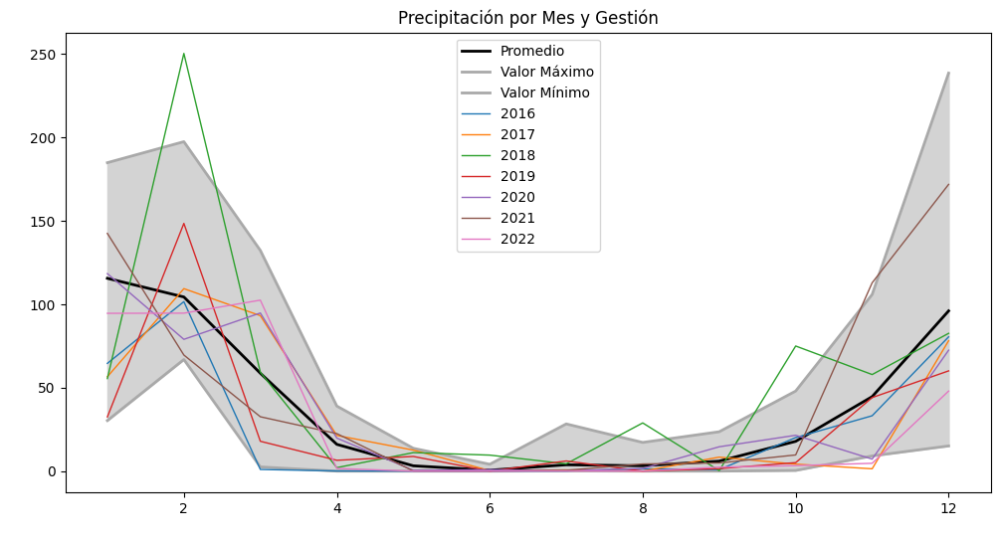

In [11]:
Prec = df1[['Precipitacion']].copy()
Prec = Prec.resample('M').sum()

Prec['Mes'] = Prec.index.month

# Utilizar pivot_table para organizar el DataFrame
Prec_pivot = Prec.pivot_table(index=Prec.index.year, columns='Mes', values='Precipitacion', aggfunc='sum')

Prec_pivot.loc['Promedio'] = Prec_pivot.loc[2000:2015].mean()  # Calcular el promedio por columna para el período 2000-2015
Prec_pivot.loc['Valor Máximo'] = Prec_pivot.loc[2000:2015].max()  # Obtener el valor máximo por columna para el período 2000-2015
Prec_pivot.loc['Valor Mínimo'] = Prec_pivot.loc[2000:2015].min()  # Obtener el valor mínimo por columna para el período 2000-2015

Prec_pivot = Prec_pivot.drop(range(2000, 2016))

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar la fila 'Promedio' en color negro y línea más gruesa
ax.plot(Prec_pivot.columns, Prec_pivot.loc['Promedio'], color='black', linewidth=2, label='Promedio')

# Graficar la fila 'Valor Máximo' en color gris oscuro y línea más gruesa
ax.plot(Prec_pivot.columns, Prec_pivot.loc['Valor Máximo'], color='darkgray', linewidth=2, label='Valor Máximo')

# Graficar la fila 'Valor Mínimo' en color gris oscuro y línea más gruesa
ax.plot(Prec_pivot.columns, Prec_pivot.loc['Valor Mínimo'], color='darkgray', linewidth=2, label='Valor Mínimo')

# Graficar las demás filas en diferentes colores y línea más delgada
for index, row in Prec_pivot.iterrows():
    if index not in ['Promedio', 'Valor Máximo', 'Valor Mínimo']:
        ax.plot(Prec_pivot.columns, row, label=index, linewidth=1)

# Colorear el área entre las líneas del valor mínimo y valor máximo
ax.fill_between(Prec_pivot.columns, Prec_pivot.loc['Valor Mínimo'], Prec_pivot.loc['Valor Máximo'], color='lightgray')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Precipitación por Mes y Gestión')
ax.legend()

# Mostrar el gráfico
plt.show()




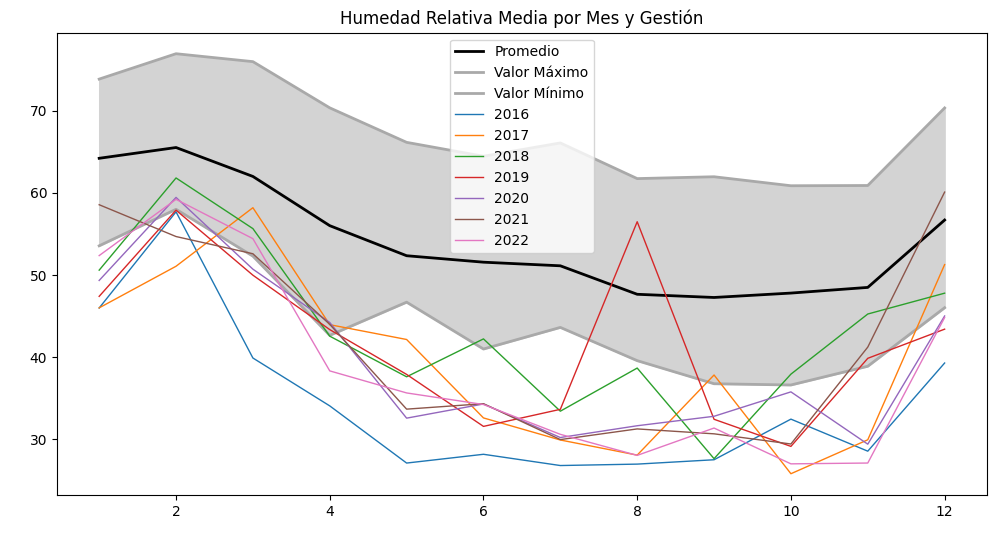

In [12]:
HumeMed = df1[['Humedad_Relativa_Media']].copy()
HumeMed = HumeMed.resample('M').mean()

HumeMed['Mes'] = HumeMed.index.month

# Utilizar pivot_table para organizar el DataFrame
HumeMedia_pivot = HumeMed.pivot_table(index=HumeMed.index.year, columns='Mes', values='Humedad_Relativa_Media', aggfunc='mean')

HumeMedia_pivot.loc['Promedio'] = HumeMedia_pivot.loc[2000:2015].mean()  # Calcular el promedio por columna para el período 2000-2015
HumeMedia_pivot.loc['Valor Máximo'] = HumeMedia_pivot.loc[2000:2015].max()  # Obtener el valor máximo por columna para el período 2000-2015
HumeMedia_pivot.loc['Valor Mínimo'] = HumeMedia_pivot.loc[2000:2015].min()  # Obtener el valor mínimo por columna para el período 2000-2015

HumeMedia_pivot = HumeMedia_pivot.drop(range(2000, 2016))

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar la fila 'Promedio' en color negro y línea más gruesa
ax.plot(HumeMedia_pivot.columns, HumeMedia_pivot.loc['Promedio'], color='black', linewidth=2, label='Promedio')

# Graficar la fila 'Valor Máximo' en color gris oscuro y línea más gruesa
ax.plot(HumeMedia_pivot.columns, HumeMedia_pivot.loc['Valor Máximo'], color='darkgray', linewidth=2, label='Valor Máximo')

# Graficar la fila 'Valor Mínimo' en color gris oscuro y línea más gruesa
ax.plot(HumeMedia_pivot.columns, HumeMedia_pivot.loc['Valor Mínimo'], color='darkgray', linewidth=2, label='Valor Mínimo')

# Graficar las demás filas en diferentes colores y línea más delgada
for index, row in HumeMedia_pivot.iterrows():
    if index not in ['Promedio', 'Valor Máximo', 'Valor Mínimo']:
        ax.plot(HumeMedia_pivot.columns, row, label=index, linewidth=1)

# Colorear el área entre las líneas del valor mínimo y valor máximo
ax.fill_between(HumeMedia_pivot.columns, HumeMedia_pivot.loc['Valor Mínimo'], HumeMedia_pivot.loc['Valor Máximo'], color='lightgray')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Humedad Relativa Media por Mes y Gestión')
ax.legend()

# Mostrar el gráfico
plt.show()




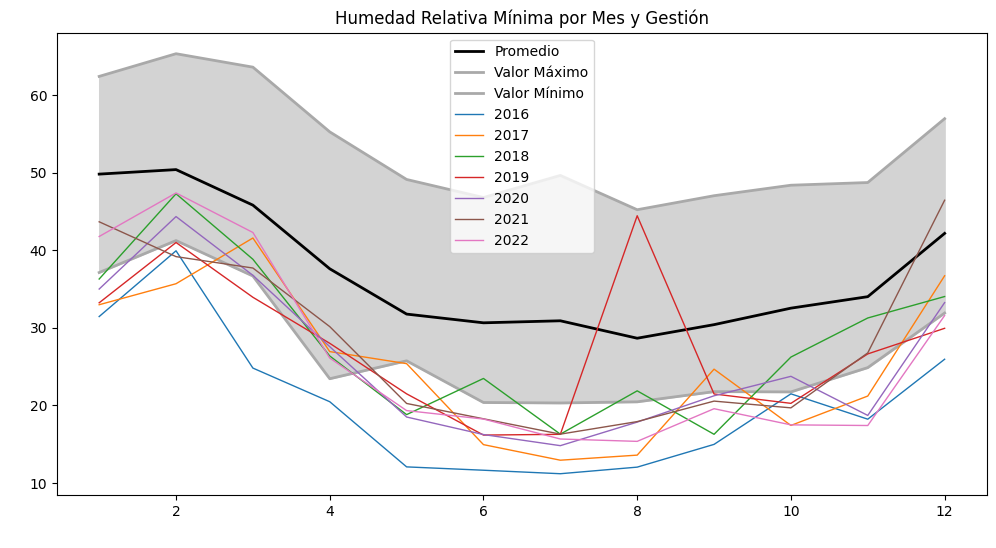

In [13]:
HumeMin = df1[['Humedad_Relativa_Minima']].copy()
HumeMin = HumeMin.resample('M').mean()

HumeMin['Mes'] = HumeMin.index.month

# Utilizar pivot_table para organizar el DataFrame
HumeMin_pivot = HumeMin.pivot_table(index=HumeMin.index.year, columns='Mes', values='Humedad_Relativa_Minima', aggfunc='mean')

HumeMin_pivot.loc['Promedio'] = HumeMin_pivot.loc[2000:2015].mean()  # Calcular el promedio por columna para el período 2000-2015
HumeMin_pivot.loc['Valor Máximo'] = HumeMin_pivot.loc[2000:2015].max()  # Obtener el valor máximo por columna para el período 2000-2015
HumeMin_pivot.loc['Valor Mínimo'] = HumeMin_pivot.loc[2000:2015].min()  # Obtener el valor mínimo por columna para el período 2000-2015

HumeMin_pivot = HumeMin_pivot.drop(range(2000, 2016))

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar la fila 'Promedio' en color negro y línea más gruesa
ax.plot(HumeMin_pivot.columns, HumeMin_pivot.loc['Promedio'], color='black', linewidth=2, label='Promedio')

# Graficar la fila 'Valor Máximo' en color gris oscuro y línea más gruesa
ax.plot(HumeMin_pivot.columns, HumeMin_pivot.loc['Valor Máximo'], color='darkgray', linewidth=2, label='Valor Máximo')

# Graficar la fila 'Valor Mínimo' en color gris oscuro y línea más gruesa
ax.plot(HumeMin_pivot.columns, HumeMin_pivot.loc['Valor Mínimo'], color='darkgray', linewidth=2, label='Valor Mínimo')

# Graficar las demás filas en diferentes colores y línea más delgada
for index, row in HumeMin_pivot.iterrows():
    if index not in ['Promedio', 'Valor Máximo', 'Valor Mínimo']:
        ax.plot(HumeMin_pivot.columns, row, label=index, linewidth=1)

# Colorear el área entre las líneas del valor mínimo y valor máximo
ax.fill_between(HumeMin_pivot.columns, HumeMin_pivot.loc['Valor Mínimo'], HumeMin_pivot.loc['Valor Máximo'], color='lightgray')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Humedad Relativa Mínima por Mes y Gestión')
ax.legend()

# Mostrar el gráfico
plt.show()




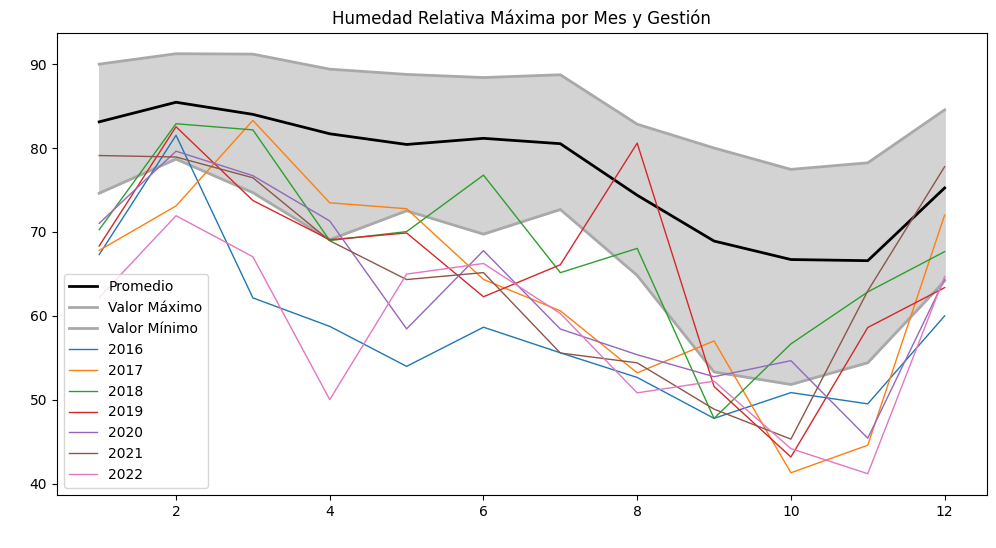

In [14]:
HumeMax = df1[['Humedad_Relativa_Maxima']].copy()
HumeMax = HumeMax.resample('M').mean()

HumeMax['Mes'] = HumeMax.index.month

# Utilizar pivot_table para organizar el DataFrame
HumeMax_pivot = HumeMax.pivot_table(index=HumeMax.index.year, columns='Mes', values='Humedad_Relativa_Maxima', aggfunc='mean')

HumeMax_pivot.loc['Promedio'] = HumeMax_pivot.loc[2000:2015].mean()  # Calcular el promedio por columna para el período 2000-2015
HumeMax_pivot.loc['Valor Máximo'] = HumeMax_pivot.loc[2000:2015].max()  # Obtener el valor máximo por columna para el período 2000-2015
HumeMax_pivot.loc['Valor Mínimo'] = HumeMax_pivot.loc[2000:2015].min()  # Obtener el valor mínimo por columna para el período 2000-2015

HumeMax_pivot = HumeMax_pivot.drop(range(2000, 2016))

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar la fila 'Promedio' en color negro y línea más gruesa
ax.plot(HumeMax_pivot.columns, HumeMax_pivot.loc['Promedio'], color='black', linewidth=2, label='Promedio')

# Graficar la fila 'Valor Máximo' en color gris oscuro y línea más gruesa
ax.plot(HumeMax_pivot.columns, HumeMax_pivot.loc['Valor Máximo'], color='darkgray', linewidth=2, label='Valor Máximo')

# Graficar la fila 'Valor Mínimo' en color gris oscuro y línea más gruesa
ax.plot(HumeMax_pivot.columns, HumeMax_pivot.loc['Valor Mínimo'], color='darkgray', linewidth=2, label='Valor Mínimo')

# Graficar las demás filas en diferentes colores y línea más delgada
for index, row in HumeMax_pivot.iterrows():
    if index not in ['Promedio', 'Valor Máximo', 'Valor Mínimo']:
        ax.plot(HumeMax_pivot.columns, row, label=index, linewidth=1)

# Colorear el área entre las líneas del valor mínimo y valor máximo
ax.fill_between(HumeMax_pivot.columns, HumeMax_pivot.loc['Valor Mínimo'], HumeMax_pivot.loc['Valor Máximo'], color='lightgray')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Humedad Relativa Máxima por Mes y Gestión')
ax.legend()

# Mostrar el gráfico
plt.show()




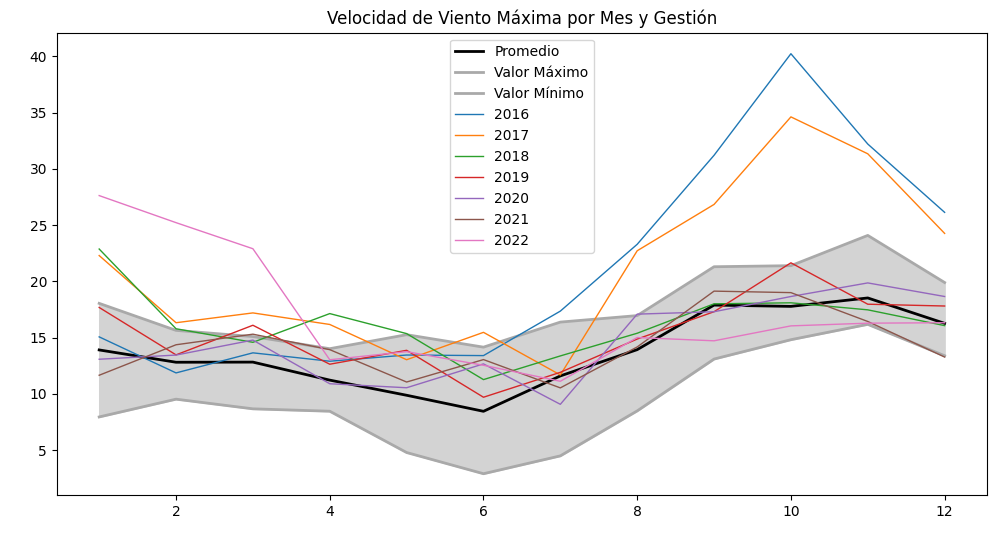

In [15]:
VeloMax = df1[['Velocidad_de_Viento_Maxima']].copy()
VeloMax = VeloMax.resample('M').mean()

VeloMax['Mes'] = VeloMax.index.month

# Utilizar pivot_table para organizar el DataFrame
VeloMax_pivot = VeloMax.pivot_table(index=VeloMax.index.year, columns='Mes', values='Velocidad_de_Viento_Maxima', aggfunc='mean')

VeloMax_pivot.loc['Promedio'] = VeloMax_pivot.loc[2000:2015].mean()  # Calcular el promedio por columna para el período 2000-2015
VeloMax_pivot.loc['Valor Máximo'] = VeloMax_pivot.loc[2000:2015].max()  # Obtener el valor máximo por columna para el período 2000-2015
VeloMax_pivot.loc['Valor Mínimo'] = VeloMax_pivot.loc[2000:2015].min()  # Obtener el valor mínimo por columna para el período 2000-2015

VeloMax_pivot = VeloMax_pivot.drop(range(2000, 2016))

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar la fila 'Promedio' en color negro y línea más gruesa
ax.plot(VeloMax_pivot.columns, VeloMax_pivot.loc['Promedio'], color='black', linewidth=2, label='Promedio')

# Graficar la fila 'Valor Máximo' en color gris oscuro y línea más gruesa
ax.plot(VeloMax_pivot.columns, VeloMax_pivot.loc['Valor Máximo'], color='darkgray', linewidth=2, label='Valor Máximo')

# Graficar la fila 'Valor Mínimo' en color gris oscuro y línea más gruesa
ax.plot(VeloMax_pivot.columns, VeloMax_pivot.loc['Valor Mínimo'], color='darkgray', linewidth=2, label='Valor Mínimo')

# Graficar las demás filas en diferentes colores y línea más delgada
for index, row in VeloMax_pivot.iterrows():
    if index not in ['Promedio', 'Valor Máximo', 'Valor Mínimo']:
        ax.plot(VeloMax_pivot.columns, row, label=index, linewidth=1)

# Colorear el área entre las líneas del valor mínimo y valor máximo
ax.fill_between(VeloMax_pivot.columns, VeloMax_pivot.loc['Valor Mínimo'], VeloMax_pivot.loc['Valor Máximo'], color='lightgray')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Velocidad de Viento Máxima por Mes y Gestión')
ax.legend()

# Mostrar el gráfico
plt.show()




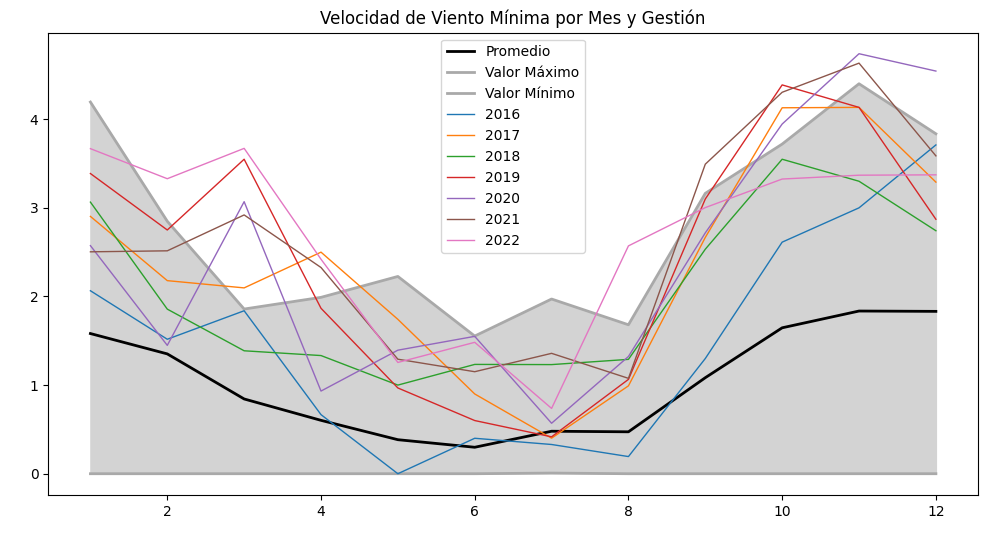

In [16]:
VeloMin = df1[['Velocidad_de_Viento_Minima']].copy()
VeloMin = VeloMin.resample('M').mean()

VeloMin['Mes'] = VeloMin.index.month

# Utilizar pivot_table para organizar el DataFrame
VeloMin_pivot = VeloMin.pivot_table(index=VeloMin.index.year, columns='Mes', values='Velocidad_de_Viento_Minima', aggfunc='mean')

VeloMin_pivot.loc['Promedio'] = VeloMin_pivot.loc[2000:2015].mean()  # Calcular el promedio por columna para el período 2000-2015
VeloMin_pivot.loc['Valor Máximo'] = VeloMin_pivot.loc[2000:2015].max()  # Obtener el valor máximo por columna para el período 2000-2015
VeloMin_pivot.loc['Valor Mínimo'] = VeloMin_pivot.loc[2000:2015].min()  # Obtener el valor mínimo por columna para el período 2000-2015

VeloMin_pivot = VeloMin_pivot.drop(range(2000, 2016))

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar la fila 'Promedio' en color negro y línea más gruesa
ax.plot(VeloMin_pivot.columns, VeloMin_pivot.loc['Promedio'], color='black', linewidth=2, label='Promedio')

# Graficar la fila 'Valor Máximo' en color gris oscuro y línea más gruesa
ax.plot(VeloMin_pivot.columns, VeloMin_pivot.loc['Valor Máximo'], color='darkgray', linewidth=2, label='Valor Máximo')

# Graficar la fila 'Valor Mínimo' en color gris oscuro y línea más gruesa
ax.plot(VeloMin_pivot.columns, VeloMin_pivot.loc['Valor Mínimo'], color='darkgray', linewidth=2, label='Valor Mínimo')

# Graficar las demás filas en diferentes colores y línea más delgada
for index, row in VeloMin_pivot.iterrows():
    if index not in ['Promedio', 'Valor Máximo', 'Valor Mínimo']:
        ax.plot(VeloMin_pivot.columns, row, label=index, linewidth=1)

# Colorear el área entre las líneas del valor mínimo y valor máximo
ax.fill_between(VeloMin_pivot.columns, VeloMin_pivot.loc['Valor Mínimo'], VeloMin_pivot.loc['Valor Máximo'], color='lightgray')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Velocidad de Viento Mínima por Mes y Gestión')
ax.legend()

# Mostrar el gráfico
plt.show()




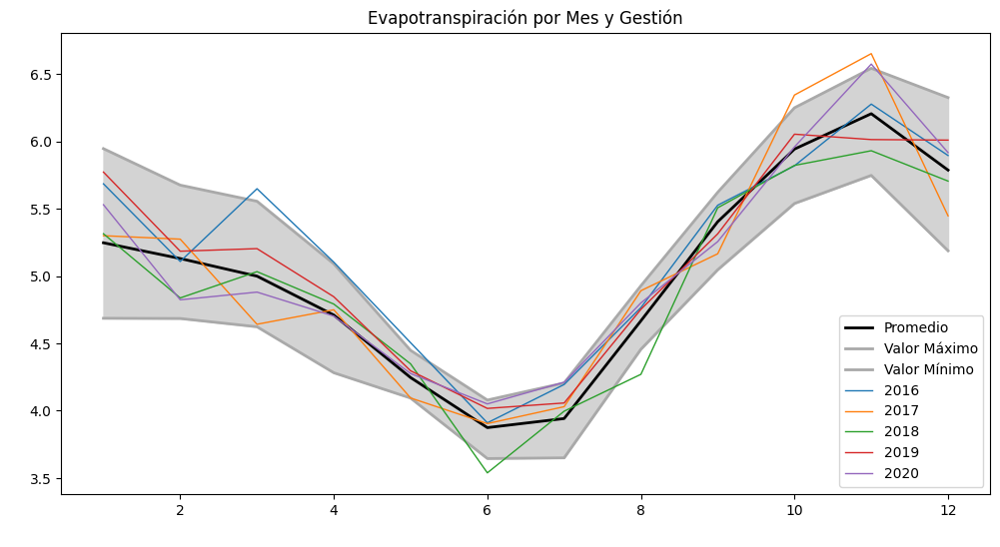

In [17]:
Evot = df1[['eTo']].copy()
Evot = Evot[:'2020-12-31']
Evot = Evot.resample('M').mean()

Evot['Mes'] = Evot.index.month

# Utilizar pivot_table para organizar el DataFrame
Evot_pivot = Evot.pivot_table(index=Evot.index.year, columns='Mes', values='eTo', aggfunc='mean')

Evot_pivot.loc['Promedio'] = Evot_pivot.loc[2000:2015].mean()  # Calcular el promedio por columna para el período 2000-2015
Evot_pivot.loc['Valor Máximo'] = Evot_pivot.loc[2000:2015].max()  # Obtener el valor máximo por columna para el período 2000-2015
Evot_pivot.loc['Valor Mínimo'] = Evot_pivot.loc[2000:2015].min()  # Obtener el valor mínimo por columna para el período 2000-2015

Evot_pivot = Evot_pivot.drop(range(2000, 2016))

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar la fila 'Promedio' en color negro y línea más gruesa
ax.plot(Evot_pivot.columns, Evot_pivot.loc['Promedio'], color='black', linewidth=2, label='Promedio')

# Graficar la fila 'Valor Máximo' en color gris oscuro y línea más gruesa
ax.plot(Evot_pivot.columns, Evot_pivot.loc['Valor Máximo'], color='darkgray', linewidth=2, label='Valor Máximo')

# Graficar la fila 'Valor Mínimo' en color gris oscuro y línea más gruesa
ax.plot(Evot_pivot.columns, Evot_pivot.loc['Valor Mínimo'], color='darkgray', linewidth=2, label='Valor Mínimo')

# Graficar las demás filas en diferentes colores y línea más delgada
for index, row in Evot_pivot.iterrows():
    if index not in ['Promedio', 'Valor Máximo', 'Valor Mínimo']:
        ax.plot(Evot_pivot.columns, row, label=index, linewidth=1)

# Colorear el área entre las líneas del valor mínimo y valor máximo
ax.fill_between(Evot_pivot.columns, Evot_pivot.loc['Valor Mínimo'], Evot_pivot.loc['Valor Máximo'], color='lightgray')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Evapotranspiración por Mes y Gestión')
ax.legend()

# Mostrar el gráfico
plt.show()




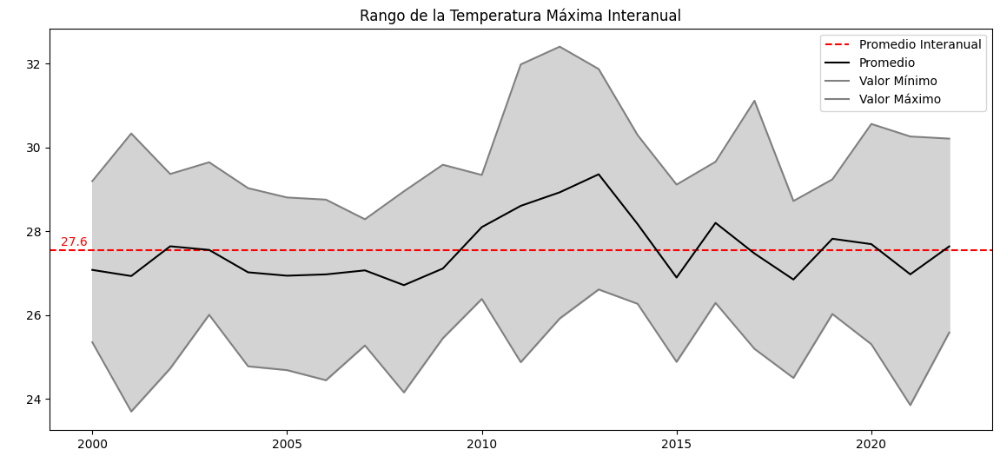

In [18]:
TMax_pivot = T_Max.pivot_table(index=T_Max.index.year, columns='Mes', values='Temperatura_Maxima', aggfunc='mean')

TMax_anual = pd.DataFrame()  # Crear un nuevo DataFrame vacío

# Calcular promedio por gestión y agregarlo al nuevo DataFrame
TMax_anual['Promedio'] = TMax_pivot.mean(axis=1)
# Calcular valor mínimo por gestión y agregarlo al nuevo DataFrame
TMax_anual['Valor Mínimo'] = TMax_pivot.min(axis=1)
# Calcular valor máximo por gestión y agregarlo al nuevo DataFrame
TMax_anual['Valor Máximo'] = TMax_pivot.max(axis=1)

# Calcular el promedio de Prec_anual
promedio_interanual_TMax = TMax_anual['Promedio'].mean()

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(14, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_interanual_TMax, color='r', linestyle='--', label='Promedio Interanual')
# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_interanual_TMax), xy=(0.5, promedio_interanual_TMax), xytext=(-370, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio en color negro
ax.plot(TMax_anual.index, TMax_anual['Promedio'], color='black', label='Promedio')
# Graficar los valores mínimo y máximo en color gris
ax.plot(TMax_anual.index, TMax_anual['Valor Mínimo'], color='gray', label='Valor Mínimo')
ax.plot(TMax_anual.index, TMax_anual['Valor Máximo'], color='gray', label='Valor Máximo')

# Colorear el área entre el valor mínimo y máximo con un color gris más claro
ax.fill_between(TMax_anual.index, TMax_anual['Valor Mínimo'], TMax_anual['Valor Máximo'], color='lightgray')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Rango de la Temperatura Máxima Interanual')
ax.legend()

# Mostrar el gráfico
plt.show()

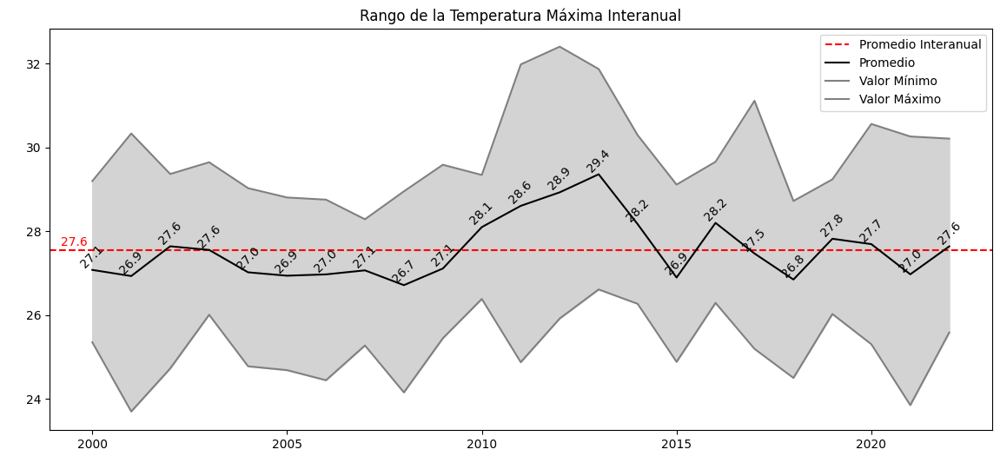

In [19]:
TMax_pivot = T_Max.pivot_table(index=T_Max.index.year, columns='Mes', values='Temperatura_Maxima', aggfunc='mean')

TMax_anual = pd.DataFrame()  # Crear un nuevo DataFrame vacío

# Calcular promedio por gestión y agregarlo al nuevo DataFrame
TMax_anual['Promedio'] = TMax_pivot.mean(axis=1)
# Calcular valor mínimo por gestión y agregarlo al nuevo DataFrame
TMax_anual['Valor Mínimo'] = TMax_pivot.min(axis=1)
# Calcular valor máximo por gestión y agregarlo al nuevo DataFrame
TMax_anual['Valor Máximo'] = TMax_pivot.max(axis=1)

# Calcular el promedio de TMax_anual
promedio_interanual_TMax = TMax_anual['Promedio'].mean()

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(14, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_interanual_TMax, color='r', linestyle='--', label='Promedio Interanual')

# Agregar una anotación con el valor del promedio interanual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_interanual_TMax), xy=(0.5, promedio_interanual_TMax), xytext=(-370, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio en color negro
ax.plot(TMax_anual.index, TMax_anual['Promedio'], color='black', label='Promedio')

# Graficar los valores mínimo y máximo en color gris
ax.plot(TMax_anual.index, TMax_anual['Valor Mínimo'], color='gray', label='Valor Mínimo')
ax.plot(TMax_anual.index, TMax_anual['Valor Máximo'], color='gray', label='Valor Máximo')

# Colorear el área entre el valor mínimo y máximo con un color gris más claro
ax.fill_between(TMax_anual.index, TMax_anual['Valor Mínimo'], TMax_anual['Valor Máximo'], color='lightgray')

# Agregar etiquetas con los valores de la línea de promedio
linea_promedio = TMax_anual['Promedio'].values
for i, valor in enumerate(linea_promedio):
    ax.annotate('{:.1f}'.format(valor), xy=(TMax_anual.index[i], valor), ha='center', va='bottom', color='black', rotation=45)

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Rango de la Temperatura Máxima Interanual')
ax.legend()

# Mostrar el gráfico
plt.show()

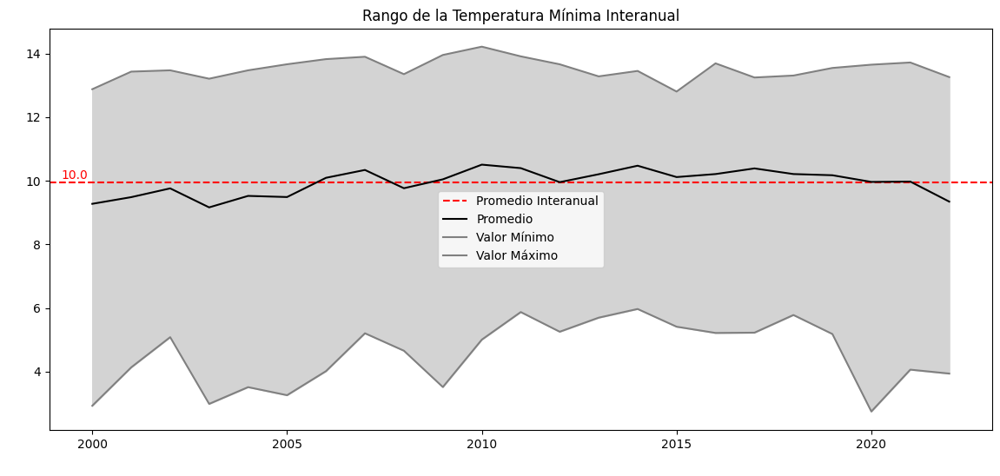

In [20]:
TMin_pivot = T_Min.pivot_table(index=T_Min.index.year, columns='Mes', values='Temperatura_Minima', aggfunc='mean')

TMin_anual = pd.DataFrame()  # Crear un nuevo DataFrame vacío

# Calcular promedio por gestión y agregarlo al nuevo DataFrame
TMin_anual['Promedio'] = TMin_pivot.mean(axis=1)

# Calcular valor mínimo por gestión y agregarlo al nuevo DataFrame
TMin_anual['Valor Mínimo'] = TMin_pivot.min(axis=1)

# Calcular valor máximo por gestión y agregarlo al nuevo DataFrame
TMin_anual['Valor Máximo'] = TMin_pivot.max(axis=1)

# Calcular el promedio de Prec_anual
promedio_interanual_TMin = TMin_anual['Promedio'].mean()

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(14, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_interanual_TMin, color='r', linestyle='--', label='Promedio Interanual')
# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_interanual_TMin), xy=(0.5, promedio_interanual_TMin), xytext=(-370, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio en color negro
ax.plot(TMin_anual.index, TMin_anual['Promedio'], color='black', label='Promedio')

# Graficar los valores mínimo y máximo en color gris
ax.plot(TMin_anual.index, TMin_anual['Valor Mínimo'], color='gray', label='Valor Mínimo')
ax.plot(TMin_anual.index, TMin_anual['Valor Máximo'], color='gray', label='Valor Máximo')

# Colorear el área entre el valor mínimo y máximo con un color gris más claro
ax.fill_between(TMin_anual.index, TMin_anual['Valor Mínimo'], TMin_anual['Valor Máximo'], color='lightgray')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Rango de la Temperatura Mínima Interanual')
ax.legend()

# Mostrar el gráfico
plt.show()


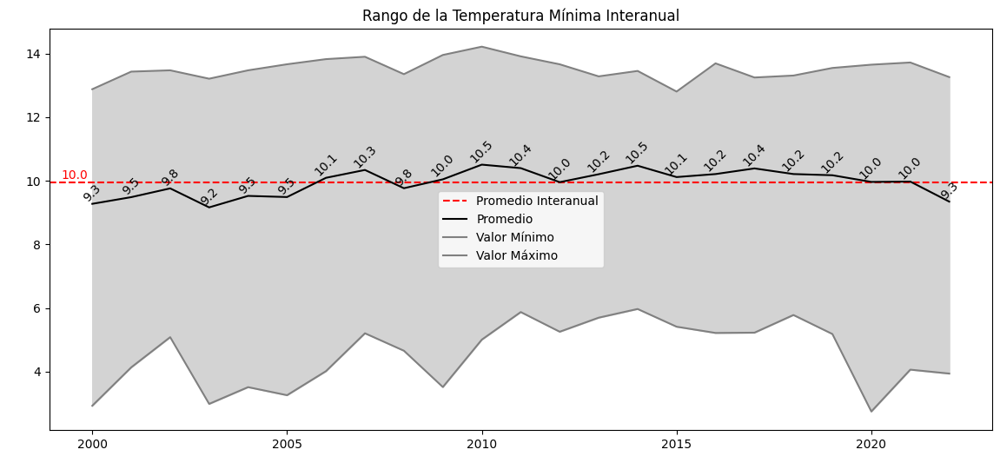

In [21]:
TMin_pivot = T_Min.pivot_table(index=T_Min.index.year, columns='Mes', values='Temperatura_Minima', aggfunc='mean')

TMin_anual = pd.DataFrame()  # Crear un nuevo DataFrame vacío

# Calcular promedio por gestión y agregarlo al nuevo DataFrame
TMin_anual['Promedio'] = TMin_pivot.mean(axis=1)

# Calcular valor mínimo por gestión y agregarlo al nuevo DataFrame
TMin_anual['Valor Mínimo'] = TMin_pivot.min(axis=1)

# Calcular valor máximo por gestión y agregarlo al nuevo DataFrame
TMin_anual['Valor Máximo'] = TMin_pivot.max(axis=1)

# Calcular el promedio de TMin_anual
promedio_interanual_TMin = TMin_anual['Promedio'].mean()

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(14, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_interanual_TMin, color='r', linestyle='--', label='Promedio Interanual')

# Agregar una anotación con el valor del promedio interanual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_interanual_TMin), xy=(0.5, promedio_interanual_TMin), xytext=(-370, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio en color negro
ax.plot(TMin_anual.index, TMin_anual['Promedio'], color='black', label='Promedio')

# Graficar los valores mínimo y máximo en color gris
ax.plot(TMin_anual.index, TMin_anual['Valor Mínimo'], color='gray', label='Valor Mínimo')
ax.plot(TMin_anual.index, TMin_anual['Valor Máximo'], color='gray', label='Valor Máximo')

# Colorear el área entre el valor mínimo y máximo con un color gris más claro
ax.fill_between(TMin_anual.index, TMin_anual['Valor Mínimo'], TMin_anual['Valor Máximo'], color='lightgray')

# Agregar etiquetas con los valores de la línea de promedio
linea_promedio = TMin_anual['Promedio'].values
for i, valor in enumerate(linea_promedio):
    ax.annotate('{:.1f}'.format(valor), xy=(TMin_anual.index[i], valor), ha='center', va='bottom', color='black', rotation=45)

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Rango de la Temperatura Mínima Interanual')
ax.legend()

# Mostrar el gráfico
plt.show()

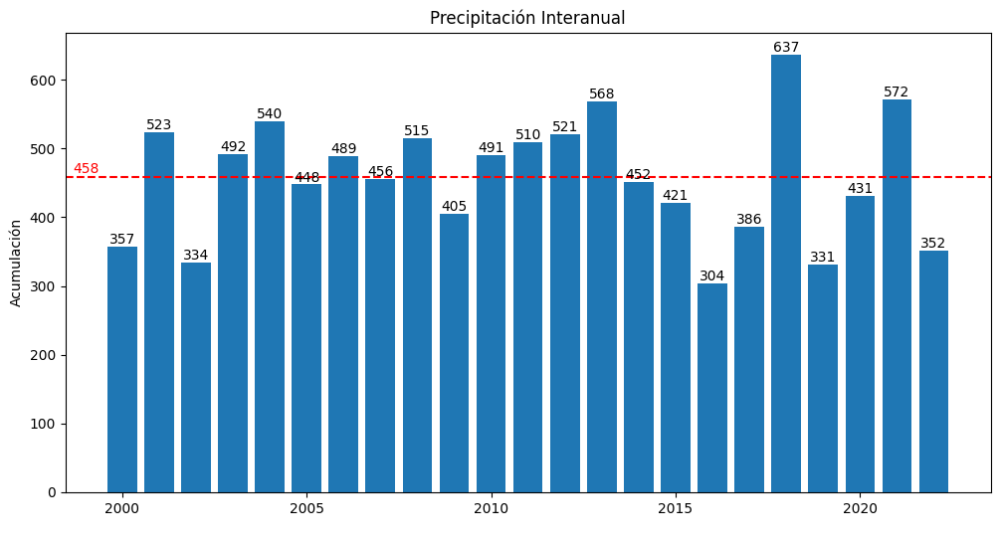

In [22]:
Prec_pivot = Prec.pivot_table(index=Prec.index.year, columns='Mes', values='Precipitacion', aggfunc='sum')

Prec_anual = pd.DataFrame()  # Crear un nuevo DataFrame vacío
# Calcular promedio por gestión y agregarlo al nuevo DataFrame
Prec_anual['Acumulacion'] = Prec_pivot.sum(axis=1)

# Calcular el promedio de Prec_anual
promedio_anual = Prec_anual['Acumulacion'].mean()

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=(12, 6))

# Obtener los valores de la columna 'Acumulacion' y los gestiones
gestiones = Prec_anual.index
acumulacion = Prec_anual['Acumulacion']

# Graficar en barras por gestión
ax.bar(gestiones, acumulacion)

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_anual, color='r', linestyle='--', label='Promedio Anual')

# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.0f}'.format(promedio_anual), xy=(0.5, promedio_anual), xytext=(-320, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Agregar los valores redondeados encima de cada barra
for i, valor in enumerate(acumulacion):
    ax.annotate('{:.0f}'.format(valor), (gestiones[i], valor), ha='center', va='bottom')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel('Acumulación')
ax.set_title('Precipitación Interanual')

# Mostrar el gráfico
plt.show()


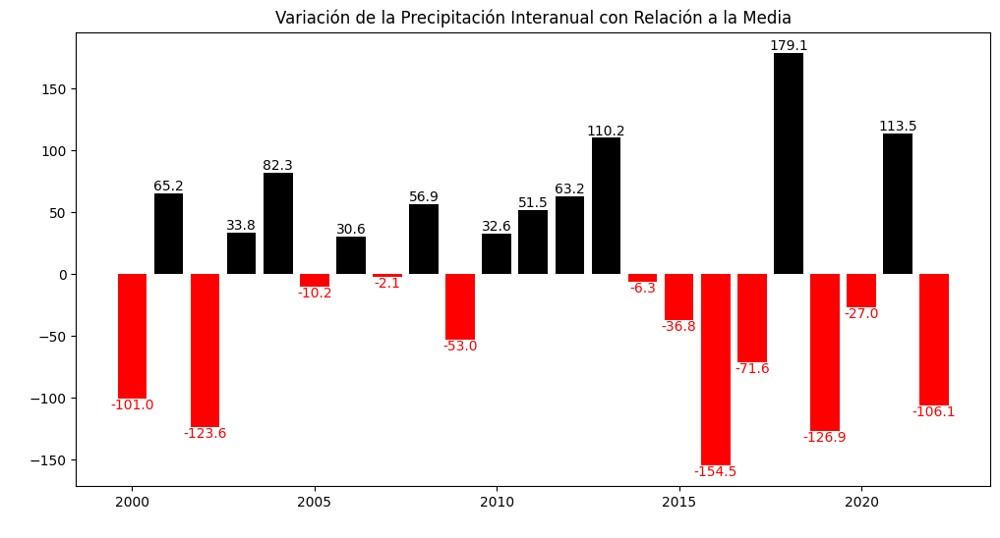

In [23]:
#ajuste = (Prec_anual['Acumulacion'] - promedio_anual) / promedio_anual * 100
ajuste = (Prec_anual['Acumulacion'] - promedio_anual)
Prec_anual_prom = pd.DataFrame(ajuste.values, index=Prec_anual.index, columns=['Acumulacion Porcentual'])

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=(12, 6))

gestiones = Prec_anual_prom.index
acumulacion = Prec_anual_prom['Acumulacion Porcentual']

# Generar la lista de colores para las barras según si su valor es negativo o no
colores = []
for valor in acumulacion:
    if valor >= 0:
        colores.append('black')
    else:
        colores.append('red')

# Graficar las barras en el eje con el color correspondiente
ax.bar(gestiones, acumulacion, color=colores)

# Graficar los valores encima/debajo de cada barra según su signo
for i, valor in enumerate(acumulacion):
    if valor < 0:
        ax.annotate('{:.1f}'.format(valor), (gestiones[i], valor), ha='center', va='top', color='red')
    else:
        ax.annotate('{:.1f}'.format(valor), (gestiones[i], valor), ha='center', va='bottom')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Variación de la Precipitación Interanual con Relación a la Media')

# Mostrar el gráfico
plt.show()

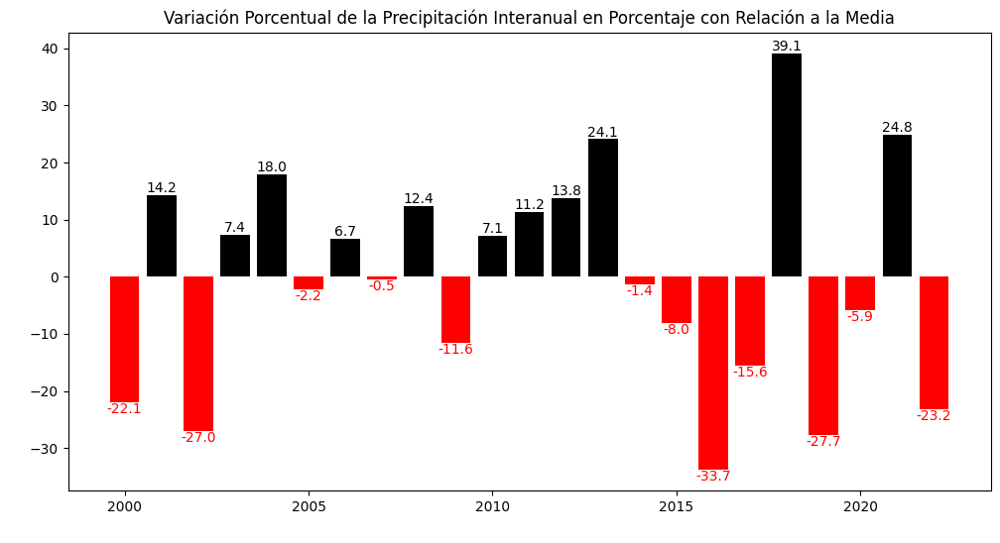

In [24]:
ajuste = (Prec_anual['Acumulacion'] - promedio_anual) / promedio_anual * 100
Prec_anual_prom = pd.DataFrame(ajuste.values, index=Prec_anual.index, columns=['Acumulacion Porcentual'])

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=(12, 6))

gestiones = Prec_anual_prom.index
acumulacion = Prec_anual_prom['Acumulacion Porcentual']

# Generar la lista de colores para las barras según si su valor es negativo o no
colores = []
for valor in acumulacion:
    if valor >= 0:
        colores.append('black')
    else:
        colores.append('red')

# Graficar las barras en el eje con el color correspondiente
ax.bar(gestiones, acumulacion, color=colores)

# Graficar los valores encima/debajo de cada barra según su signo
for i, valor in enumerate(acumulacion):
    if valor < 0:
        ax.annotate('{:.1f}'.format(valor), (gestiones[i], valor), ha='center', va='top', color='red')
    else:
        ax.annotate('{:.1f}'.format(valor), (gestiones[i], valor), ha='center', va='bottom')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Variación Porcentual de la Precipitación Interanual en Porcentaje con Relación a la Media')

# Mostrar el gráfico
plt.show()

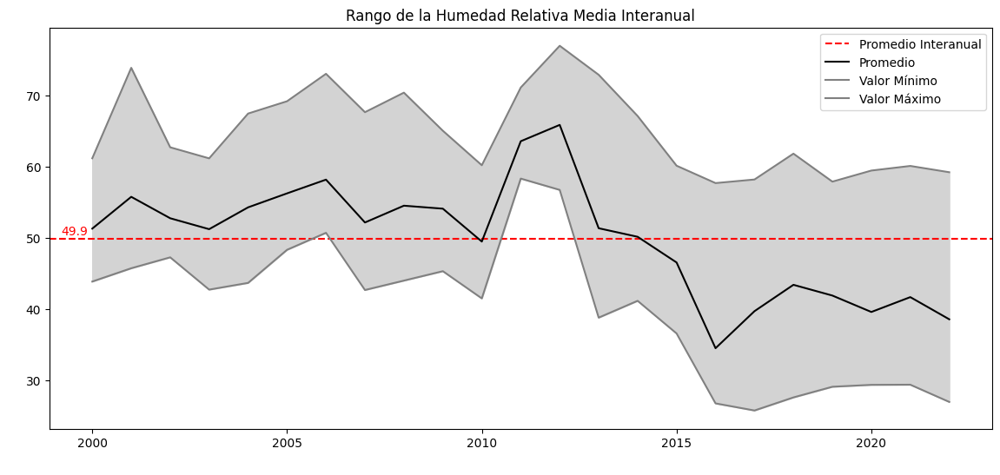

In [25]:
HumeMedia_pivot = HumeMed.pivot_table(index=HumeMed.index.year, columns='Mes', values='Humedad_Relativa_Media', aggfunc='mean')

HMedi_anual = pd.DataFrame()  # Crear un nuevo DataFrame vacío

# Calcular promedio por gestión y agregarlo al nuevo DataFrame
HMedi_anual['Promedio'] = HumeMedia_pivot.mean(axis=1)

# Calcular valor mínimo por gestión y agregarlo al nuevo DataFrame
HMedi_anual['Valor Mínimo'] = HumeMedia_pivot.min(axis=1)

# Calcular valor máximo por gestión y agregarlo al nuevo DataFrame
HMedi_anual['Valor Máximo'] = HumeMedia_pivot.max(axis=1)

# Calcular el promedio de Prec_anual
promedio_interanual_HMedi = HMedi_anual['Promedio'].mean()

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(14, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_interanual_HMedi, color='r', linestyle='--', label='Promedio Interanual')
# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_interanual_HMedi), xy=(0.5, promedio_interanual_HMedi), xytext=(-370, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio en color negro
ax.plot(HMedi_anual.index, HMedi_anual['Promedio'], color='black', label='Promedio')

# Graficar los valores mínimo y máximo en color gris
ax.plot(HMedi_anual.index, HMedi_anual['Valor Mínimo'], color='gray', label='Valor Mínimo')
ax.plot(HMedi_anual.index, HMedi_anual['Valor Máximo'], color='gray', label='Valor Máximo')

# Colorear el área entre el valor mínimo y máximo con un color gris más claro
ax.fill_between(HMedi_anual.index, HMedi_anual['Valor Mínimo'], HMedi_anual['Valor Máximo'], color='lightgray')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Rango de la Humedad Relativa Media Interanual')
ax.legend()

# Mostrar el gráfico
plt.show()


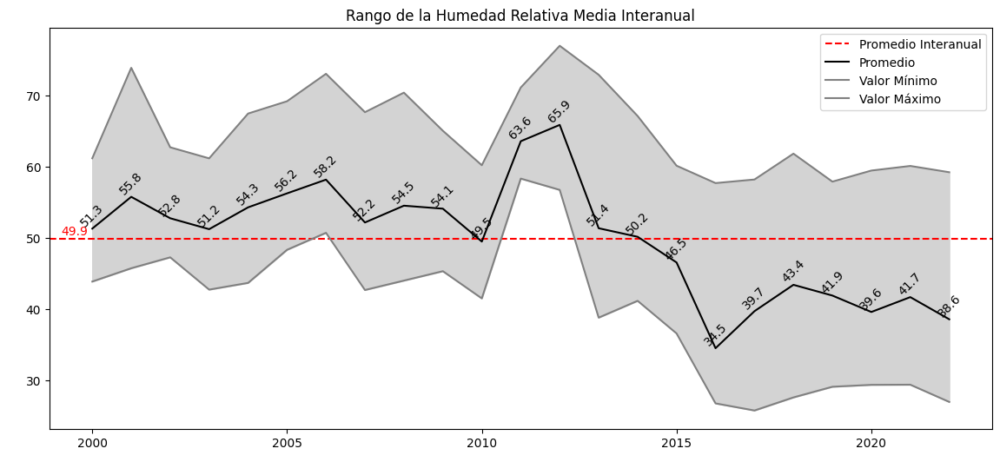

In [26]:
HumeMedia_pivot = HumeMed.pivot_table(index=HumeMed.index.year, columns='Mes', values='Humedad_Relativa_Media', aggfunc='mean')

HMedi_anual = pd.DataFrame()  # Crear un nuevo DataFrame vacío

# Calcular promedio por gestión y agregarlo al nuevo DataFrame
HMedi_anual['Promedio'] = HumeMedia_pivot.mean(axis=1)

# Calcular valor mínimo por gestión y agregarlo al nuevo DataFrame
HMedi_anual['Valor Mínimo'] = HumeMedia_pivot.min(axis=1)

# Calcular valor máximo por gestión y agregarlo al nuevo DataFrame
HMedi_anual['Valor Máximo'] = HumeMedia_pivot.max(axis=1)

# Calcular el promedio de HMedi_anual
promedio_interanual_HMedi = HMedi_anual['Promedio'].mean()

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(14, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_interanual_HMedi, color='r', linestyle='--', label='Promedio Interanual')

# Agregar una anotación con el valor del promedio interanual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_interanual_HMedi), xy=(0.5, promedio_interanual_HMedi), xytext=(-370, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio en color negro
ax.plot(HMedi_anual.index, HMedi_anual['Promedio'], color='black', label='Promedio')

# Graficar los valores mínimo y máximo en color gris
ax.plot(HMedi_anual.index, HMedi_anual['Valor Mínimo'], color='gray', label='Valor Mínimo')
ax.plot(HMedi_anual.index, HMedi_anual['Valor Máximo'], color='gray', label='Valor Máximo')

# Colorear el área entre el valor mínimo y máximo con un color gris más claro
ax.fill_between(HMedi_anual.index, HMedi_anual['Valor Mínimo'], HMedi_anual['Valor Máximo'], color='lightgray')

# Agregar etiquetas con los valores de la línea de promedio
linea_promedio = HMedi_anual['Promedio'].values
for i, valor in enumerate(linea_promedio):
    ax.annotate('{:.1f}'.format(valor), xy=(HMedi_anual.index[i], valor), ha='center', va='bottom', color='black', rotation=45)

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Rango de la Humedad Relativa Media Interanual')
ax.legend()

# Mostrar el gráfico
plt.show()

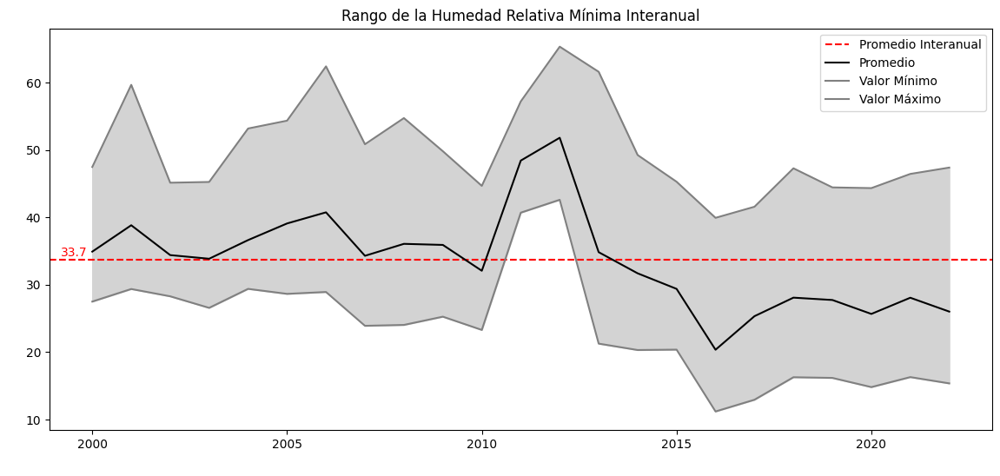

In [27]:
HumeMin_pivot = HumeMin.pivot_table(index=HumeMin.index.year, columns='Mes', values='Humedad_Relativa_Minima', aggfunc='mean')

HMin_anual = pd.DataFrame()  # Crear un nuevo DataFrame vacío

# Calcular promedio por gestión y agregarlo al nuevo DataFrame
HMin_anual['Promedio'] = HumeMin_pivot.mean(axis=1)

# Calcular valor mínimo por gestión y agregarlo al nuevo DataFrame
HMin_anual['Valor Mínimo'] = HumeMin_pivot.min(axis=1)

# Calcular valor máximo por gestión y agregarlo al nuevo DataFrame
HMin_anual['Valor Máximo'] = HumeMin_pivot.max(axis=1)

# Calcular el promedio de Prec_anual
promedio_interanual_HMin = HMin_anual['Promedio'].mean()

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(14, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_interanual_HMin, color='r', linestyle='--', label='Promedio Interanual')
# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_interanual_HMin), xy=(0.5, promedio_interanual_HMin), xytext=(-370, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio en color negro
ax.plot(HMin_anual.index, HMin_anual['Promedio'], color='black', label='Promedio')

# Graficar los valores mínimo y máximo en color gris
ax.plot(HMin_anual.index, HMin_anual['Valor Mínimo'], color='gray', label='Valor Mínimo')
ax.plot(HMin_anual.index, HMin_anual['Valor Máximo'], color='gray', label='Valor Máximo')

# Colorear el área entre el valor mínimo y máximo con un color gris más claro
ax.fill_between(HMin_anual.index, HMin_anual['Valor Mínimo'], HMin_anual['Valor Máximo'], color='lightgray')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Rango de la Humedad Relativa Mínima Interanual')
ax.legend()

# Mostrar el gráfico
plt.show()

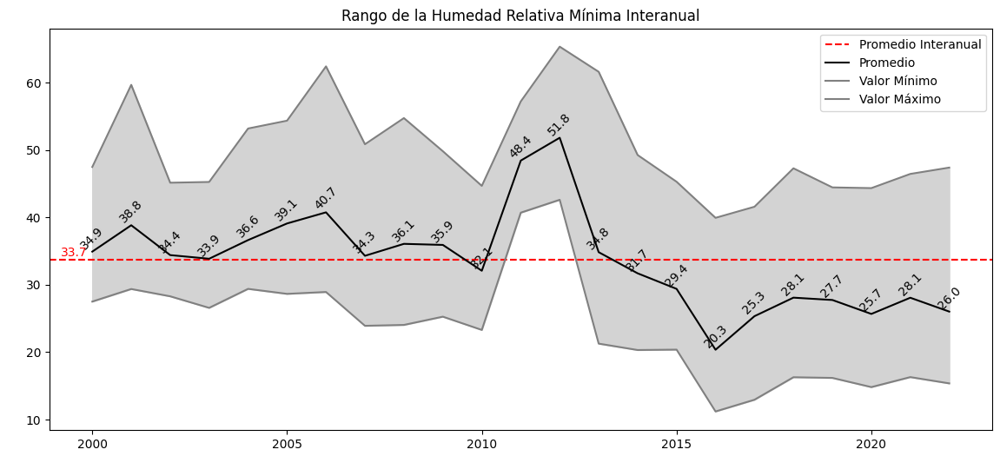

In [28]:
HumeMin_pivot = HumeMin.pivot_table(index=HumeMin.index.year, columns='Mes', values='Humedad_Relativa_Minima', aggfunc='mean')

HMin_anual = pd.DataFrame()  # Crear un nuevo DataFrame vacío

# Calcular promedio por gestión y agregarlo al nuevo DataFrame
HMin_anual['Promedio'] = HumeMin_pivot.mean(axis=1)

# Calcular valor mínimo por gestión y agregarlo al nuevo DataFrame
HMin_anual['Valor Mínimo'] = HumeMin_pivot.min(axis=1)

# Calcular valor máximo por gestión y agregarlo al nuevo DataFrame
HMin_anual['Valor Máximo'] = HumeMin_pivot.max(axis=1)

# Calcular el promedio de HMin_anual
promedio_interanual_HMin = HMin_anual['Promedio'].mean()

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(14, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_interanual_HMin, color='r', linestyle='--', label='Promedio Interanual')

# Agregar una anotación con el valor del promedio interanual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_interanual_HMin), xy=(0.5, promedio_interanual_HMin), xytext=(-370, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio en color negro
ax.plot(HMin_anual.index, HMin_anual['Promedio'], color='black', label='Promedio')

# Graficar los valores mínimo y máximo en color gris
ax.plot(HMin_anual.index, HMin_anual['Valor Mínimo'], color='gray', label='Valor Mínimo')
ax.plot(HMin_anual.index, HMin_anual['Valor Máximo'], color='gray', label='Valor Máximo')

# Colorear el área entre el valor mínimo y máximo con un color gris más claro
ax.fill_between(HMin_anual.index, HMin_anual['Valor Mínimo'], HMin_anual['Valor Máximo'], color='lightgray')

# Agregar etiquetas con los valores de la línea de promedio
linea_promedio = HMin_anual['Promedio'].values
for i, valor in enumerate(linea_promedio):
    ax.annotate('{:.1f}'.format(valor), xy=(HMin_anual.index[i], valor), ha='center', va='bottom', color='black', rotation=45)

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Rango de la Humedad Relativa Mínima Interanual')
ax.legend()

# Mostrar el gráfico
plt.show()

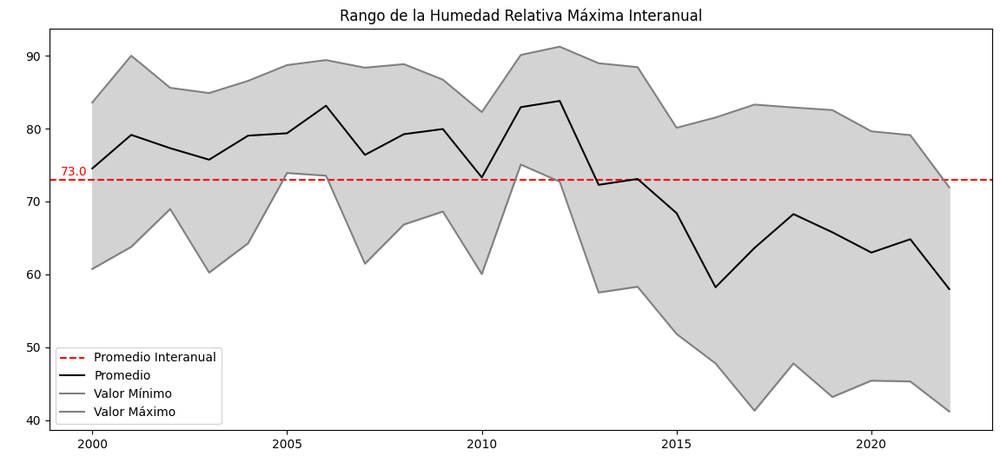

In [29]:
HumeMax_pivot = HumeMax.pivot_table(index=HumeMax.index.year, columns='Mes', values='Humedad_Relativa_Maxima', aggfunc='mean')

HMax_anual = pd.DataFrame()  # Crear un nuevo DataFrame vacío

# Calcular promedio por gestión y agregarlo al nuevo DataFrame
HMax_anual['Promedio'] = HumeMax_pivot.mean(axis=1)

# Calcular valor mínimo por gestión y agregarlo al nuevo DataFrame
HMax_anual['Valor Mínimo'] = HumeMax_pivot.min(axis=1)

# Calcular valor máximo por gestión y agregarlo al nuevo DataFrame
HMax_anual['Valor Máximo'] = HumeMax_pivot.max(axis=1)

# Calcular el promedio de Prec_anual
promedio_interanual_HMax = HMax_anual['Promedio'].mean()

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(14, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_interanual_HMax, color='r', linestyle='--', label='Promedio Interanual')
# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_interanual_HMax), xy=(0.5, promedio_interanual_HMax), xytext=(-370, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')


# Graficar el promedio en color negro
ax.plot(HMax_anual.index, HMax_anual['Promedio'], color='black', label='Promedio')

# Graficar los valores mínimo y máximo en color gris
ax.plot(HMax_anual.index, HMax_anual['Valor Mínimo'], color='gray', label='Valor Mínimo')
ax.plot(HMax_anual.index, HMax_anual['Valor Máximo'], color='gray', label='Valor Máximo')

# Colorear el área entre el valor mínimo y máximo con un color gris más claro
ax.fill_between(HMax_anual.index, HMax_anual['Valor Mínimo'], HMax_anual['Valor Máximo'], color='lightgray')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Rango de la Humedad Relativa Máxima Interanual')
ax.legend()

# Mostrar el gráfico
plt.show()

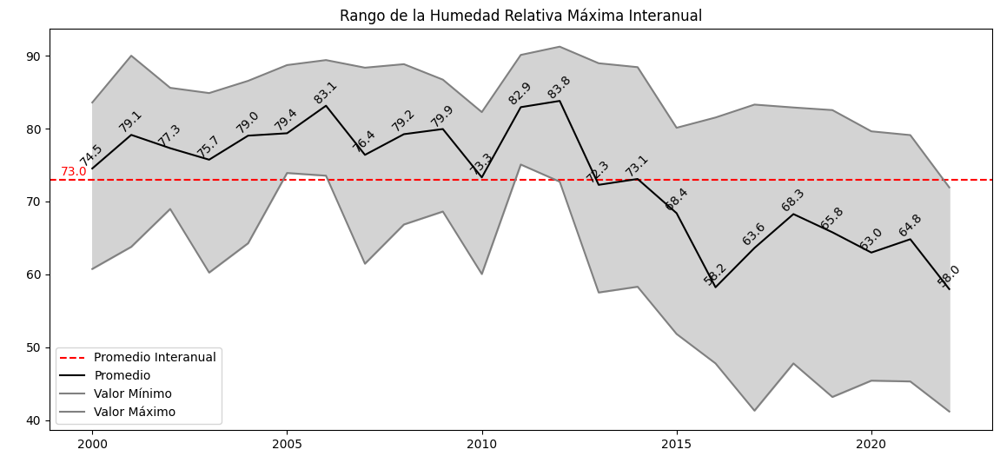

In [30]:
HumeMax_pivot = HumeMax.pivot_table(index=HumeMax.index.year, columns='Mes', values='Humedad_Relativa_Maxima', aggfunc='mean')

HMax_anual = pd.DataFrame()  # Crear un nuevo DataFrame vacío

# Calcular promedio por gestión y agregarlo al nuevo DataFrame
HMax_anual['Promedio'] = HumeMax_pivot.mean(axis=1)

# Calcular valor mínimo por gestión y agregarlo al nuevo DataFrame
HMax_anual['Valor Mínimo'] = HumeMax_pivot.min(axis=1)

# Calcular valor máximo por gestión y agregarlo al nuevo DataFrame
HMax_anual['Valor Máximo'] = HumeMax_pivot.max(axis=1)

# Calcular el promedio de HMax_anual
promedio_interanual_HMax = HMax_anual['Promedio'].mean()

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(14, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_interanual_HMax, color='r', linestyle='--', label='Promedio Interanual')

# Agregar una anotación con el valor del promedio interanual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_interanual_HMax), xy=(0.5, promedio_interanual_HMax), xytext=(-370, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio en color negro
ax.plot(HMax_anual.index, HMax_anual['Promedio'], color='black', label='Promedio')

# Graficar los valores mínimo y máximo en color gris
ax.plot(HMax_anual.index, HMax_anual['Valor Mínimo'], color='gray', label='Valor Mínimo')
ax.plot(HMax_anual.index, HMax_anual['Valor Máximo'], color='gray', label='Valor Máximo')

# Colorear el área entre el valor mínimo y máximo con un color gris más claro
ax.fill_between(HMax_anual.index, HMax_anual['Valor Mínimo'], HMax_anual['Valor Máximo'], color='lightgray')

# Agregar etiquetas con los valores de la línea de promedio
linea_promedio = HMax_anual['Promedio'].values
for i, valor in enumerate(linea_promedio):
    ax.annotate('{:.1f}'.format(valor), xy=(HMax_anual.index[i], valor), ha='center', va='bottom', color='black', rotation=45)

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Rango de la Humedad Relativa Máxima Interanual')
ax.legend()

# Mostrar el gráfico
plt.show()

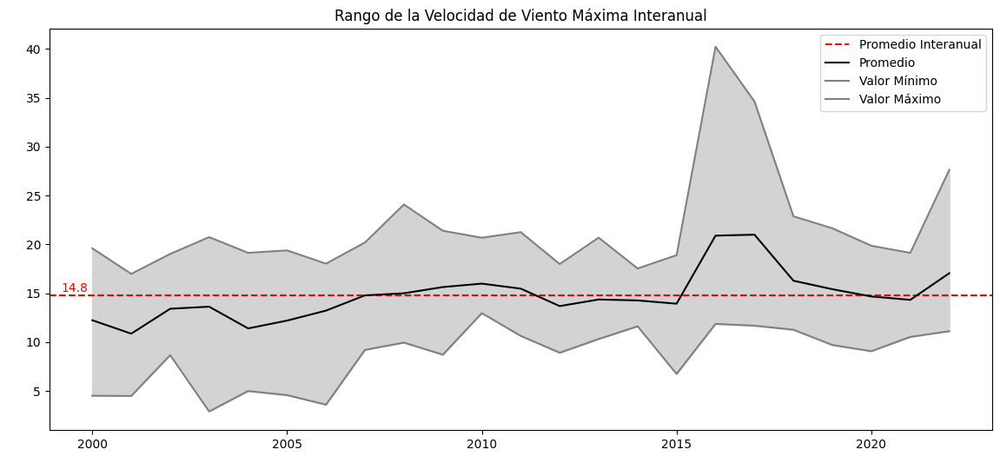

In [31]:
VeloMax_pivot = VeloMax.pivot_table(index=VeloMax.index.year, columns='Mes', values='Velocidad_de_Viento_Maxima', aggfunc='mean')

VMax_anual = pd.DataFrame()  # Crear un nuevo DataFrame vacío

# Calcular promedio por gestión y agregarlo al nuevo DataFrame
VMax_anual['Promedio'] = VeloMax_pivot.mean(axis=1)

# Calcular valor mínimo por gestión y agregarlo al nuevo DataFrame
VMax_anual['Valor Mínimo'] = VeloMax_pivot.min(axis=1)

# Calcular valor máximo por gestión y agregarlo al nuevo DataFrame
VMax_anual['Valor Máximo'] = VeloMax_pivot.max(axis=1)

# Calcular el promedio de Prec_anual
promedio_interanual_VMax = VMax_anual['Promedio'].mean()

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(14, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_interanual_VMax, color='r', linestyle='--', label='Promedio Interanual')
# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_interanual_VMax), xy=(0.5, promedio_interanual_VMax), xytext=(-370, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio en color negro
ax.plot(VMax_anual.index, VMax_anual['Promedio'], color='black', label='Promedio')

# Graficar los valores mínimo y máximo en color gris
ax.plot(VMax_anual.index, VMax_anual['Valor Mínimo'], color='gray', label='Valor Mínimo')
ax.plot(VMax_anual.index, VMax_anual['Valor Máximo'], color='gray', label='Valor Máximo')

# Colorear el área entre el valor mínimo y máximo con un color gris más claro
ax.fill_between(VMax_anual.index, VMax_anual['Valor Mínimo'], VMax_anual['Valor Máximo'], color='lightgray')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Rango de la Velocidad de Viento Máxima Interanual')
ax.legend()

# Mostrar el gráfico
plt.show()

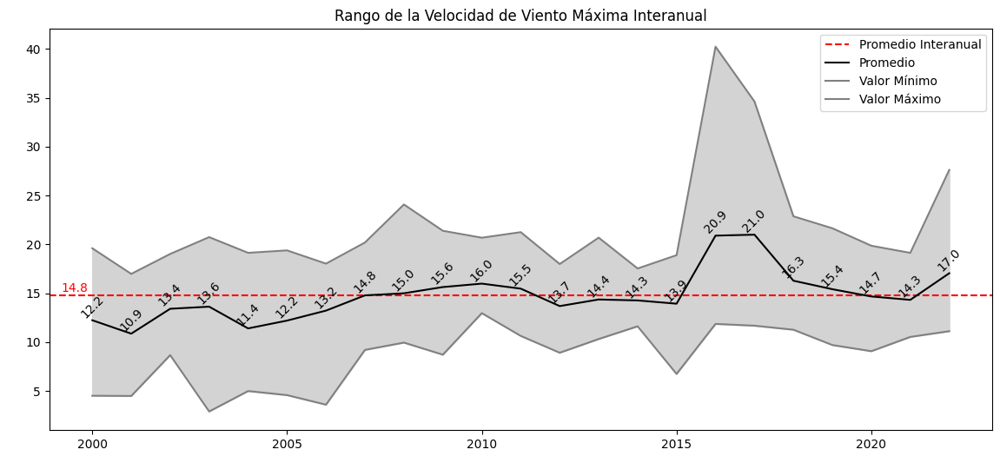

In [32]:
VeloMax_pivot = VeloMax.pivot_table(index=VeloMax.index.year, columns='Mes', values='Velocidad_de_Viento_Maxima', aggfunc='mean')

VMax_anual = pd.DataFrame()  # Crear un nuevo DataFrame vacío

# Calcular promedio por gestión y agregarlo al nuevo DataFrame
VMax_anual['Promedio'] = VeloMax_pivot.mean(axis=1)

# Calcular valor mínimo por gestión y agregarlo al nuevo DataFrame
VMax_anual['Valor Mínimo'] = VeloMax_pivot.min(axis=1)

# Calcular valor máximo por gestión y agregarlo al nuevo DataFrame
VMax_anual['Valor Máximo'] = VeloMax_pivot.max(axis=1)

# Calcular el promedio de VMax_anual
promedio_interanual_VMax = VMax_anual['Promedio'].mean()

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(14, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_interanual_VMax, color='r', linestyle='--', label='Promedio Interanual')

# Agregar una anotación con el valor del promedio interanual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_interanual_VMax), xy=(0.5, promedio_interanual_VMax), xytext=(-370, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio en color negro
ax.plot(VMax_anual.index, VMax_anual['Promedio'], color='black', label='Promedio')

# Graficar los valores mínimo y máximo en color gris
ax.plot(VMax_anual.index, VMax_anual['Valor Mínimo'], color='gray', label='Valor Mínimo')
ax.plot(VMax_anual.index, VMax_anual['Valor Máximo'], color='gray', label='Valor Máximo')

# Colorear el área entre el valor mínimo y máximo con un color gris más claro
ax.fill_between(VMax_anual.index, VMax_anual['Valor Mínimo'], VMax_anual['Valor Máximo'], color='lightgray')

# Agregar etiquetas con los valores de la línea de promedio
linea_promedio = VMax_anual['Promedio'].values
for i, valor in enumerate(linea_promedio):
    ax.annotate('{:.1f}'.format(valor), xy=(VMax_anual.index[i], valor), ha='center', va='bottom', color='black', rotation=45)

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Rango de la Velocidad de Viento Máxima Interanual')
ax.legend()

# Mostrar el gráfico
plt.show()

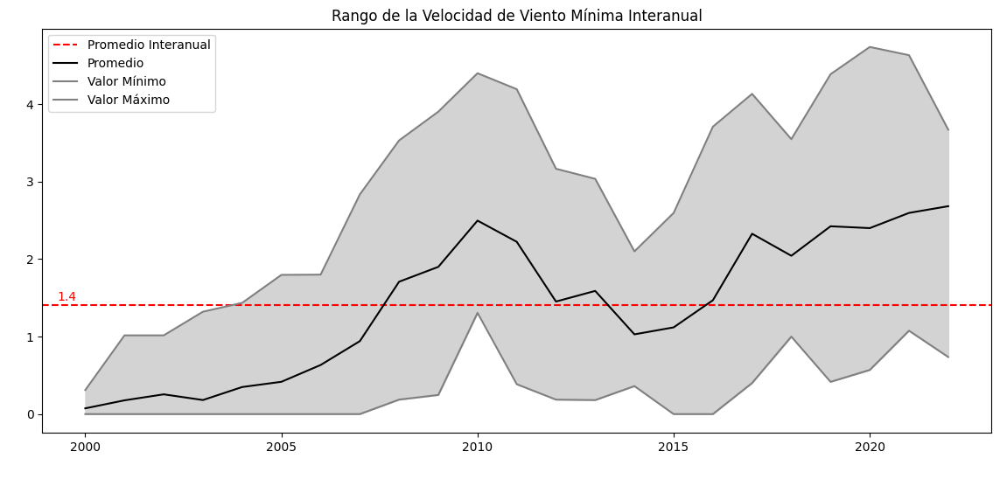

In [33]:
VeloMin_pivot = VeloMin.pivot_table(index=VeloMin.index.year, columns='Mes', values='Velocidad_de_Viento_Minima', aggfunc='mean')

VMin_anual = pd.DataFrame()  # Crear un nuevo DataFrame vacío

# Calcular promedio por gestión y agregarlo al nuevo DataFrame
VMin_anual['Promedio'] = VeloMin_pivot.mean(axis=1)

# Calcular valor mínimo por gestión y agregarlo al nuevo DataFrame
VMin_anual['Valor Mínimo'] = VeloMin_pivot.min(axis=1)

# Calcular valor máximo por gestión y agregarlo al nuevo DataFrame
VMin_anual['Valor Máximo'] = VeloMin_pivot.max(axis=1)

# Calcular el promedio de Prec_anual
promedio_interanual_VMin = VMin_anual['Promedio'].mean()

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(14, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_interanual_VMin, color='r', linestyle='--', label='Promedio Interanual')
# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_interanual_VMin), xy=(0.5, promedio_interanual_VMin), xytext=(-370, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')


# Graficar el promedio en color negro
ax.plot(VMin_anual.index, VMin_anual['Promedio'], color='black', label='Promedio')

# Graficar los valores mínimo y máximo en color gris
ax.plot(VMin_anual.index, VMin_anual['Valor Mínimo'], color='gray', label='Valor Mínimo')
ax.plot(VMin_anual.index, VMin_anual['Valor Máximo'], color='gray', label='Valor Máximo')

# Colorear el área entre el valor mínimo y máximo con un color gris más claro
ax.fill_between(VMin_anual.index, VMin_anual['Valor Mínimo'], VMin_anual['Valor Máximo'], color='lightgray')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Rango de la Velocidad de Viento Mínima Interanual')
ax.legend()

# Mostrar el gráfico
plt.show()

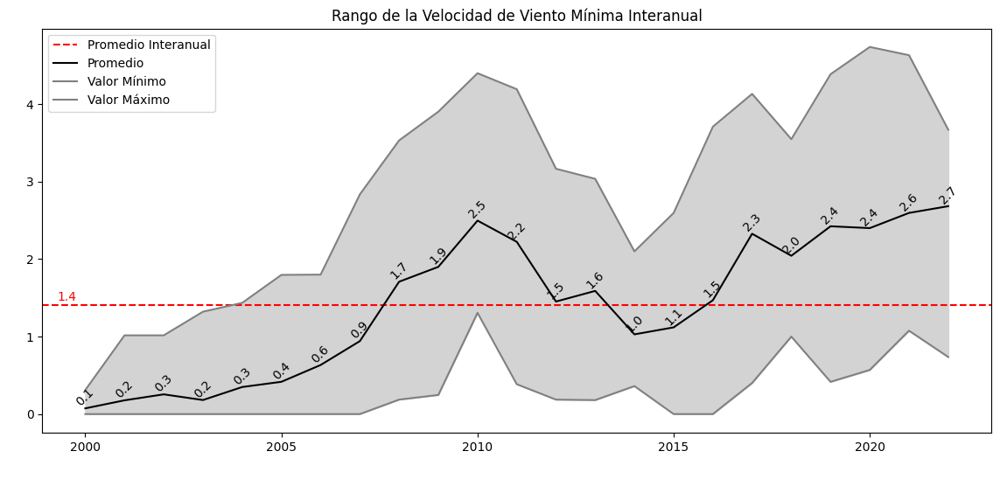

In [34]:
VeloMin_pivot = VeloMin.pivot_table(index=VeloMin.index.year, columns='Mes', values='Velocidad_de_Viento_Minima', aggfunc='mean')

VMin_anual = pd.DataFrame()  # Crear un nuevo DataFrame vacío

# Calcular promedio por gestión y agregarlo al nuevo DataFrame
VMin_anual['Promedio'] = VeloMin_pivot.mean(axis=1)

# Calcular valor mínimo por gestión y agregarlo al nuevo DataFrame
VMin_anual['Valor Mínimo'] = VeloMin_pivot.min(axis=1)

# Calcular valor máximo por gestión y agregarlo al nuevo DataFrame
VMin_anual['Valor Máximo'] = VeloMin_pivot.max(axis=1)

# Calcular el promedio de VMin_anual
promedio_interanual_VMin = VMin_anual['Promedio'].mean()

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(14, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_interanual_VMin, color='r', linestyle='--', label='Promedio Interanual')

# Agregar una anotación con el valor del promedio interanual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_interanual_VMin), xy=(0.5, promedio_interanual_VMin), xytext=(-370, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio en color negro
ax.plot(VMin_anual.index, VMin_anual['Promedio'], color='black', label='Promedio')

# Graficar los valores mínimo y máximo en color gris
ax.plot(VMin_anual.index, VMin_anual['Valor Mínimo'], color='gray', label='Valor Mínimo')
ax.plot(VMin_anual.index, VMin_anual['Valor Máximo'], color='gray', label='Valor Máximo')

# Colorear el área entre el valor mínimo y máximo con un color gris más claro
ax.fill_between(VMin_anual.index, VMin_anual['Valor Mínimo'], VMin_anual['Valor Máximo'], color='lightgray')

# Agregar etiquetas con los valores de la línea de promedio
linea_promedio = VMin_anual['Promedio'].values
for i, valor in enumerate(linea_promedio):
    ax.annotate('{:.1f}'.format(valor), xy=(VMin_anual.index[i], valor), ha='center', va='bottom', color='black', rotation=45)

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Rango de la Velocidad de Viento Mínima Interanual')
ax.legend()

# Mostrar el gráfico
plt.show()

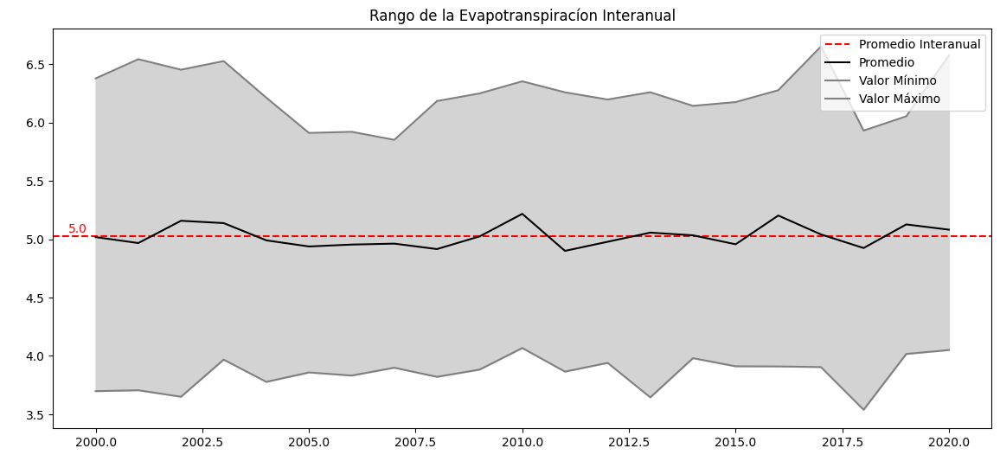

In [35]:
Evot_pivot = Evot.pivot_table(index=Evot.index.year, columns='Mes', values='eTo', aggfunc='mean')

Evapo_anual = pd.DataFrame()  # Crear un nuevo DataFrame vacío

# Calcular promedio por gestión y agregarlo al nuevo DataFrame
Evapo_anual['Promedio'] = Evot_pivot.mean(axis=1)

# Calcular valor mínimo por gestión y agregarlo al nuevo DataFrame
Evapo_anual['Valor Mínimo'] = Evot_pivot.min(axis=1)

# Calcular valor máximo por gestión y agregarlo al nuevo DataFrame
Evapo_anual['Valor Máximo'] = Evot_pivot.max(axis=1)

# Calcular el promedio de Prec_anual
promedio_interanual_Evapo = Evapo_anual['Promedio'].mean()

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(14, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_interanual_Evapo, color='r', linestyle='--', label='Promedio Interanual')
# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_interanual_Evapo), xy=(0.5, promedio_interanual_Evapo), xytext=(-370, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')


# Graficar el promedio en color negro
ax.plot(Evapo_anual.index, Evapo_anual['Promedio'], color='black', label='Promedio')

# Graficar los valores mínimo y máximo en color gris
ax.plot(Evapo_anual.index, Evapo_anual['Valor Mínimo'], color='gray', label='Valor Mínimo')
ax.plot(Evapo_anual.index, Evapo_anual['Valor Máximo'], color='gray', label='Valor Máximo')

# Colorear el área entre el valor mínimo y máximo con un color gris más claro
ax.fill_between(Evapo_anual.index, Evapo_anual['Valor Mínimo'], Evapo_anual['Valor Máximo'], color='lightgray')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Rango de la Evapotranspiracíon Interanual')
ax.legend()

# Mostrar el gráfico
plt.show()


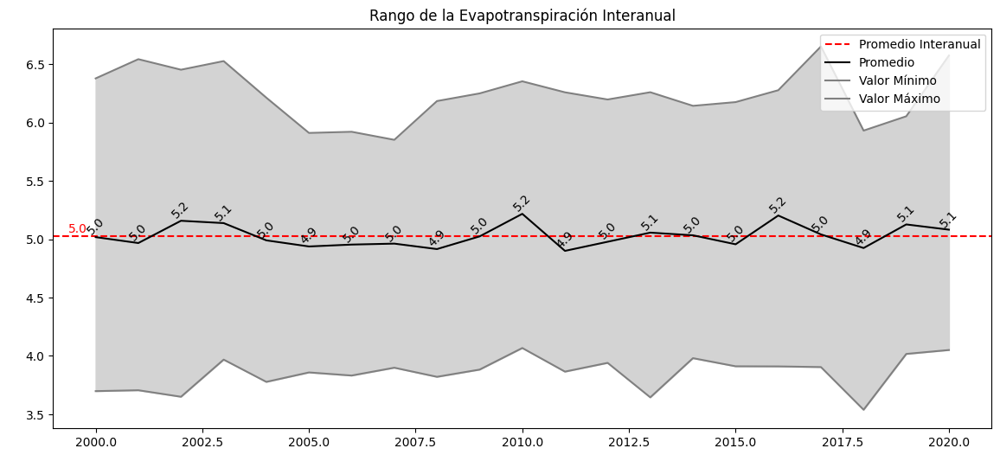

In [36]:
Evot_pivot = Evot.pivot_table(index=Evot.index.year, columns='Mes', values='eTo', aggfunc='mean')

Evapo_anual = pd.DataFrame()  # Crear un nuevo DataFrame vacío

# Calcular promedio por gestión y agregarlo al nuevo DataFrame
Evapo_anual['Promedio'] = Evot_pivot.mean(axis=1)

# Calcular valor mínimo por gestión y agregarlo al nuevo DataFrame
Evapo_anual['Valor Mínimo'] = Evot_pivot.min(axis=1)

# Calcular valor máximo por gestión y agregarlo al nuevo DataFrame
Evapo_anual['Valor Máximo'] = Evot_pivot.max(axis=1)

# Calcular el promedio de Evapo_anual
promedio_interanual_Evapo = Evapo_anual['Promedio'].mean()

# Configurar el tamaño de la figura
fig, ax = plt.subplots(figsize=(14, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_interanual_Evapo, color='r', linestyle='--', label='Promedio Interanual')

# Agregar una anotación con el valor del promedio interanual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_interanual_Evapo), xy=(0.5, promedio_interanual_Evapo), xytext=(-370, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio en color negro
ax.plot(Evapo_anual.index, Evapo_anual['Promedio'], color='black', label='Promedio')

# Graficar los valores mínimo y máximo en color gris
ax.plot(Evapo_anual.index, Evapo_anual['Valor Mínimo'], color='gray', label='Valor Mínimo')
ax.plot(Evapo_anual.index, Evapo_anual['Valor Máximo'], color='gray', label='Valor Máximo')

# Colorear el área entre el valor mínimo y máximo con un color gris más claro
ax.fill_between(Evapo_anual.index, Evapo_anual['Valor Mínimo'], Evapo_anual['Valor Máximo'], color='lightgray')

# Agregar etiquetas con los valores de la línea de promedio
linea_promedio = Evapo_anual['Promedio'].values
for i, valor in enumerate(linea_promedio):
    ax.annotate('{:.1f}'.format(valor), xy=(Evapo_anual.index[i], valor), ha='center', va='bottom', color='black', rotation=45)

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Rango de la Evapotranspiración Interanual')
ax.legend()

# Mostrar el gráfico
plt.show()

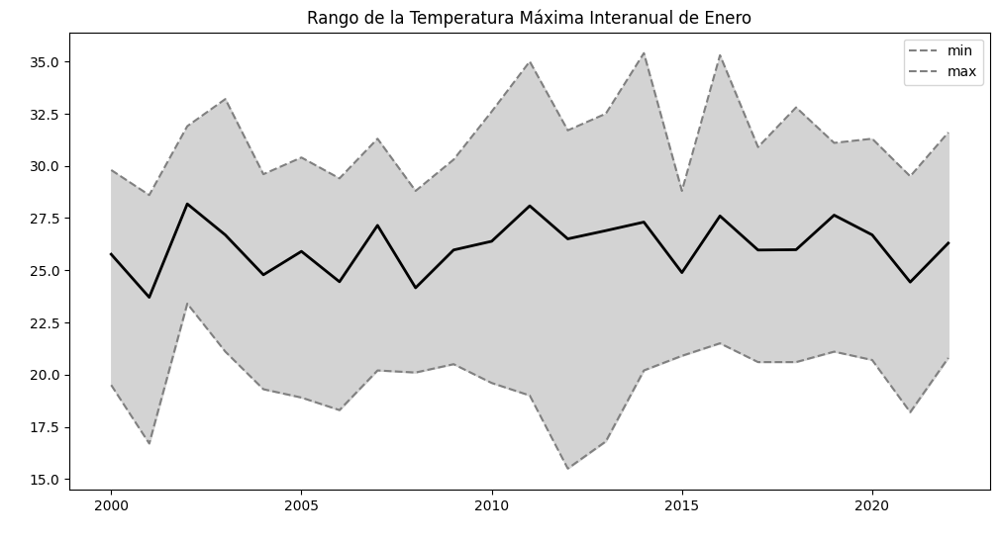

In [37]:
# Obtener el año de cada fecha
df1['Año'] = df1.index.year

# Filtrar el dataframe para obtener solo los datos del mes de enero
df_enero = df1[df1.index.month == 1]

# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Maxima' por año
TMax_En = df_enero.groupby(df_enero.index.year)['Temperatura_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMax_En['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMax_En[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMax_En.index, TMax_En['min'], TMax_En['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Máxima Interanual de Enero')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

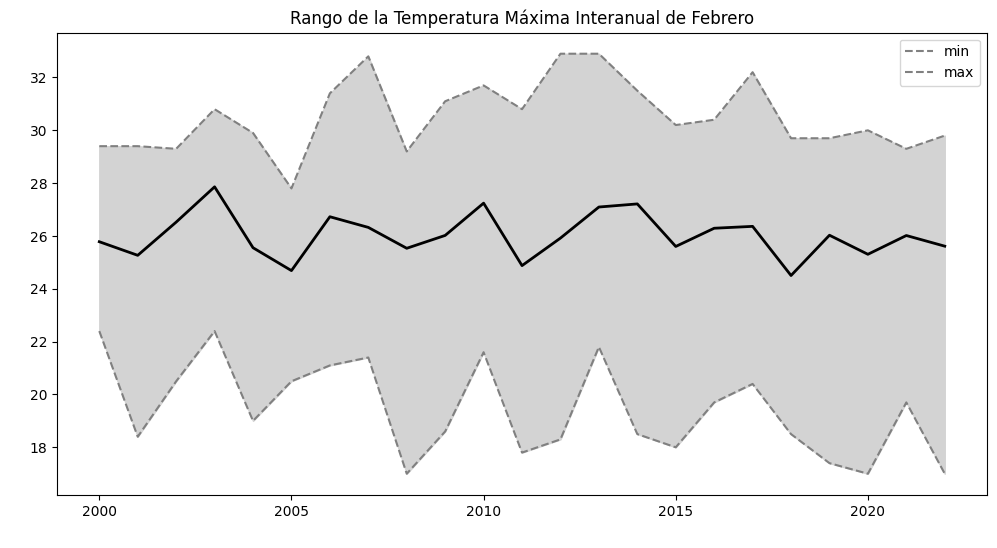

In [38]:
# Filtrar el dataframe para obtener solo los datos del mes de febrero
df_febrero = df1[df1.index.month == 2]

# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Maxima' por año
TMax_Fe = df_febrero.groupby(df_febrero.index.year)['Temperatura_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMax_Fe['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMax_Fe[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMax_Fe.index, TMax_Fe['min'], TMax_Fe['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Máxima Interanual de Febrero')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

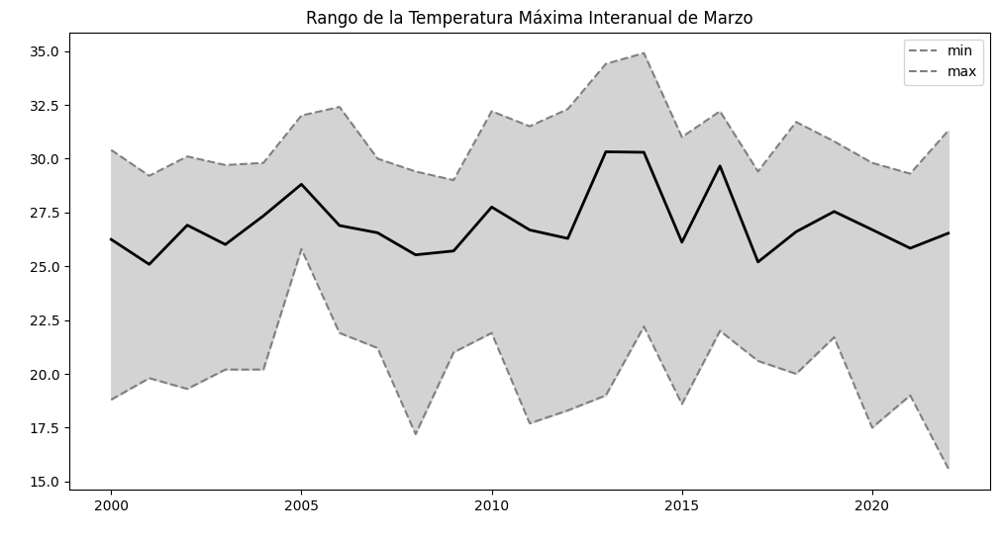

In [39]:
# Filtrar el dataframe para obtener solo los datos del mes de marzo
df_marzo = df1[df1.index.month == 3]

# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Maxima' por año
TMax_Ma = df_marzo.groupby(df_marzo.index.year)['Temperatura_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMax_Ma['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMax_Ma[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMax_Ma.index, TMax_Ma['min'], TMax_Ma['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Máxima Interanual de Marzo')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


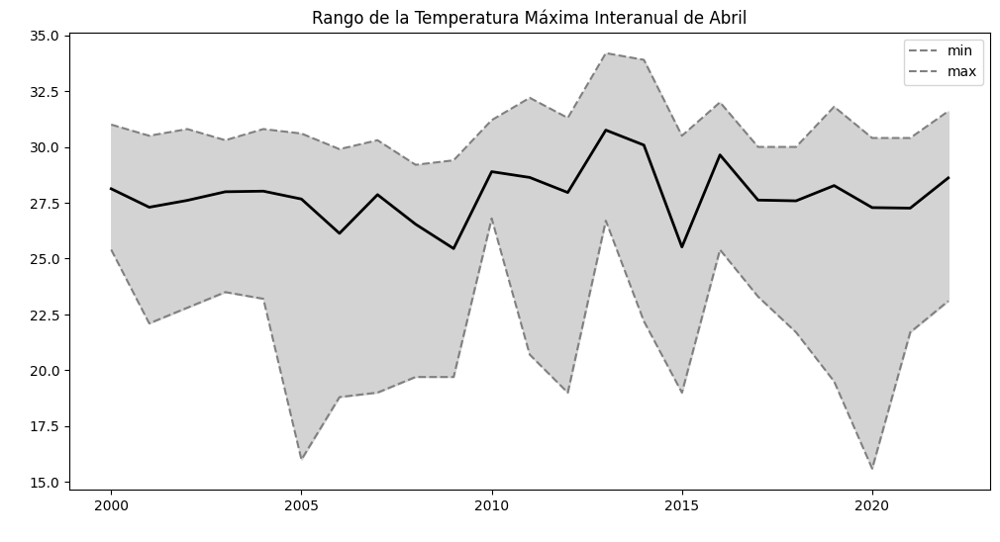

In [40]:
# Filtrar el dataframe para obtener solo los datos del mes de abril
df_abril = df1[df1.index.month == 4]

# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Maxima' por año
TMax_Ab = df_abril.groupby(df_abril.index.year)['Temperatura_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMax_Ab['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMax_Ab[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMax_Ab.index, TMax_Ab['min'], TMax_Ab['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Máxima Interanual de Abril')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

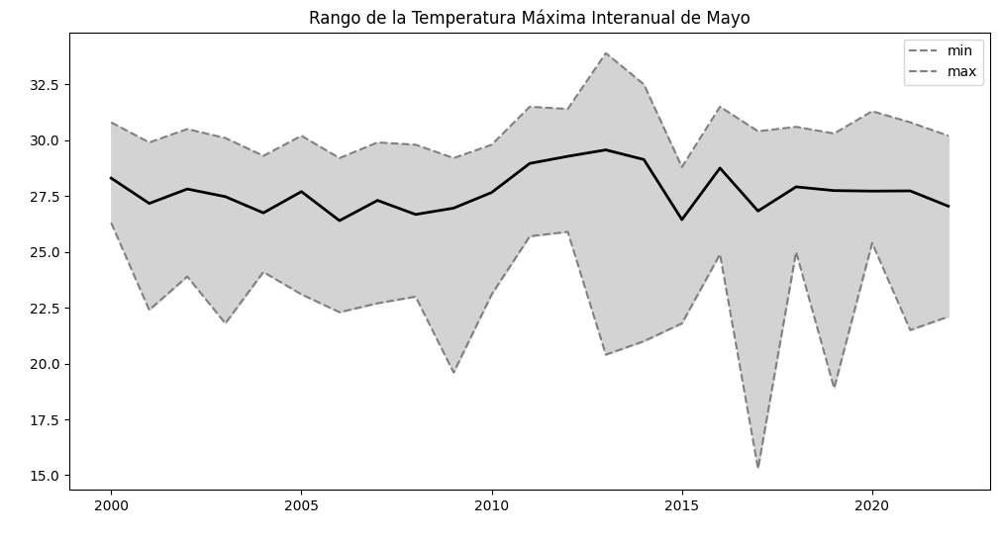

In [41]:
# Filtrar el dataframe para obtener solo los datos del mes de mayo
df_mayo = df1[df1.index.month == 5]

# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Maxima' por año
TMax_May = df_mayo.groupby(df_mayo.index.year)['Temperatura_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMax_May['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMax_May[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMax_May.index, TMax_May['min'], TMax_May['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Máxima Interanual de Mayo')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

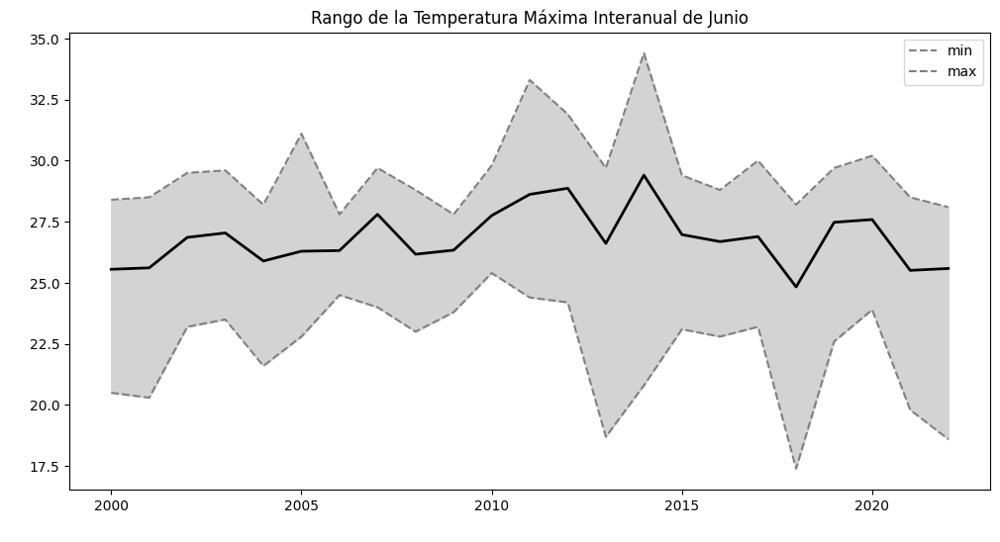

In [42]:
# Filtrar el dataframe para obtener solo los datos del mes de junio
df_junio = df1[df1.index.month == 6]

# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Maxima' por año
TMax_Jun = df_junio.groupby(df_junio.index.year)['Temperatura_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMax_Jun['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMax_Jun[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMax_Jun.index, TMax_Jun['min'], TMax_Jun['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Máxima Interanual de Junio')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

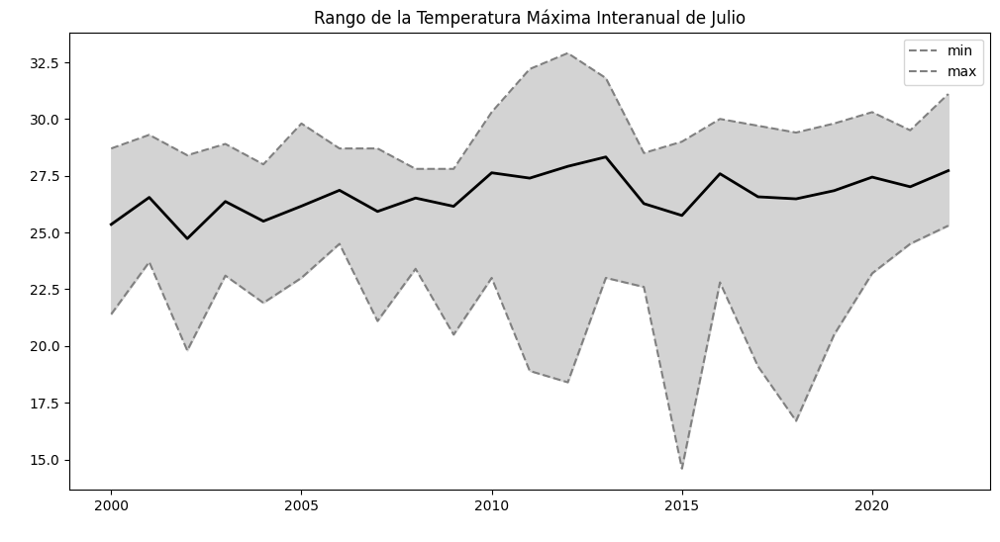

In [43]:
# Filtrar el dataframe para obtener solo los datos del mes de Julio
df_julio = df1[df1.index.month == 7]

# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Maxima' por año
TMax_Jul = df_julio.groupby(df_julio.index.year)['Temperatura_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMax_Jul['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMax_Jul[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMax_Jul.index, TMax_Jul['min'], TMax_Jul['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Máxima Interanual de Julio')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

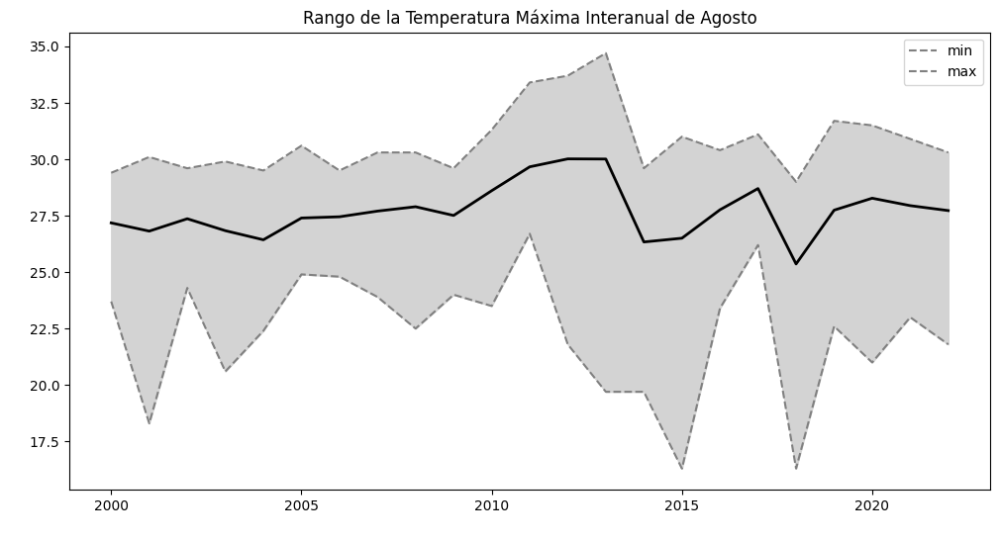

In [44]:
# Filtrar el dataframe para obtener solo los datos del mes de Agosto
df_Agosto = df1[df1.index.month == 8]

# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Maxima' por año
TMax_Agos = df_Agosto.groupby(df_Agosto.index.year)['Temperatura_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMax_Agos['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMax_Agos[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMax_Agos.index, TMax_Agos['min'], TMax_Agos['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Máxima Interanual de Agosto')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()



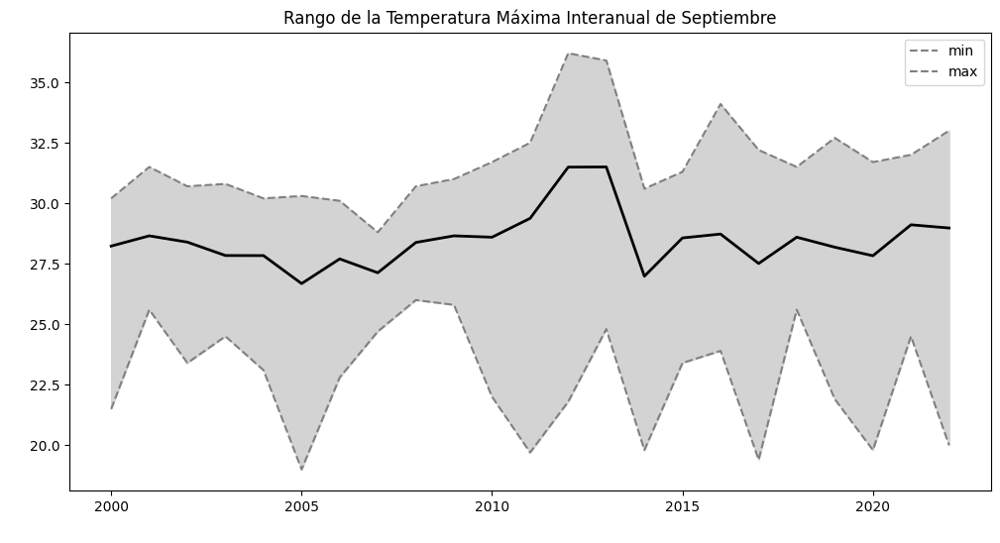

In [45]:
# Filtrar el dataframe para obtener solo los datos del mes de Septiembre
df_Septiembre = df1[df1.index.month == 9]

# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Maxima' por año
TMax_Sept = df_Septiembre.groupby(df_Septiembre.index.year)['Temperatura_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMax_Sept['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMax_Sept[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMax_Sept.index, TMax_Sept['min'], TMax_Sept['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Máxima Interanual de Septiembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

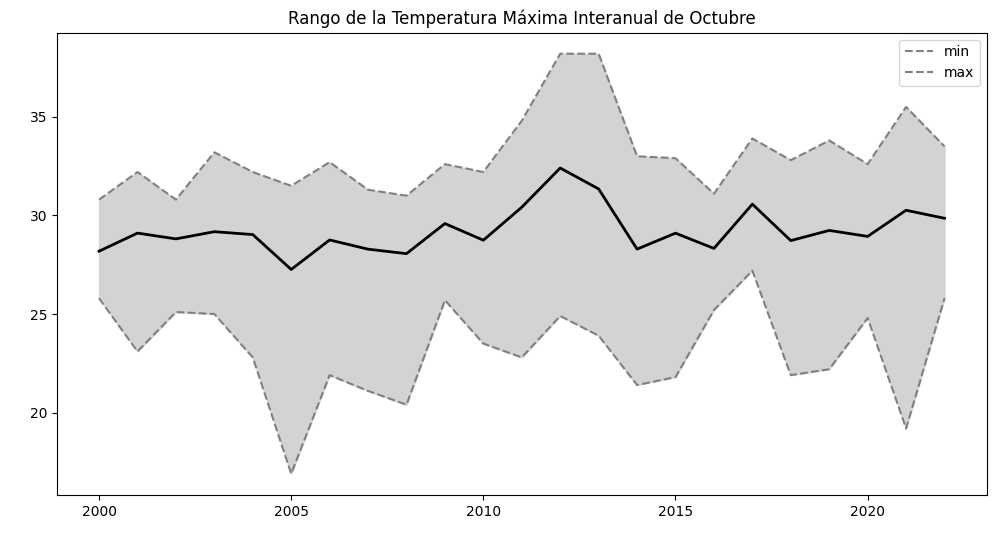

In [46]:
# Filtrar el dataframe para obtener solo los datos del mes de Octubre
df_Octubre = df1[df1.index.month == 10]

# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Maxima' por año
TMax_Oct = df_Octubre.groupby(df_Octubre.index.year)['Temperatura_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMax_Oct['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMax_Oct[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMax_Oct.index, TMax_Oct['min'], TMax_Oct['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Máxima Interanual de Octubre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()



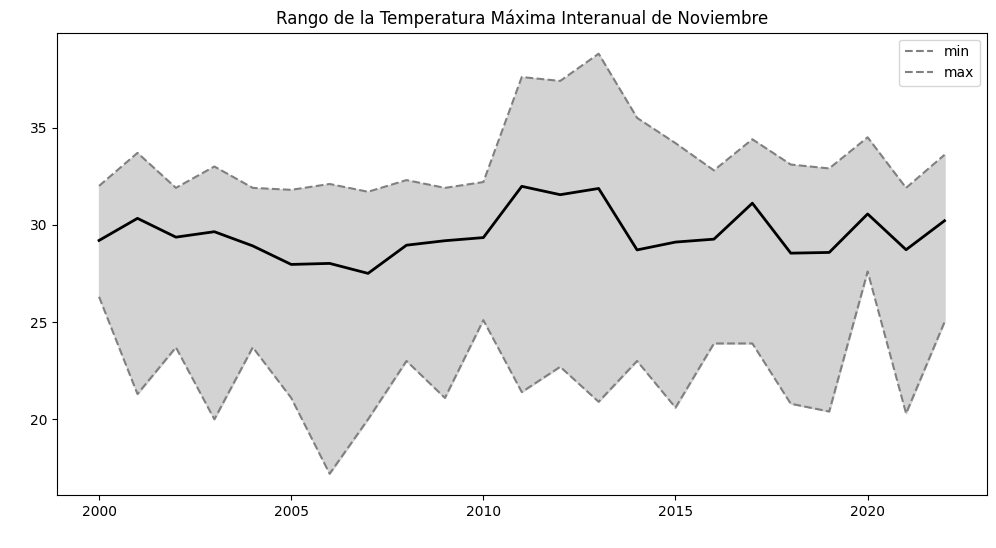

In [47]:
# Filtrar el dataframe para obtener solo los datos del mes de Noviembre
df_Noviembre = df1[df1.index.month == 11]

# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Maxima' por año
TMax_Nov = df_Noviembre.groupby(df_Noviembre.index.year)['Temperatura_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMax_Nov['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMax_Nov[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMax_Nov.index, TMax_Nov['min'], TMax_Nov['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Máxima Interanual de Noviembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()



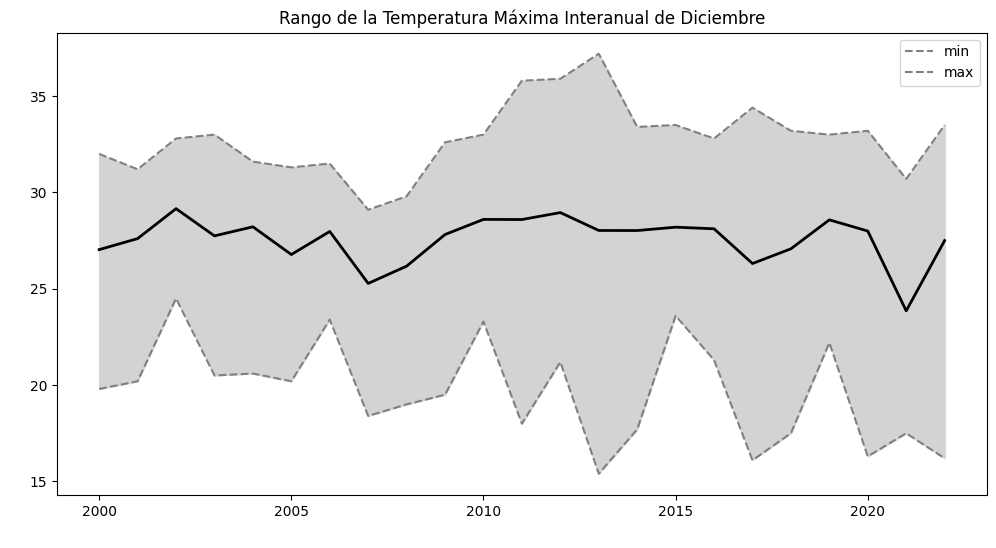

In [48]:
# Filtrar el dataframe para obtener solo los datos del mes de Diciembre
df_Diciembre = df1[df1.index.month == 12]

# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Maxima' por año
TMax_Dic = df_Diciembre.groupby(df_Diciembre.index.year)['Temperatura_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMax_Dic['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMax_Dic[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMax_Dic.index, TMax_Dic['min'], TMax_Dic['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Máxima Interanual de Diciembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

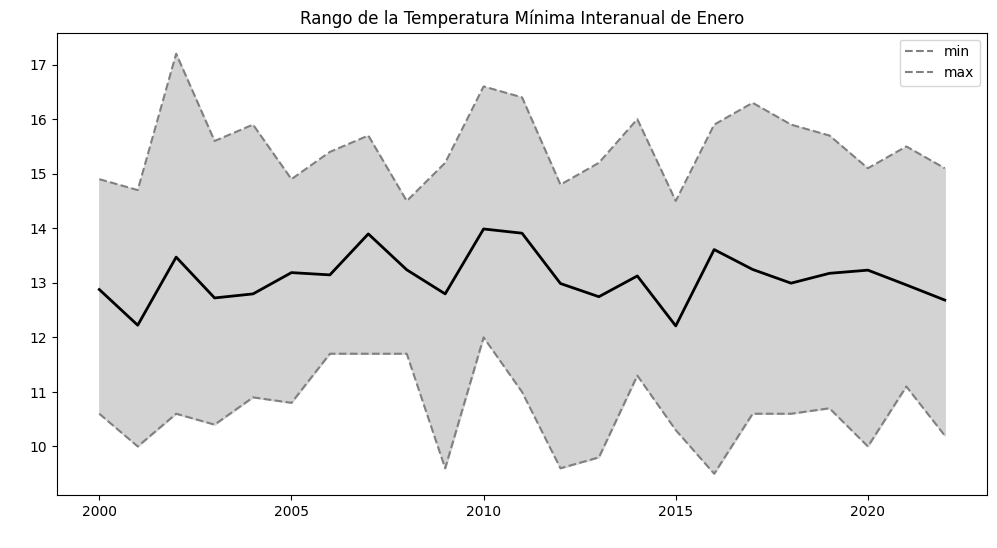

In [147]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Minima' por año
TMin_En = df_enero.groupby(df_enero.index.year)['Temperatura_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMin_En['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMin_En[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMin_En.index, TMin_En['min'], TMin_En['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Mínima Interanual de Enero')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

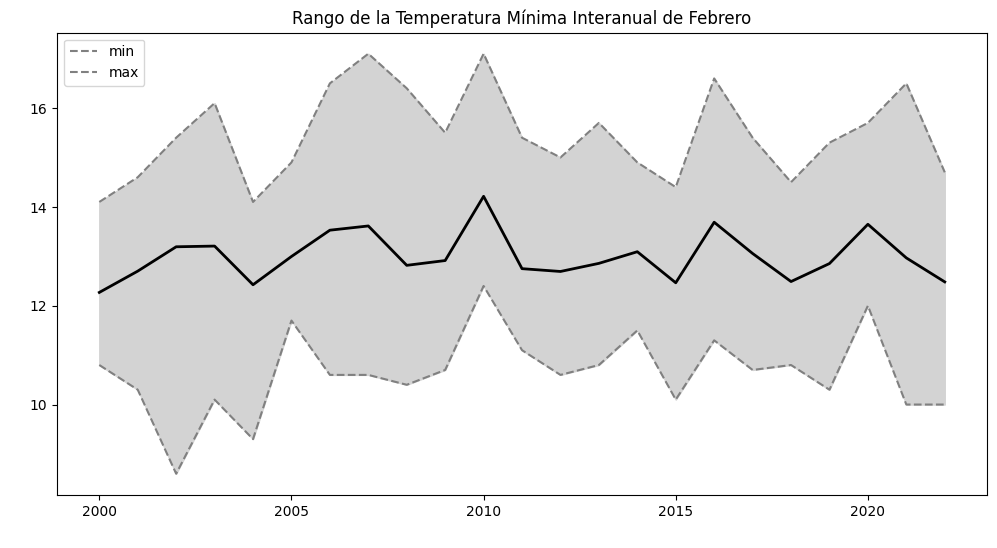

In [50]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Minima' por año
TMin_Fe = df_febrero.groupby(df_febrero.index.year)['Temperatura_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMin_Fe['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMin_Fe[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMin_Fe.index, TMin_Fe['min'], TMin_Fe['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Mínima Interanual de Febrero')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()



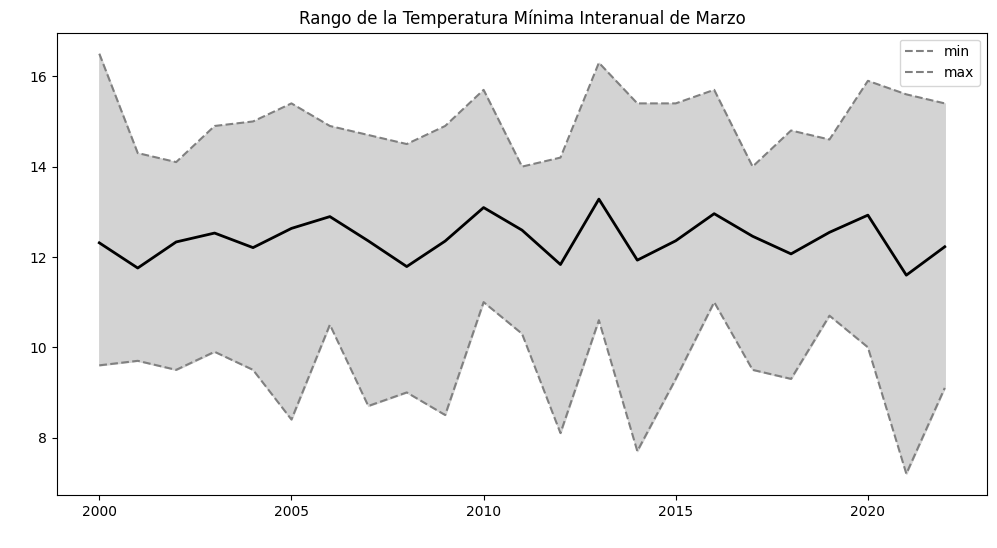

In [51]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Minima' por año
TMin_Ma = df_marzo.groupby(df_marzo.index.year)['Temperatura_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMin_Ma['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMin_Ma[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMin_Ma.index, TMin_Ma['min'], TMin_Ma['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Mínima Interanual de Marzo')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()



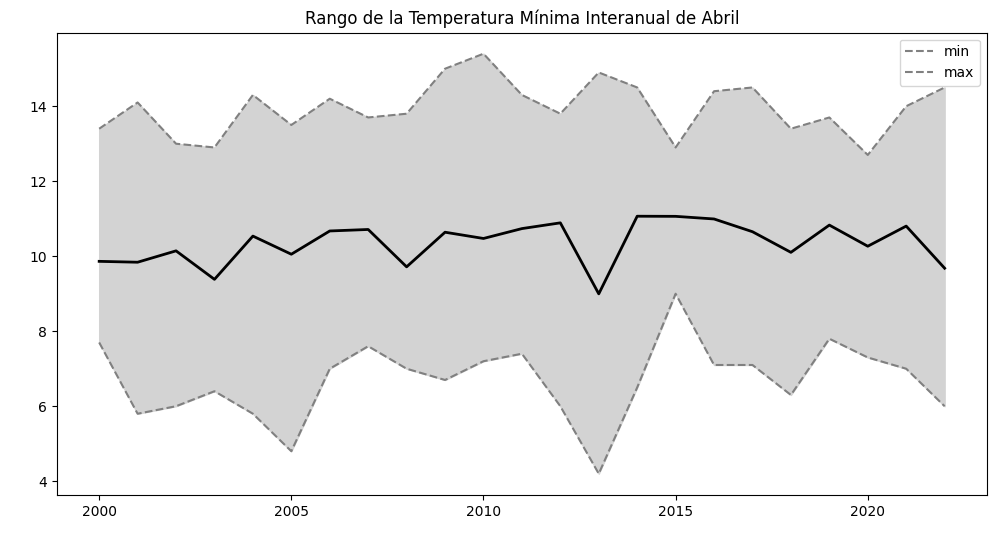

In [52]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Minima' por año
TMin_Ab = df_abril.groupby(df_abril.index.year)['Temperatura_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMin_Ab['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMin_Ab[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMin_Ab.index, TMin_Ab['min'], TMin_Ab['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Mínima Interanual de Abril')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

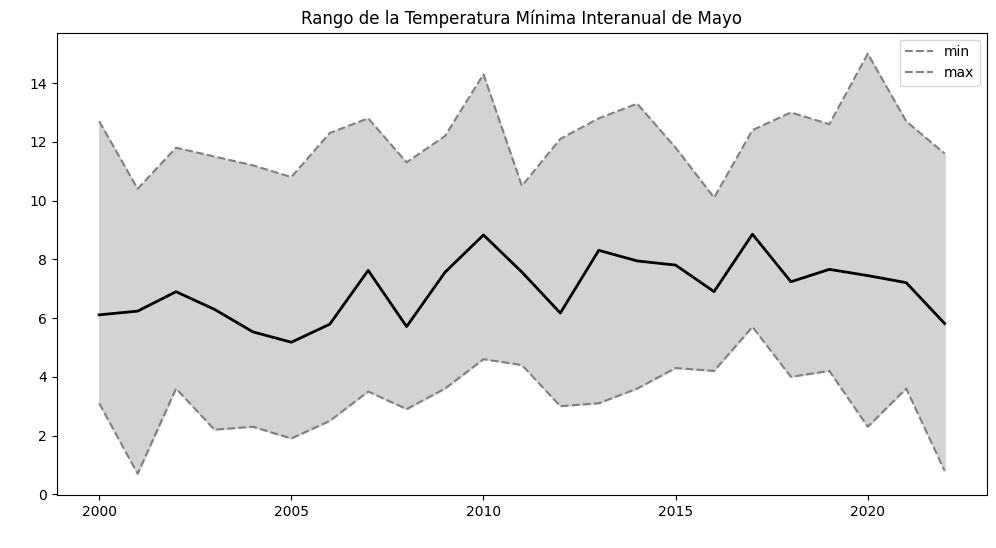

In [53]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Minima' por año
TMin_May = df_mayo.groupby(df_mayo.index.year)['Temperatura_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMin_May['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMin_May[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMin_May.index, TMin_May['min'], TMin_May['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Mínima Interanual de Mayo')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()



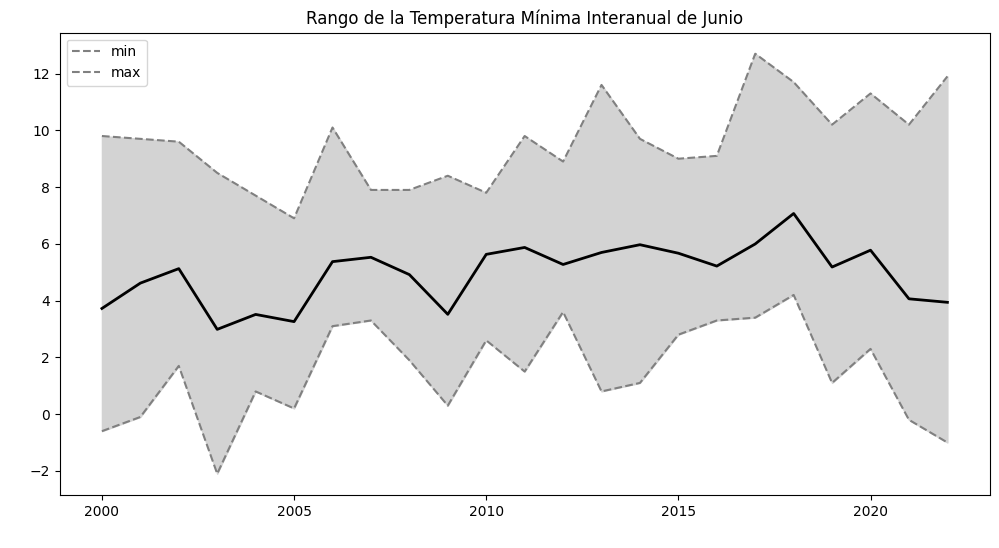

In [54]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Minima' por año
TMin_Jun = df_junio.groupby(df_junio.index.year)['Temperatura_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMin_Jun['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMin_Jun[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMin_Jun.index, TMin_Jun['min'], TMin_Jun['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Mínima Interanual de Junio')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

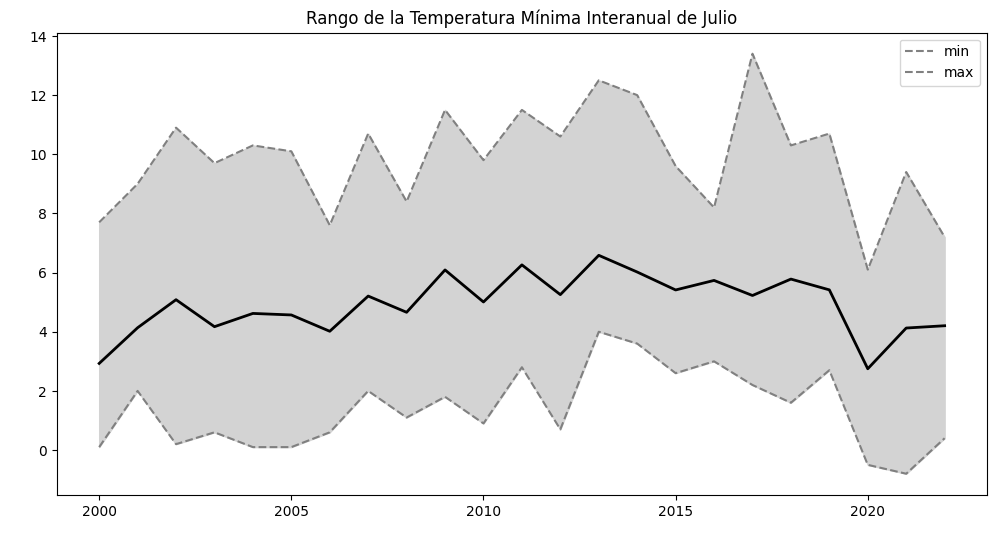

In [55]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Minima' por año
TMin_Jul = df_julio.groupby(df_julio.index.year)['Temperatura_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMin_Jul['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMin_Jul[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMin_Jul.index, TMin_Jul['min'], TMin_Jul['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Mínima Interanual de Julio')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

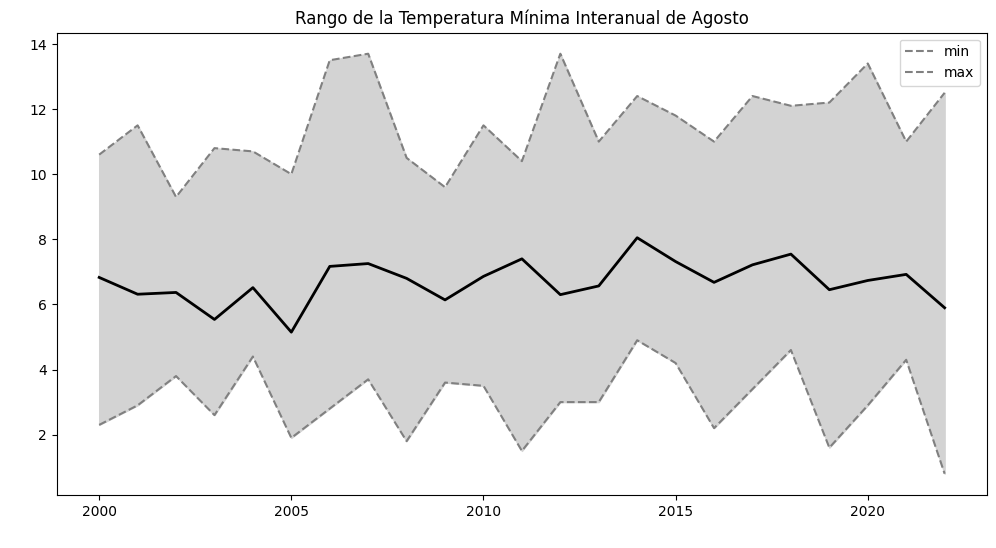

In [56]:
 # Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Minima' por año
TMin_Agos = df_Agosto.groupby(df_Agosto.index.year)['Temperatura_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMin_Agos['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMin_Agos[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMin_Agos.index, TMin_Agos['min'], TMin_Agos['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Mínima Interanual de Agosto')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

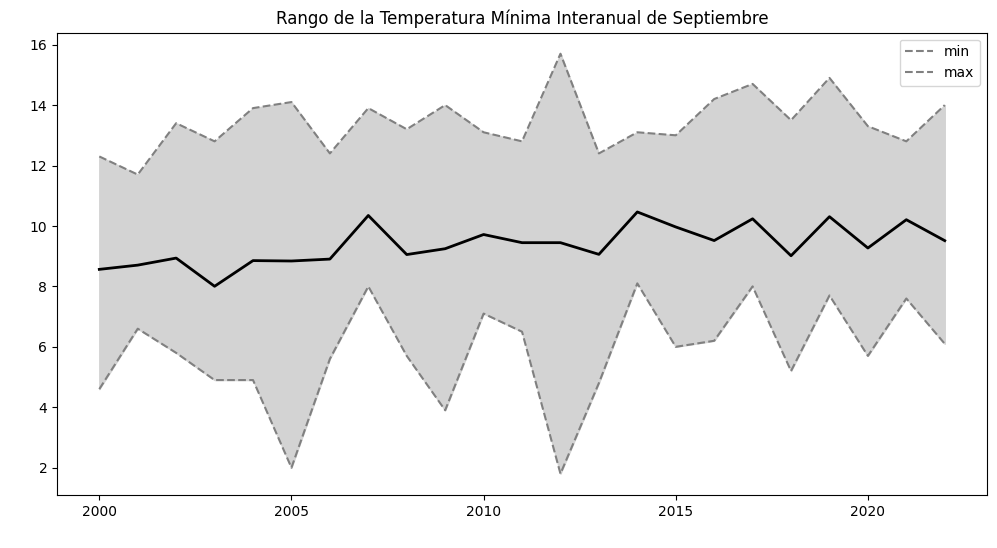

In [57]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Minima' por año
TMin_Sept = df_Septiembre.groupby(df_Septiembre.index.year)['Temperatura_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMin_Sept['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMin_Sept[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMin_Sept.index, TMin_Sept['min'], TMin_Sept['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Mínima Interanual de Septiembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

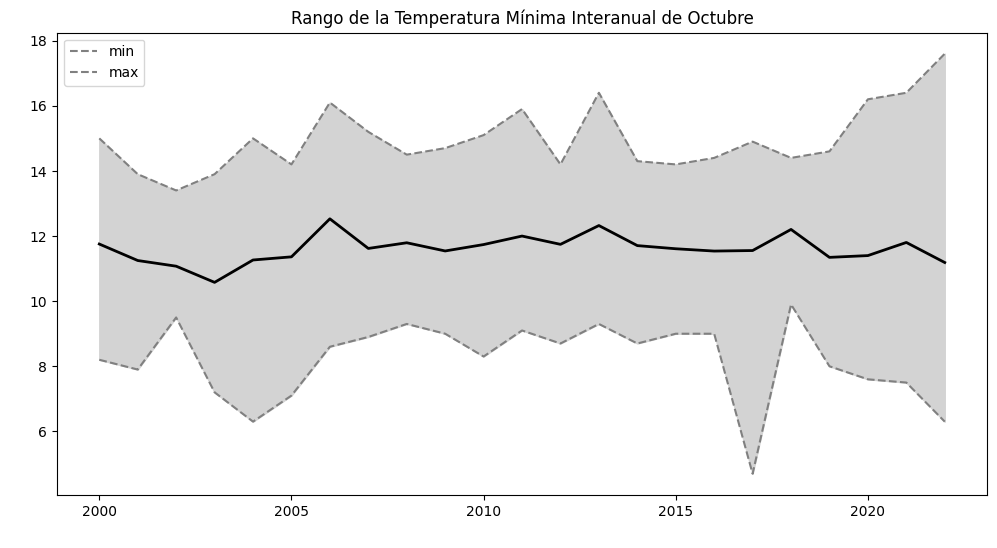

In [58]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Minima' por año
TMin_Oct = df_Octubre.groupby(df_Octubre.index.year)['Temperatura_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMin_Oct['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMin_Oct[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMin_Oct.index, TMin_Oct['min'], TMin_Oct['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Mínima Interanual de Octubre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

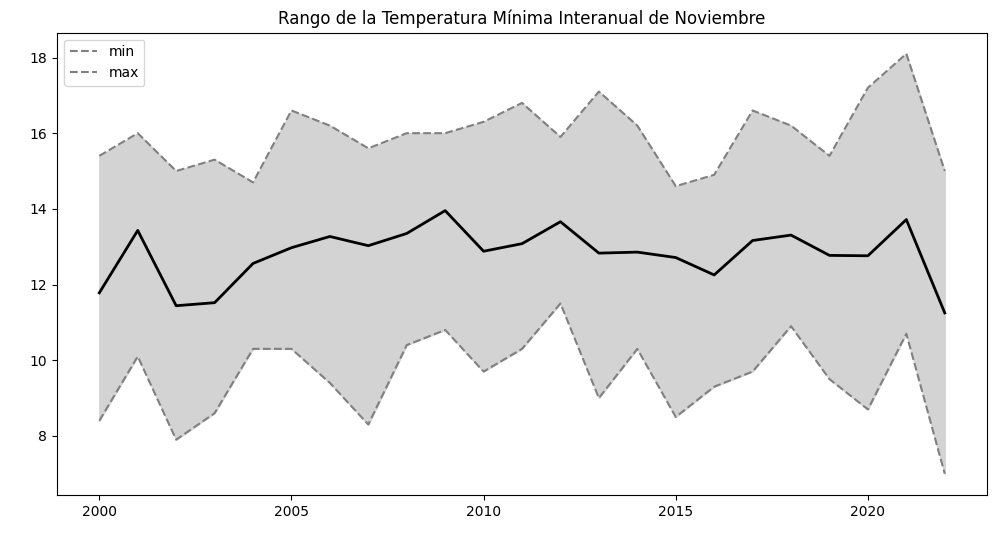

In [59]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Minima' por año
TMin_Nov = df_Noviembre.groupby(df_Noviembre.index.year)['Temperatura_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMin_Nov['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMin_Nov[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMin_Nov.index, TMin_Nov['min'], TMin_Nov['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Mínima Interanual de Noviembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()



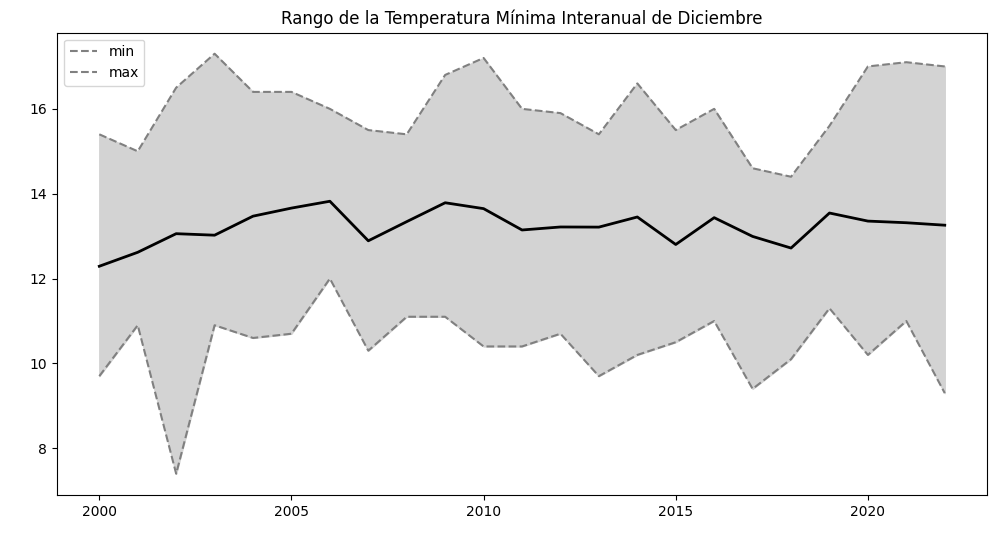

In [60]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Temperatura_Minima' por año
TMin_Dic = df_Diciembre.groupby(df_Diciembre.index.year)['Temperatura_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
TMin_Dic['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
TMin_Dic[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(TMin_Dic.index, TMin_Dic['min'], TMin_Dic['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Temperatura Mínima Interanual de Diciembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

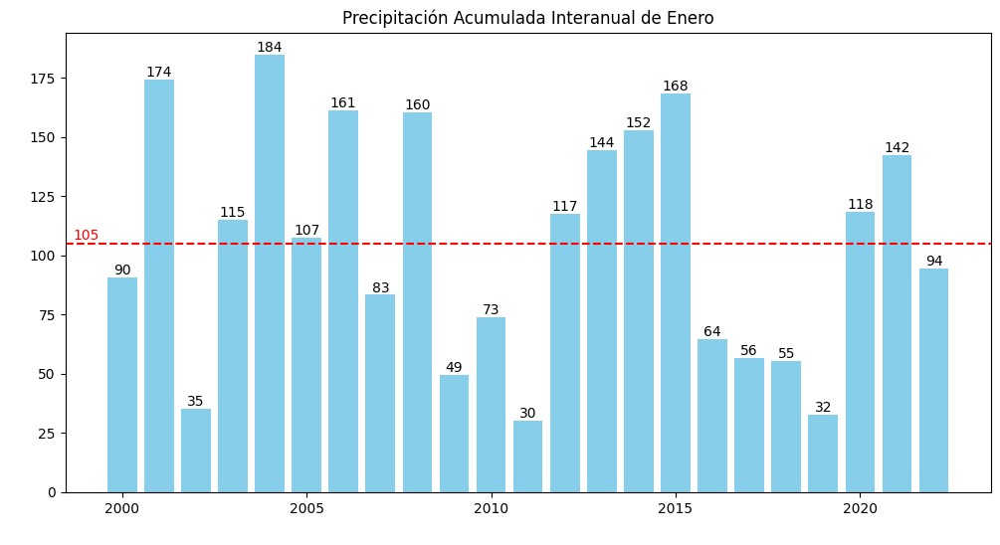

In [61]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘Precipitacion’ por año
Prec_Ene = df_enero.groupby(df_enero.index.year)['Precipitacion'].agg(['sum'])

# Calcular el promedio de Prec_anual
promedio_anual_enero = Prec_Ene['sum'].mean()

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_anual_enero, color='r', linestyle='--', label='Promedio Anual')

# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.0f}'.format(promedio_anual_enero), xy=(0.5, promedio_anual_enero), xytext=(-320, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio con barras
bars = ax.bar(Prec_Ene.index, Prec_Ene['sum'].values, color='skyblue')

# Configurar el título y las etiquetas de los ejes
ax.set_title('Precipitación Acumulada Interanual de Enero')
ax.set_xlabel(' ')
ax.set_ylabel(' ')

# Colocar los valores encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

# Mostrar las líneas de la cuadrícula en el eje y para mejor referencia
#ax.yaxis.grid(True)

# Mostrar el gráfico
plt.show()

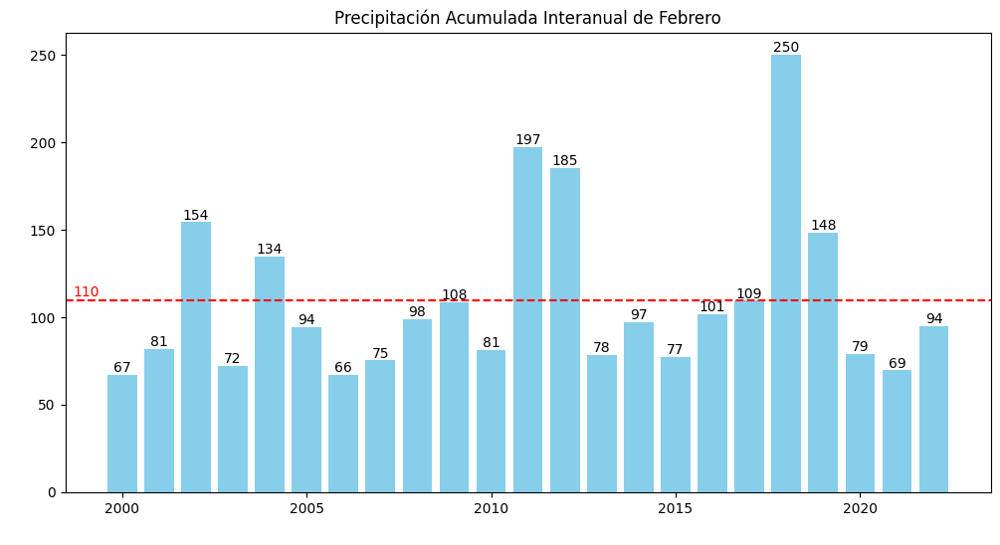

In [62]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘Precipitacion’ por año
Prec_Feb = df_febrero.groupby(df_febrero.index.year)['Precipitacion'].agg(['sum'])

# Calcular el promedio de Prec_anual
promedio_anual_febrero = Prec_Feb['sum'].mean()

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_anual_febrero, color='r', linestyle='--', label='Promedio Anual')

# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.0f}'.format(promedio_anual_febrero), xy=(0.5, promedio_anual_febrero), xytext=(-320, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio con barras
bars = ax.bar(Prec_Feb.index, Prec_Feb['sum'].values, color='skyblue')

# Configurar el título y las etiquetas de los ejes
ax.set_title('Precipitación Acumulada Interanual de Febrero')
ax.set_xlabel(' ')
ax.set_ylabel(' ')

# Colocar los valores encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

# Mostrar las líneas de la cuadrícula en el eje y para mejor referencia
#ax.yaxis.grid(True)

# Mostrar el gráfico
plt.show()


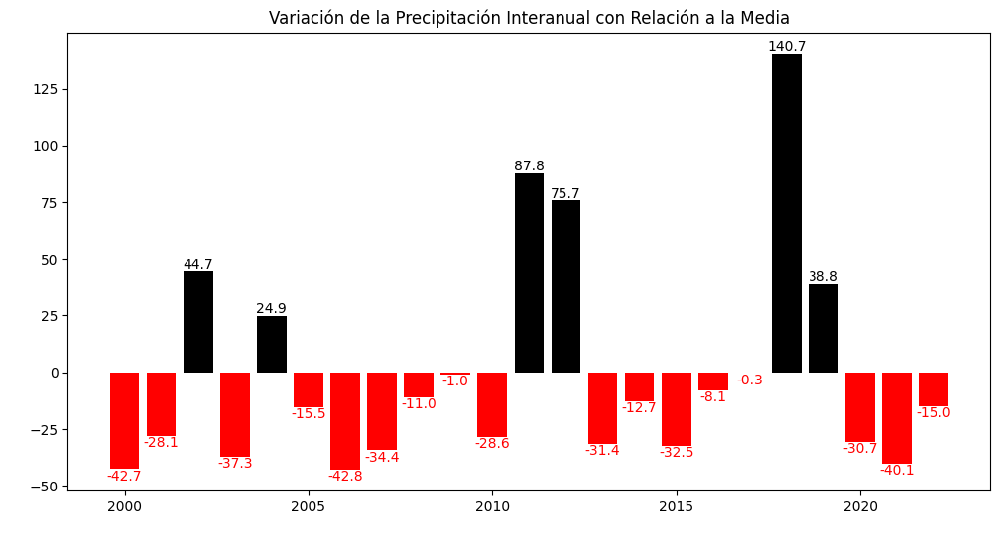

In [63]:
#ajuste = (Prec_anual['Acumulacion'] - promedio_anual) / promedio_anual * 100
ajuste = (Prec_Feb['sum'] - promedio_anual_febrero)
Prec_anual_prom = pd.DataFrame(ajuste.values, index=Prec_anual.index, columns=['Acumulacion Porcentual'])

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=(12, 6))

gestiones = Prec_anual_prom.index
acumulacion = Prec_anual_prom['Acumulacion Porcentual']

# Generar la lista de colores para las barras según si su valor es negativo o no
colores = []
for valor in acumulacion:
    if valor >= 0:
        colores.append('black')
    else:
        colores.append('red')

# Graficar las barras en el eje con el color correspondiente
ax.bar(gestiones, acumulacion, color=colores)

# Graficar los valores encima/debajo de cada barra según su signo
for i, valor in enumerate(acumulacion):
    if valor < 0:
        ax.annotate('{:.1f}'.format(valor), (gestiones[i], valor), ha='center', va='top', color='red')
    else:
        ax.annotate('{:.1f}'.format(valor), (gestiones[i], valor), ha='center', va='bottom')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Variación de la Precipitación Interanual con Relación a la Media')

# Mostrar el gráfico
plt.show()

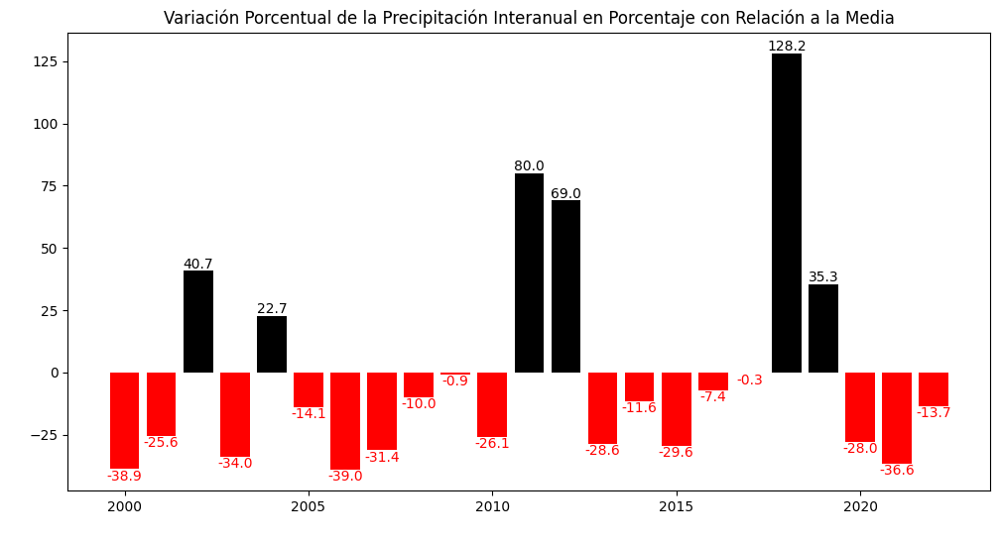

In [64]:
ajuste = (Prec_Feb['sum'] - promedio_anual_febrero)/ promedio_anual_febrero *100
Prec_anual_prom = pd.DataFrame(ajuste.values, index=Prec_anual.index, columns=['Acumulacion Porcentual'])

# Crear una figura y un eje
fig, ax = plt.subplots(figsize=(12, 6))

gestiones = Prec_anual_prom.index
acumulacion = Prec_anual_prom['Acumulacion Porcentual']

# Generar la lista de colores para las barras según si su valor es negativo o no
colores = []
for valor in acumulacion:
    if valor >= 0:
        colores.append('black')
    else:
        colores.append('red')

# Graficar las barras en el eje con el color correspondiente
ax.bar(gestiones, acumulacion, color=colores)

# Graficar los valores encima/debajo de cada barra según su signo
for i, valor in enumerate(acumulacion):
    if valor < 0:
        ax.annotate('{:.1f}'.format(valor), (gestiones[i], valor), ha='center', va='top', color='red')
    else:
        ax.annotate('{:.1f}'.format(valor), (gestiones[i], valor), ha='center', va='bottom')

# Configurar el gráfico
ax.set_xlabel(' ')
ax.set_ylabel(' ')
ax.set_title('Variación Porcentual de la Precipitación Interanual en Porcentaje con Relación a la Media')

# Mostrar el gráfico
plt.show()

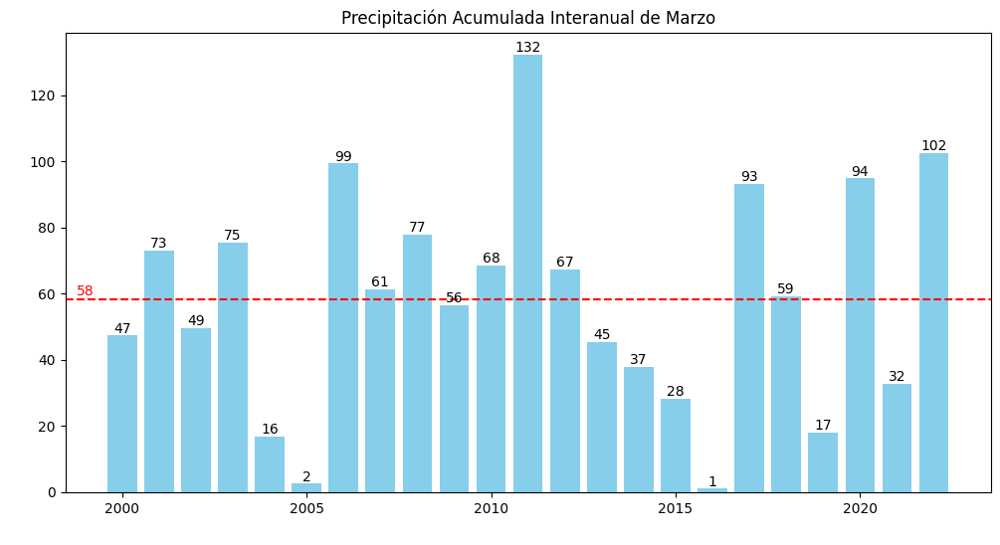

In [65]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘Precipitacion’ por año
Prec_Mar = df_marzo.groupby(df_marzo.index.year)['Precipitacion'].agg(['sum'])

# Calcular el promedio de Prec_anual
promedio_anual_marzo = Prec_Mar['sum'].mean()

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_anual_marzo, color='r', linestyle='--', label='Promedio Anual')

# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.0f}'.format(promedio_anual_marzo), xy=(0.5, promedio_anual_marzo), xytext=(-320, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio con barras
bars = ax.bar(Prec_Mar.index, Prec_Mar['sum'].values, color='skyblue')

# Configurar el título y las etiquetas de los ejes
ax.set_title('Precipitación Acumulada Interanual de Marzo')
ax.set_xlabel(' ')
ax.set_ylabel(' ')

# Colocar los valores encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

# Mostrar las líneas de la cuadrícula en el eje y para mejor referencia
#ax.yaxis.grid(True)

# Mostrar el gráfico
plt.show()

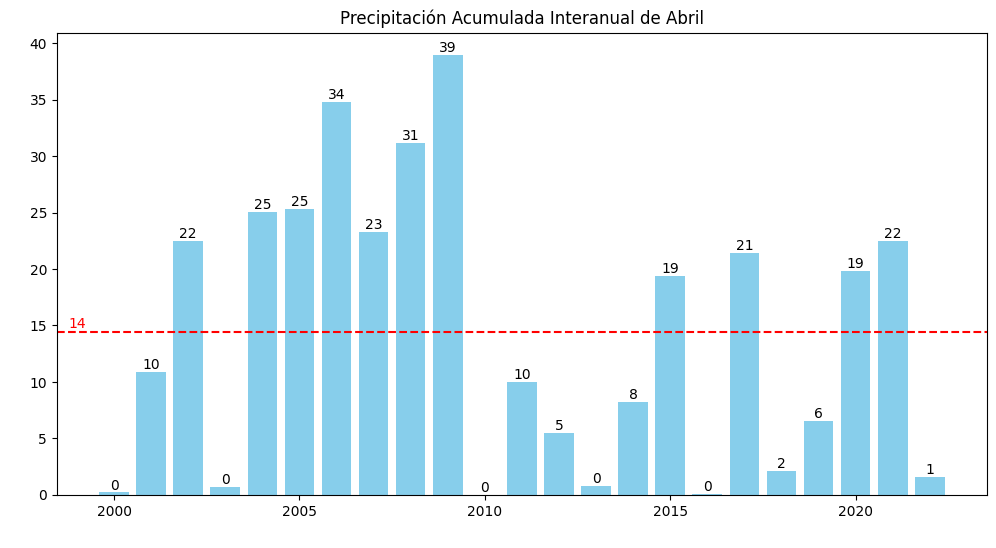

In [66]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘Precipitacion’ por año
Prec_Abr = df_abril.groupby(df_abril.index.year)['Precipitacion'].agg(['sum'])

# Calcular el promedio de Prec_anual
promedio_anual_abril = Prec_Abr['sum'].mean()

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_anual_abril, color='r', linestyle='--', label='Promedio Anual')

# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.0f}'.format(promedio_anual_abril), xy=(0.5, promedio_anual_abril), xytext=(-320, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')


# Graficar el promedio con barras
bars = ax.bar(Prec_Abr.index, Prec_Abr['sum'].values, color='skyblue')

# Configurar el título y las etiquetas de los ejes
ax.set_title('Precipitación Acumulada Interanual de Abril')
ax.set_xlabel(' ')
ax.set_ylabel(' ')

# Colocar los valores encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

# Mostrar las líneas de la cuadrícula en el eje y para mejor referencia
#ax.yaxis.grid(True)

# Mostrar el gráfico
plt.show()


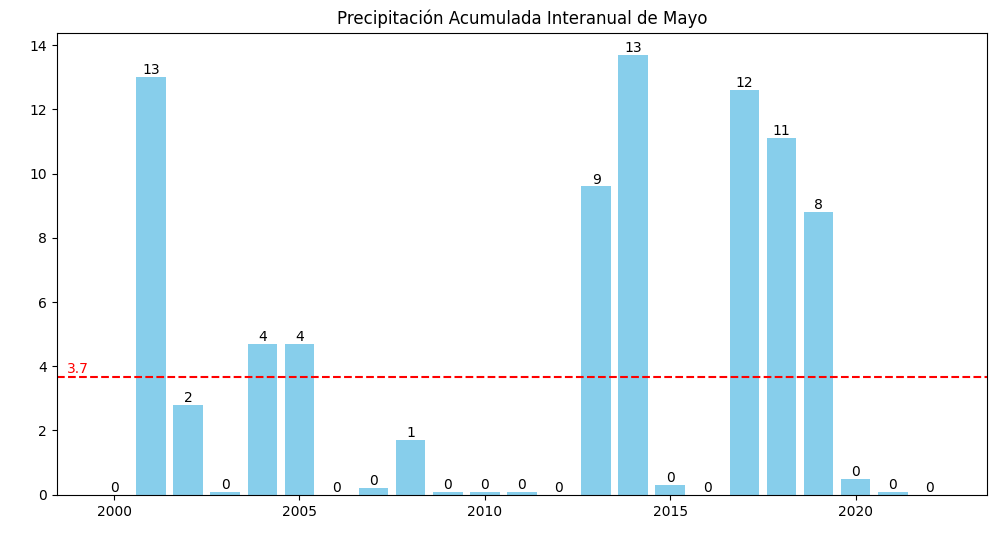

In [67]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘Precipitacion’ por año
Prec_May = df_mayo.groupby(df_mayo.index.year)['Precipitacion'].agg(['sum'])

# Calcular el promedio de Prec_anual
promedio_anual_mayo = Prec_May['sum'].mean()

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_anual_mayo, color='r', linestyle='--', label='Promedio Anual')

# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_anual_mayo), xy=(0.5, promedio_anual_mayo), xytext=(-320, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio con barras
bars = ax.bar(Prec_May.index, Prec_May['sum'].values, color='skyblue')

# Configurar el título y las etiquetas de los ejes
ax.set_title('Precipitación Acumulada Interanual de Mayo')
ax.set_xlabel(' ')
ax.set_ylabel(' ')

# Colocar los valores encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

# Mostrar las líneas de la cuadrícula en el eje y para mejor referencia
#ax.yaxis.grid(True)

# Mostrar el gráfico
plt.show()


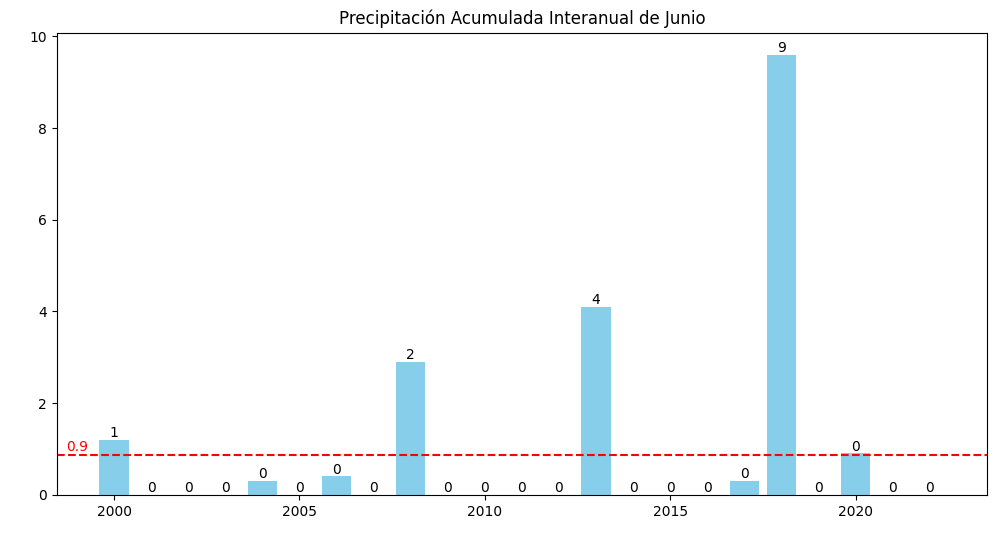

In [68]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘Precipitacion’ por año
Prec_Jun = df_junio.groupby(df_junio.index.year)['Precipitacion'].agg(['sum'])

# Calcular el promedio de Prec_anual
promedio_anual_junio = Prec_Jun['sum'].mean()

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_anual_junio, color='r', linestyle='--', label='Promedio Anual')

# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_anual_junio), xy=(0.5, promedio_anual_junio), xytext=(-320, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')


# Graficar el promedio con barras
bars = ax.bar(Prec_Jun.index, Prec_Jun['sum'].values, color='skyblue')

# Configurar el título y las etiquetas de los ejes
ax.set_title('Precipitación Acumulada Interanual de Junio')
ax.set_xlabel(' ')
ax.set_ylabel(' ')

# Colocar los valores encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

# Mostrar las líneas de la cuadrícula en el eje y para mejor referencia
#ax.yaxis.grid(True)

# Mostrar el gráfico
plt.show()


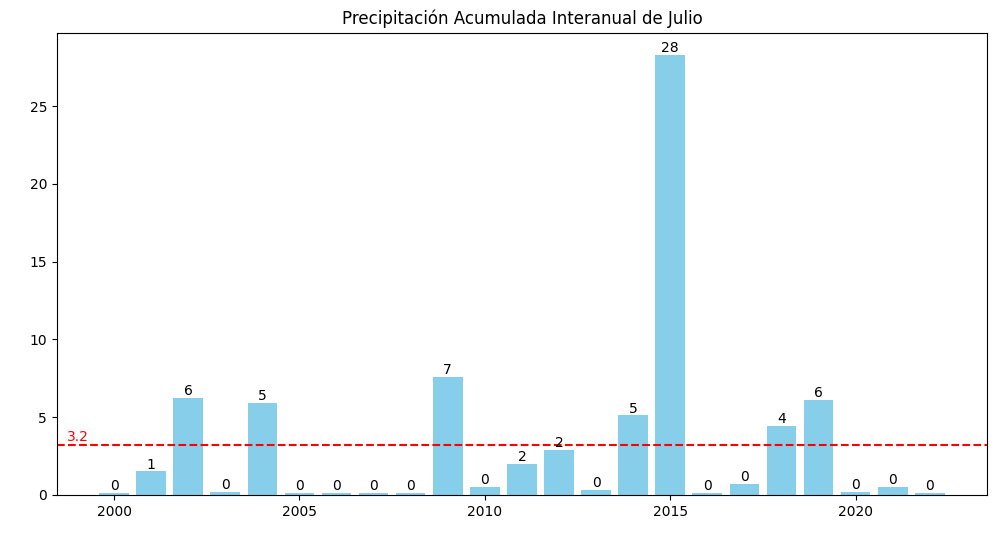

In [69]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘Precipitacion’ por año
Prec_Jul = df_julio.groupby(df_julio.index.year)['Precipitacion'].agg(['sum'])

# Calcular el promedio de Prec_anual
promedio_anual_julio = Prec_Jul['sum'].mean()

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_anual_julio, color='r', linestyle='--', label='Promedio Anual')

# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_anual_julio), xy=(0.5, promedio_anual_julio), xytext=(-320, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio con barras
bars = ax.bar(Prec_Jul.index, Prec_Jul['sum'].values, color='skyblue')

# Configurar el título y las etiquetas de los ejes
ax.set_title('Precipitación Acumulada Interanual de Julio')
ax.set_xlabel(' ')
ax.set_ylabel(' ')

# Colocar los valores encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

# Mostrar las líneas de la cuadrícula en el eje y para mejor referencia
#ax.yaxis.grid(True)

# Mostrar el gráfico
plt.show()

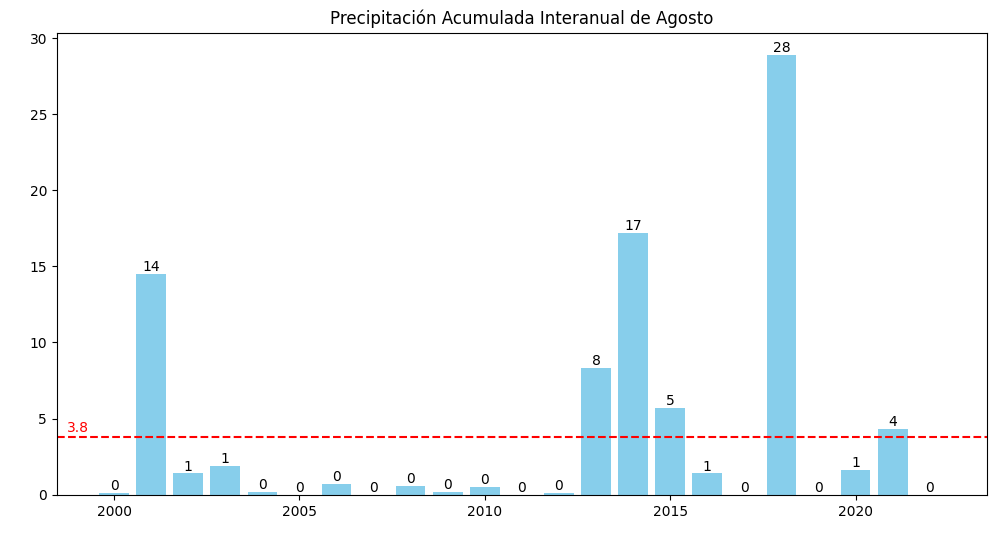

In [70]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘Precipitacion’ por año
Prec_Agt = df_Agosto.groupby(df_Agosto.index.year)['Precipitacion'].agg(['sum'])

# Calcular el promedio de Prec_anual
promedio_anual_agosto = Prec_Agt['sum'].mean()

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_anual_agosto, color='r', linestyle='--', label='Promedio Anual')

# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_anual_agosto), xy=(0.5, promedio_anual_agosto), xytext=(-320, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')


# Graficar el promedio con barras
bars = ax.bar(Prec_Agt.index, Prec_Agt['sum'].values, color='skyblue')

# Configurar el título y las etiquetas de los ejes
ax.set_title('Precipitación Acumulada Interanual de Agosto')
ax.set_xlabel(' ')
ax.set_ylabel(' ')

# Colocar los valores encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

# Mostrar las líneas de la cuadrícula en el eje y para mejor referencia
#ax.yaxis.grid(True)

# Mostrar el gráfico
plt.show()


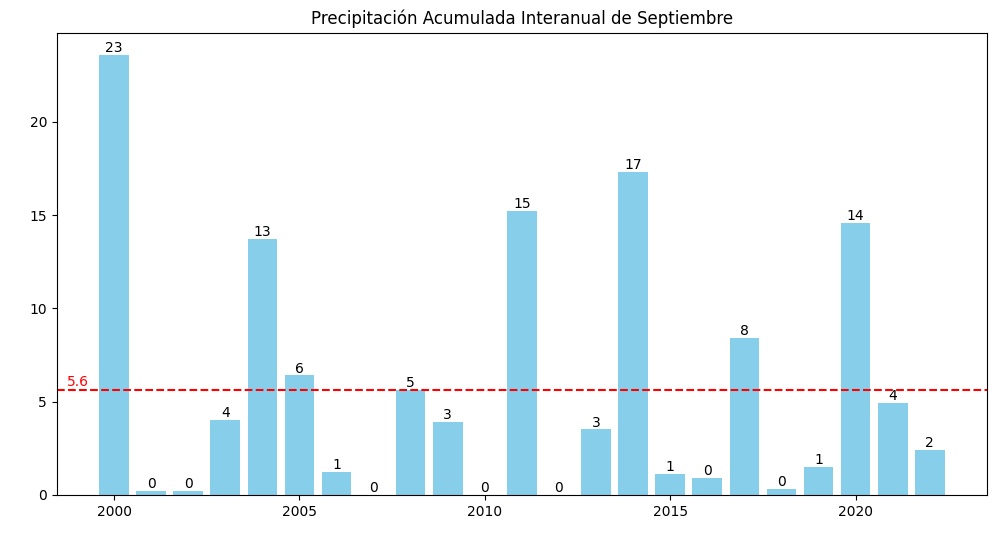

In [71]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘Precipitacion’ por año
Prec_Sep = df_Septiembre.groupby(df_Septiembre.index.year)['Precipitacion'].agg(['sum'])

# Calcular el promedio de Prec_anual
promedio_anual_septiembre = Prec_Sep['sum'].mean()

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_anual_septiembre, color='r', linestyle='--', label='Promedio Anual')

# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_anual_septiembre), xy=(0.5, promedio_anual_septiembre), xytext=(-320, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')


# Graficar el promedio con barras
bars = ax.bar(Prec_Sep.index, Prec_Sep['sum'].values, color='skyblue')

# Configurar el título y las etiquetas de los ejes
ax.set_title('Precipitación Acumulada Interanual de Septiembre')
ax.set_xlabel(' ')
ax.set_ylabel(' ')

# Colocar los valores encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

# Mostrar las líneas de la cuadrícula en el eje y para mejor referencia
#ax.yaxis.grid(True)

# Mostrar el gráfico
plt.show()


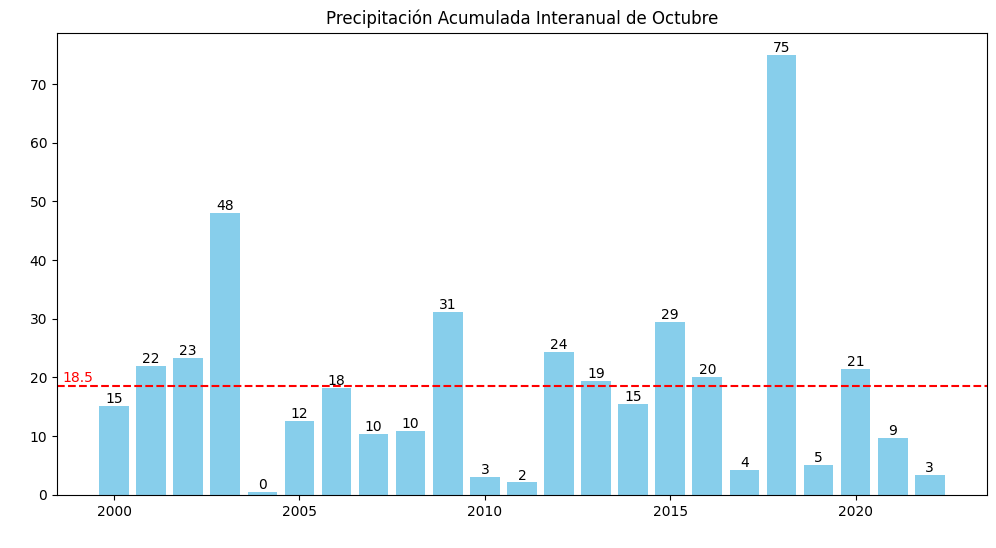

In [72]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘Precipitacion’ por año
Prec_Oct = df_Octubre.groupby(df_Octubre.index.year)['Precipitacion'].agg(['sum'])

# Calcular el promedio de Prec_anual
promedio_anual_octubre = Prec_Oct['sum'].mean()

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_anual_octubre, color='r', linestyle='--', label='Promedio Anual')

# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_anual_octubre), xy=(0.5, promedio_anual_octubre), xytext=(-320, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio con barras
bars = ax.bar(Prec_Oct.index, Prec_Oct['sum'].values, color='skyblue')

# Configurar el título y las etiquetas de los ejes
ax.set_title('Precipitación Acumulada Interanual de Octubre')
ax.set_xlabel(' ')
ax.set_ylabel(' ')

# Colocar los valores encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

# Mostrar las líneas de la cuadrícula en el eje y para mejor referencia
#ax.yaxis.grid(True)

# Mostrar el gráfico
plt.show()


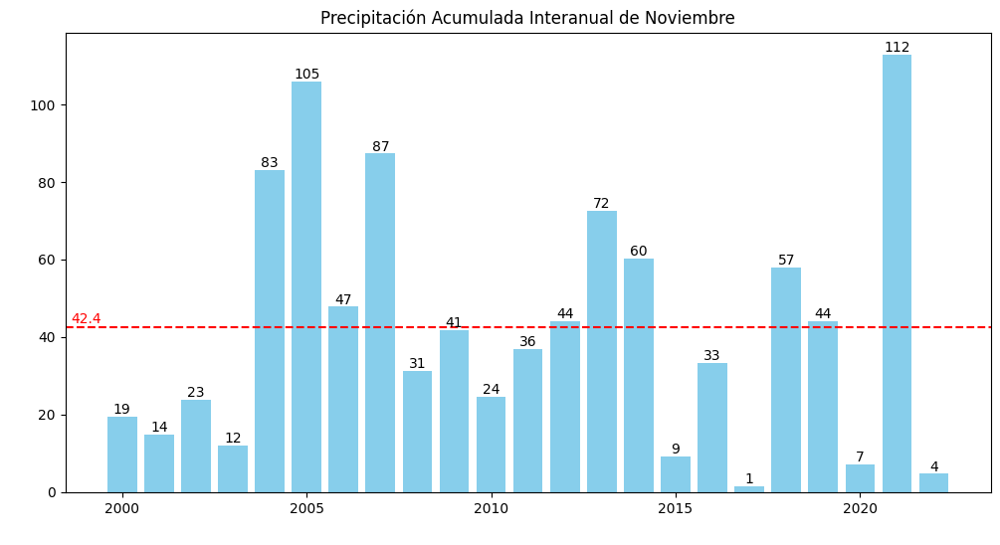

In [73]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘Precipitacion’ por año
Prec_Nov = df_Noviembre.groupby(df_Noviembre.index.year)['Precipitacion'].agg(['sum'])

# Calcular el promedio de Prec_anual
promedio_anual_noviembre = Prec_Nov['sum'].mean()

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_anual_noviembre, color='r', linestyle='--', label='Promedio Anual')

# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_anual_noviembre), xy=(0.5, promedio_anual_noviembre), xytext=(-320, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio con barras
bars = ax.bar(Prec_Nov.index, Prec_Nov['sum'].values, color='skyblue')

# Configurar el título y las etiquetas de los ejes
ax.set_title('Precipitación Acumulada Interanual de Noviembre')
ax.set_xlabel(' ')
ax.set_ylabel(' ')

# Colocar los valores encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

# Mostrar las líneas de la cuadrícula en el eje y para mejor referencia
#ax.yaxis.grid(True)

# Mostrar el gráfico
plt.show()


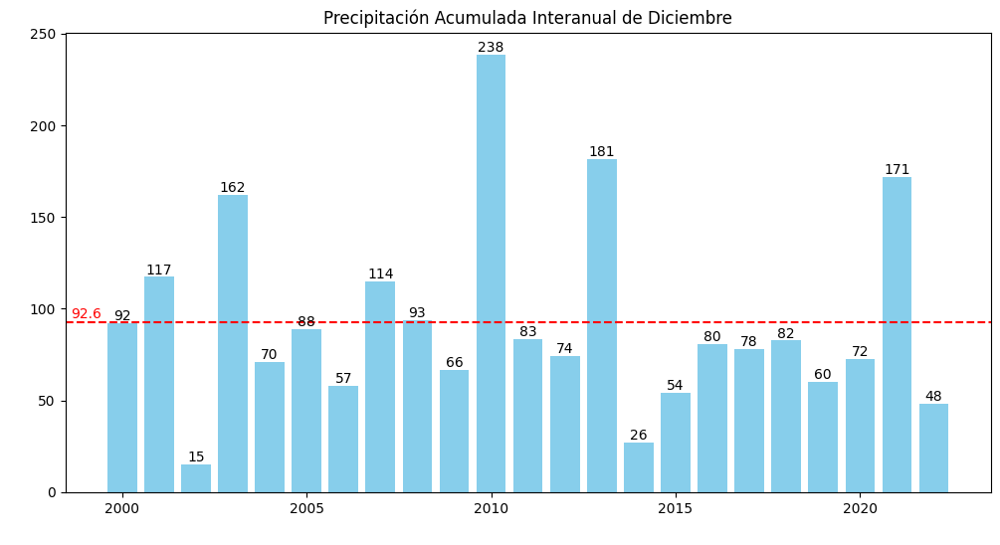

In [74]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘Precipitacion’ por año
Prec_Dic = df_Diciembre.groupby(df_Diciembre.index.year)['Precipitacion'].agg(['sum'])

# Calcular el promedio de Prec_anual
promedio_anual_diciembre = Prec_Dic['sum'].mean()

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar una línea con el promedio anual
ax.axhline(y=promedio_anual_diciembre, color='r', linestyle='--', label='Promedio Anual')

# Agregar una anotación con el valor de promedio_anual debajo de la línea de promedio
ax.annotate('{:.1f}'.format(promedio_anual_diciembre), xy=(0.5, promedio_anual_diciembre), xytext=(-320, 1),
            xycoords=('axes fraction', 'data'), textcoords='offset points',
            ha='center', va='bottom', color='r')

# Graficar el promedio con barras
bars = ax.bar(Prec_Dic.index, Prec_Dic['sum'].values, color='skyblue')

# Configurar el título y las etiquetas de los ejes
ax.set_title('Precipitación Acumulada Interanual de Diciembre')
ax.set_xlabel(' ')
ax.set_ylabel(' ')

# Colocar los valores encima de las barras
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

# Mostrar las líneas de la cuadrícula en el eje y para mejor referencia
#ax.yaxis.grid(True)

# Mostrar el gráfico
plt.show()


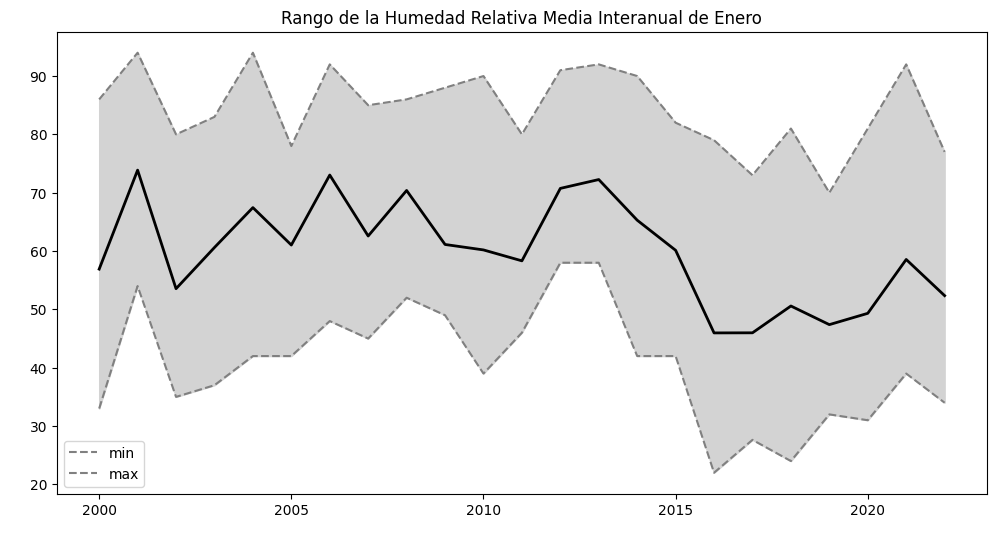

In [75]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Media' por año
HMedi_Ene = df_enero.groupby(df_enero.index.year)['Humedad_Relativa_Media'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMedi_Ene['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMedi_Ene[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMedi_Ene.index, HMedi_Ene['min'], HMedi_Ene['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Media Interanual de Enero')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

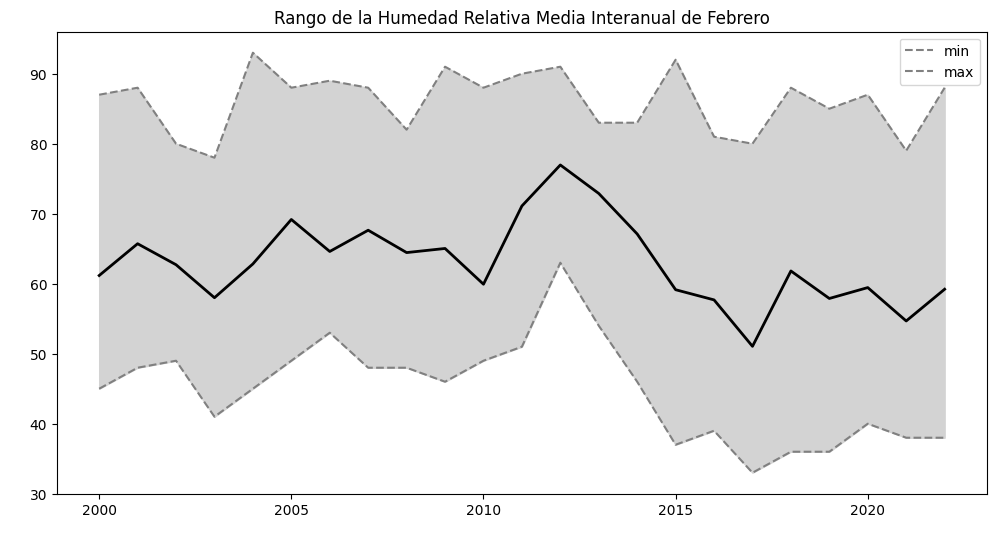

In [76]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Media' por año
HMedi_Feb = df_febrero.groupby(df_febrero.index.year)['Humedad_Relativa_Media'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMedi_Feb['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMedi_Feb[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMedi_Feb.index, HMedi_Feb['min'], HMedi_Feb['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Media Interanual de Febrero')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

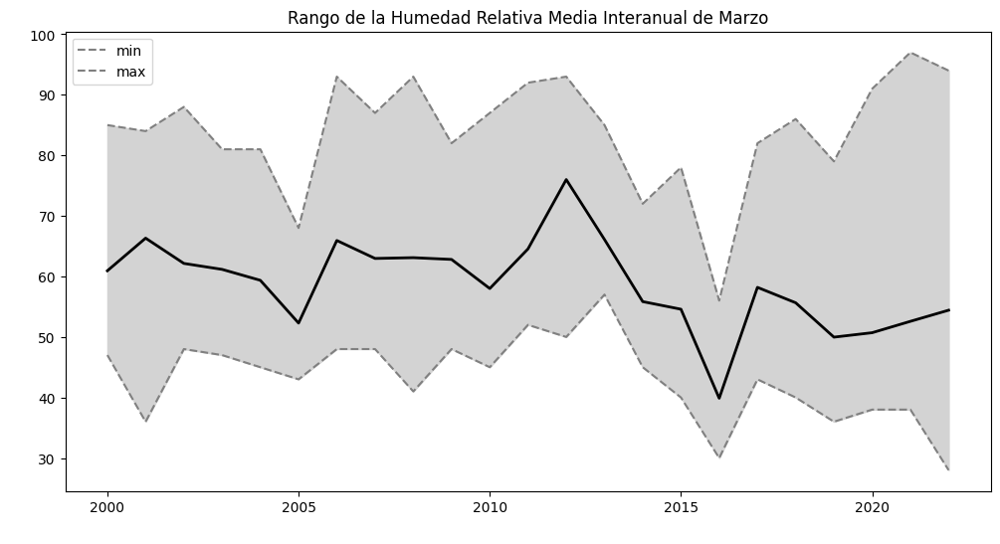

In [77]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Media' por año
HMedi_Mar = df_marzo.groupby(df_marzo.index.year)['Humedad_Relativa_Media'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMedi_Mar['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMedi_Mar[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMedi_Mar.index, HMedi_Mar['min'], HMedi_Mar['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Media Interanual de Marzo')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

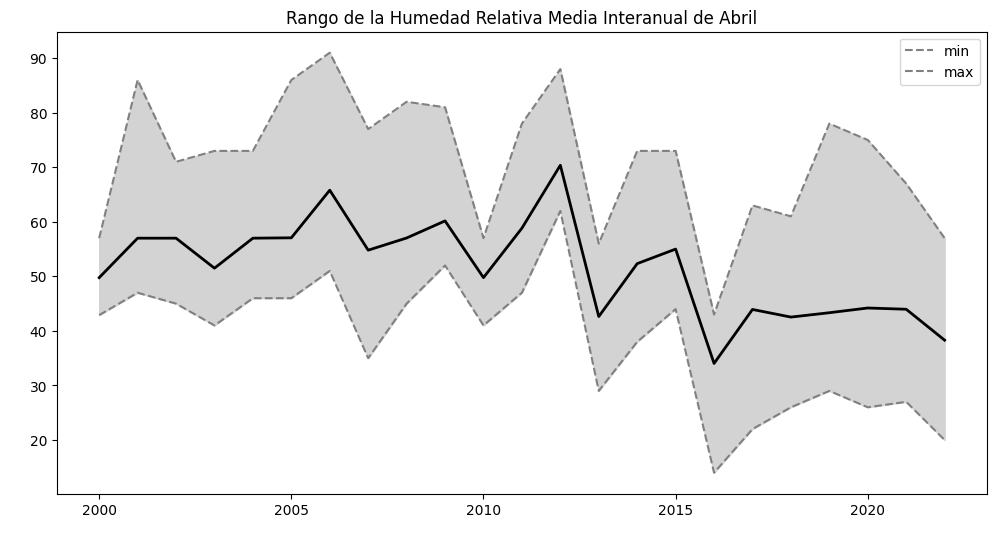

In [78]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Media' por año
HMedi_Abr = df_abril.groupby(df_abril.index.year)['Humedad_Relativa_Media'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMedi_Abr['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMedi_Abr[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMedi_Abr.index, HMedi_Abr['min'], HMedi_Abr['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Media Interanual de Abril')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

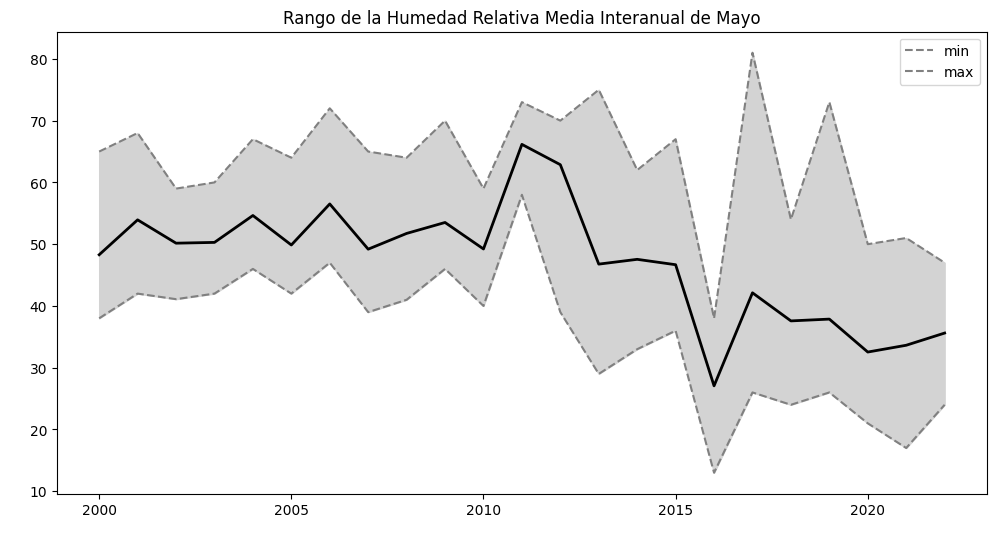

In [79]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Media' por año
HMedi_May = df_mayo.groupby(df_mayo.index.year)['Humedad_Relativa_Media'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMedi_May['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMedi_May[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMedi_May.index, HMedi_May['min'], HMedi_May['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Media Interanual de Mayo')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

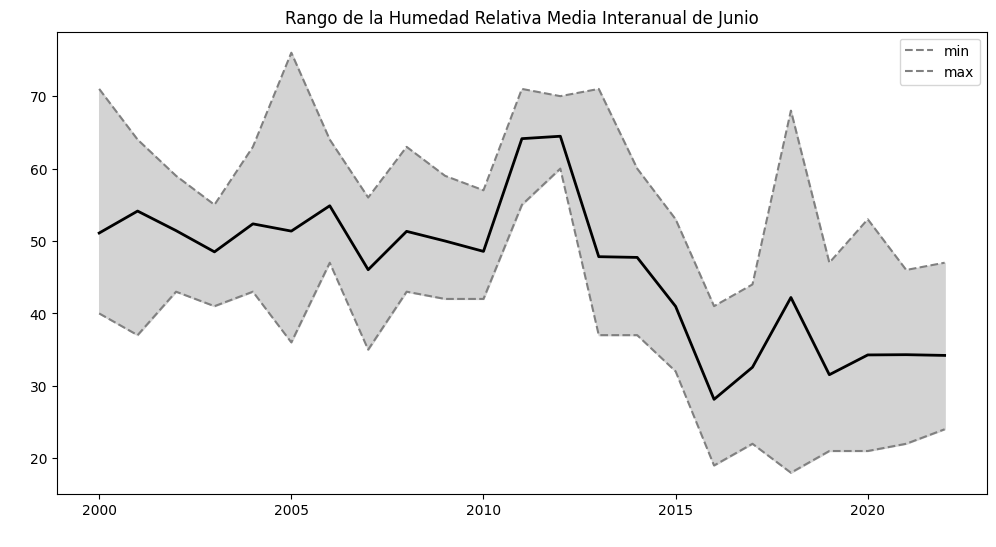

In [80]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Media' por año
HMedi_Jun = df_junio.groupby(df_junio.index.year)['Humedad_Relativa_Media'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMedi_Jun['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMedi_Jun[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMedi_Jun.index, HMedi_Jun['min'], HMedi_Jun['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Media Interanual de Junio')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

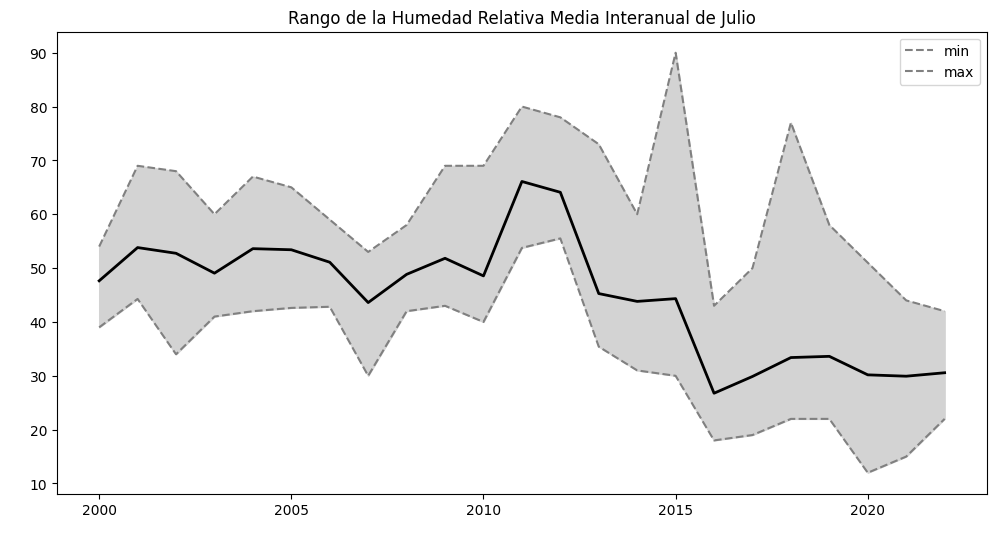

In [81]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Media' por año
HMedi_Jul = df_julio.groupby(df_julio.index.year)['Humedad_Relativa_Media'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMedi_Jul['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMedi_Jul[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMedi_Jul.index, HMedi_Jul['min'], HMedi_Jul['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Media Interanual de Julio')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

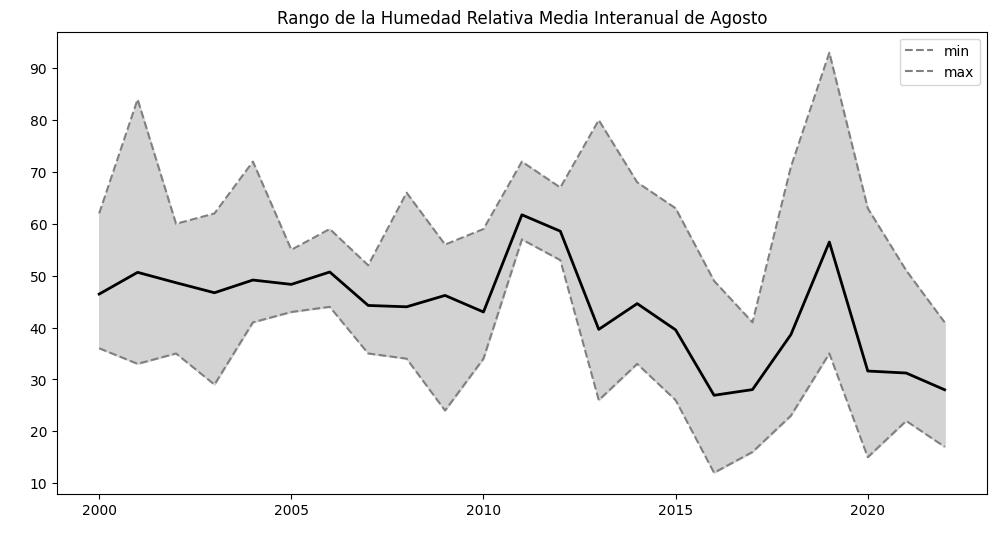

In [82]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Media' por año
HMedi_Agost = df_Agosto.groupby(df_Agosto.index.year)['Humedad_Relativa_Media'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMedi_Agost['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMedi_Agost[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMedi_Agost.index, HMedi_Agost['min'], HMedi_Agost['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Media Interanual de Agosto')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()



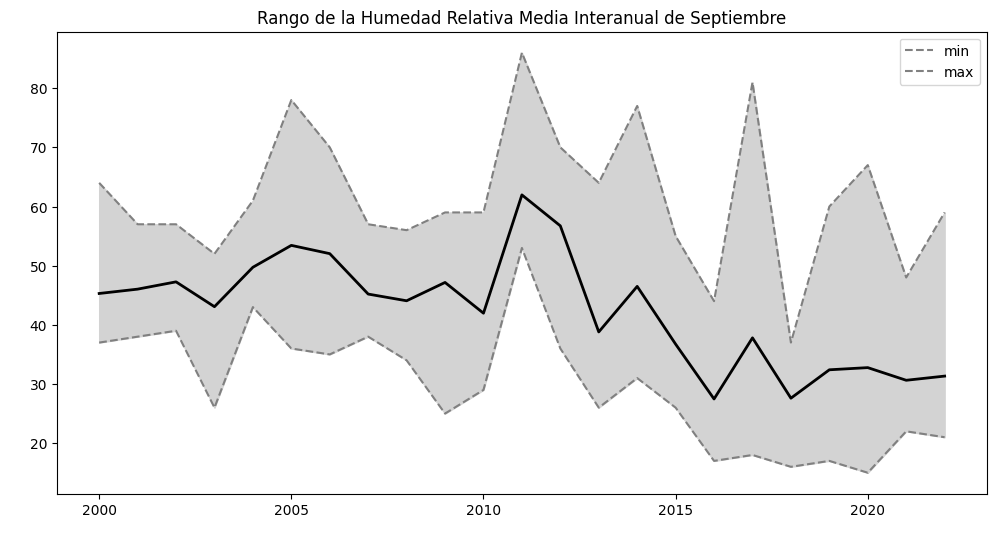

In [83]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Media' por año
HMedi_Sept = df_Septiembre.groupby(df_Septiembre.index.year)['Humedad_Relativa_Media'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMedi_Sept['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMedi_Sept[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMedi_Sept.index, HMedi_Sept['min'], HMedi_Sept['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Media Interanual de Septiembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()



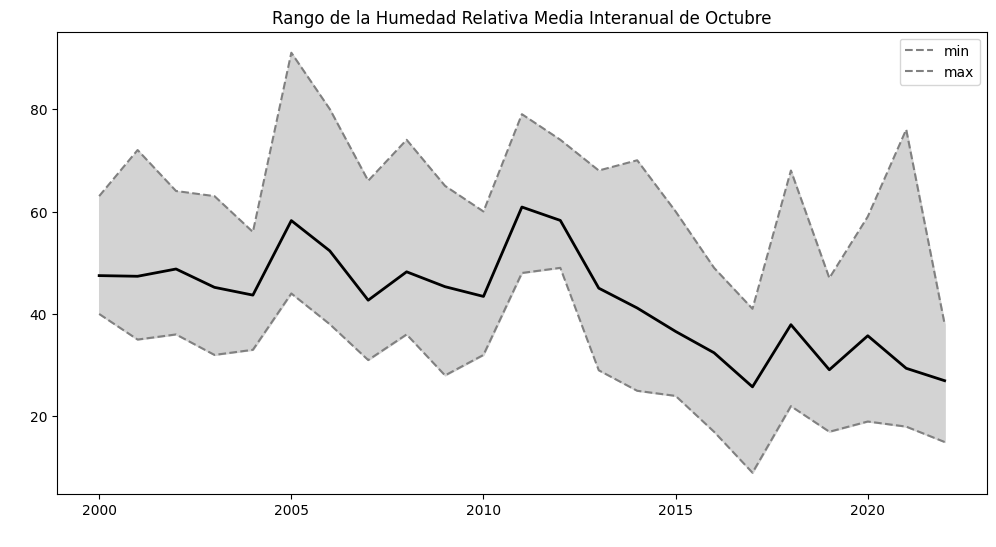

In [84]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Media' por año
HMedi_Oct = df_Octubre.groupby(df_Octubre.index.year)['Humedad_Relativa_Media'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMedi_Oct['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMedi_Oct[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMedi_Oct.index, HMedi_Oct['min'], HMedi_Oct['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Media Interanual de Octubre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()



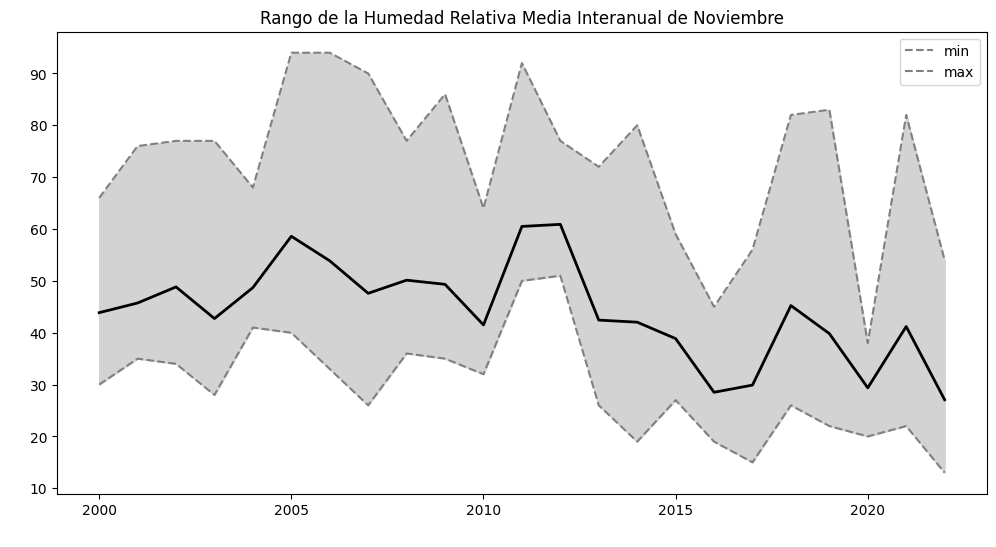

In [85]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Media' por año
HMedi_Nov = df_Noviembre.groupby(df_Noviembre.index.year)['Humedad_Relativa_Media'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMedi_Nov['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMedi_Nov[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMedi_Nov.index, HMedi_Nov['min'], HMedi_Nov['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Media Interanual de Noviembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

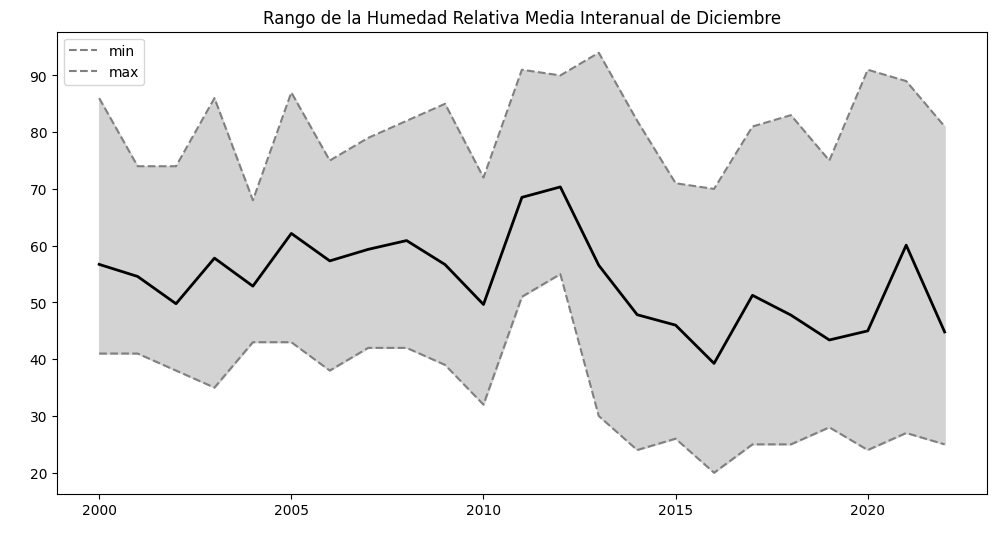

In [86]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Media' por año
HMedi_Dic = df_Diciembre.groupby(df_Diciembre.index.year)['Humedad_Relativa_Media'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMedi_Dic['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMedi_Dic[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMedi_Dic.index, HMedi_Dic['min'], HMedi_Dic['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Media Interanual de Diciembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

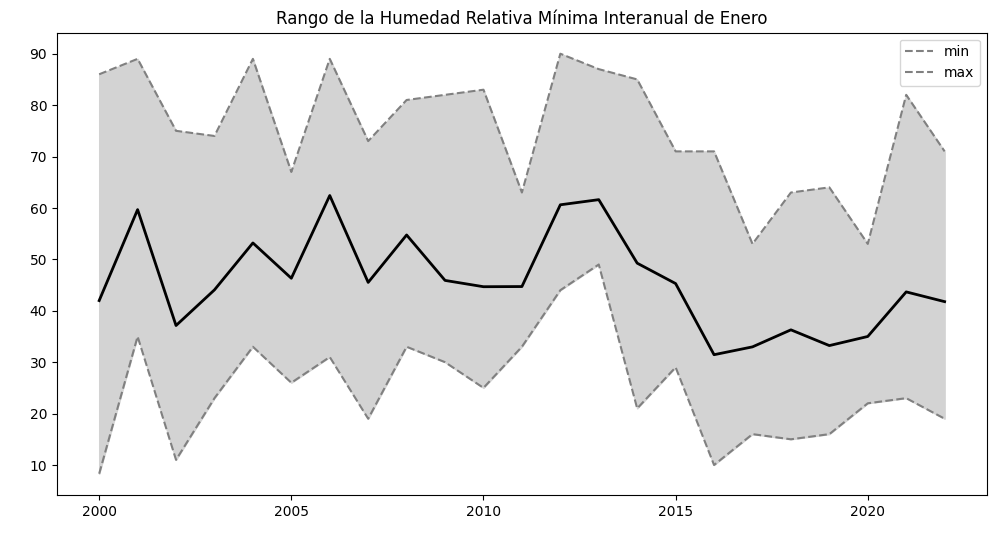

In [87]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Minima' por año
HMin_En = df_enero.groupby(df_enero.index.year)['Humedad_Relativa_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMin_En['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMin_En[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMin_En.index, HMin_En['min'], HMin_En['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Mínima Interanual de Enero')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

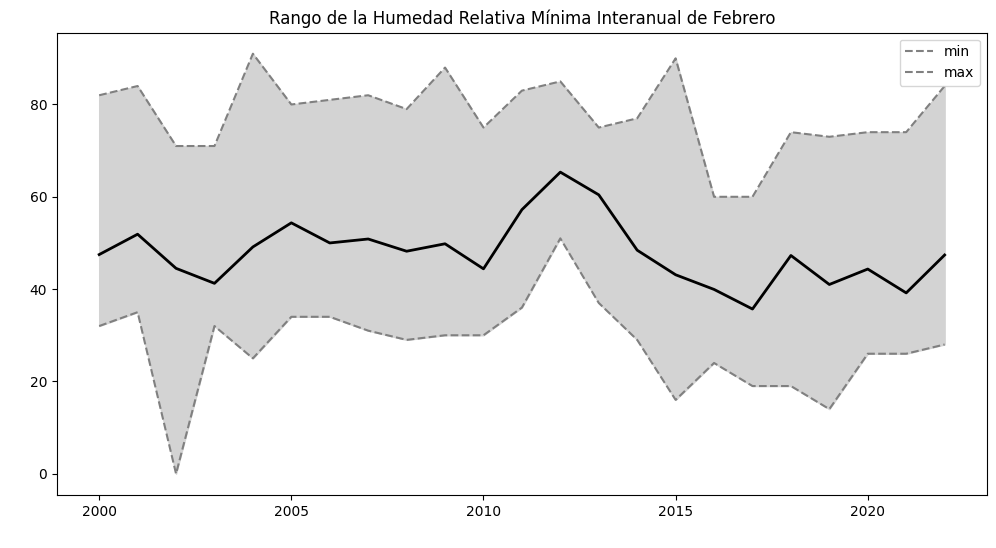

In [88]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Minima' por año
HMin_Fe = df_febrero.groupby(df_febrero.index.year)['Humedad_Relativa_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMin_Fe['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMin_Fe[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMin_Fe.index, HMin_Fe['min'], HMin_Fe['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Mínima Interanual de Febrero')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


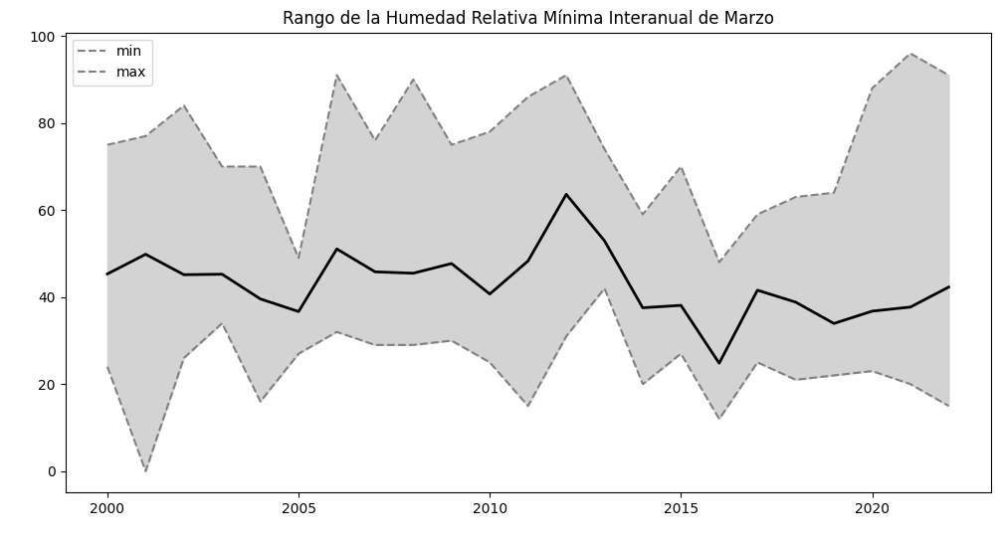

In [89]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Minima' por año
HMin_Mar = df_marzo.groupby(df_marzo.index.year)['Humedad_Relativa_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMin_Mar['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMin_Mar[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMin_Mar.index, HMin_Mar['min'], HMin_Mar['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Mínima Interanual de Marzo')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

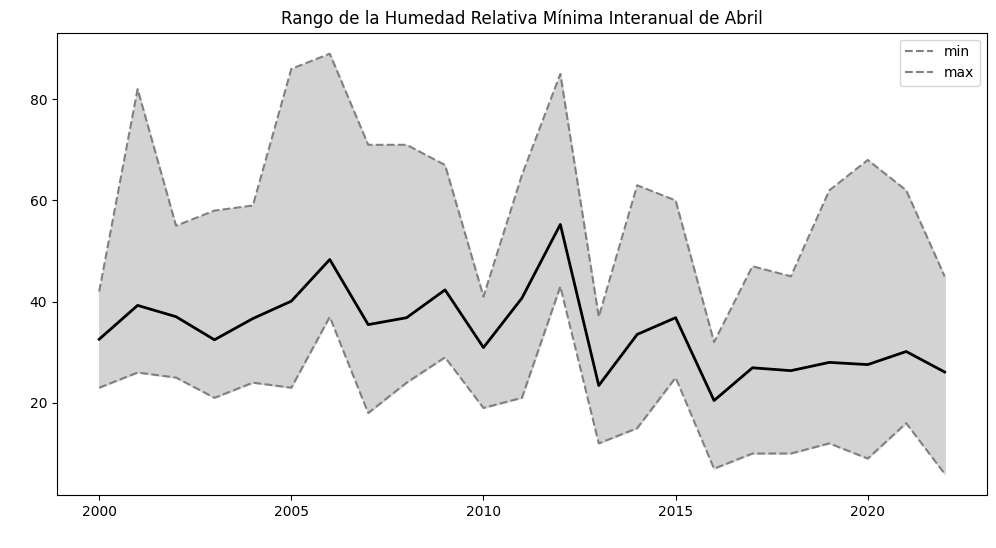

In [90]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Minima' por año
HMin_Abr = df_abril.groupby(df_abril.index.year)['Humedad_Relativa_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMin_Abr['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMin_Abr[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMin_Abr.index, HMin_Abr['min'], HMin_Abr['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Mínima Interanual de Abril')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

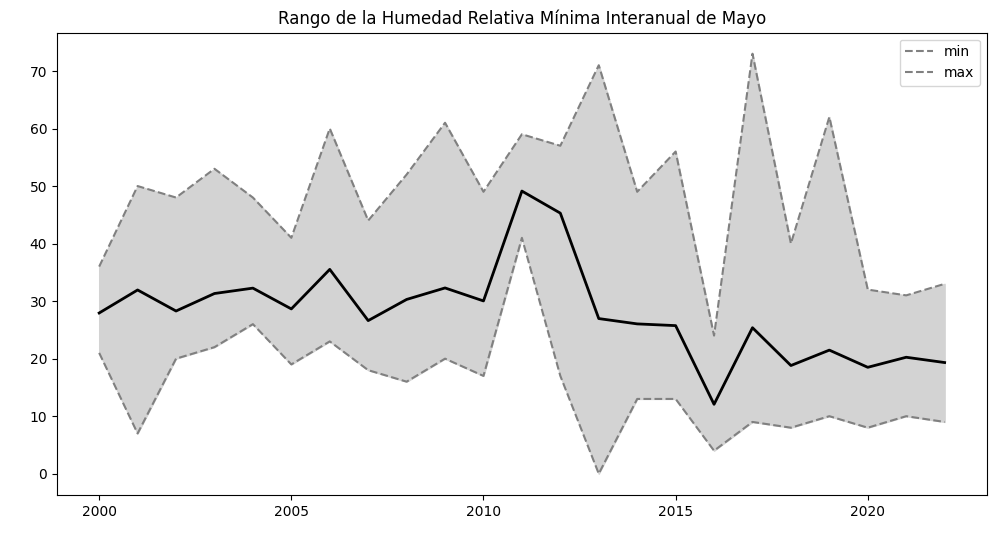

In [91]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Minima' por año
HMin_May = df_mayo.groupby(df_mayo.index.year)['Humedad_Relativa_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMin_May['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMin_May[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMin_May.index, HMin_May['min'], HMin_May['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Mínima Interanual de Mayo')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


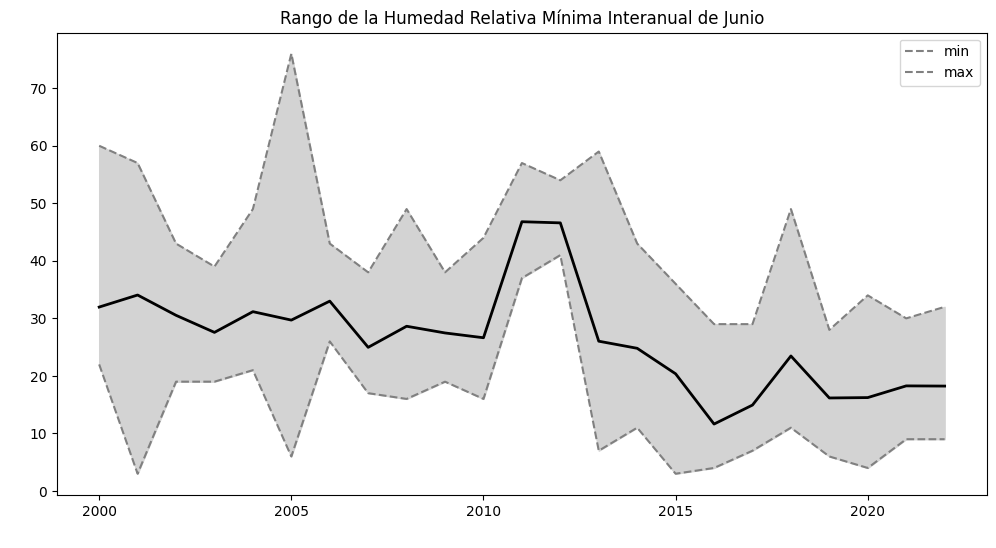

In [92]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Minima' por año
HMin_Jun = df_junio.groupby(df_junio.index.year)['Humedad_Relativa_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMin_Jun['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMin_Jun[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMin_Jun.index, HMin_Jun['min'], HMin_Jun['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Mínima Interanual de Junio')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


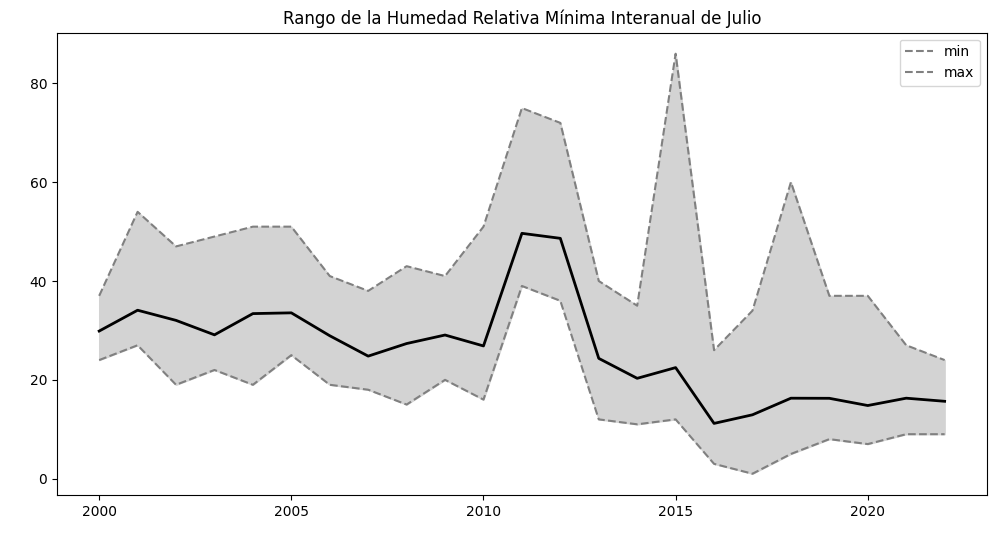

In [93]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Minima' por año
HMin_Jul = df_julio.groupby(df_julio.index.year)['Humedad_Relativa_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMin_Jul['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMin_Jul[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMin_Jul.index, HMin_Jul['min'], HMin_Jul['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Mínima Interanual de Julio')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


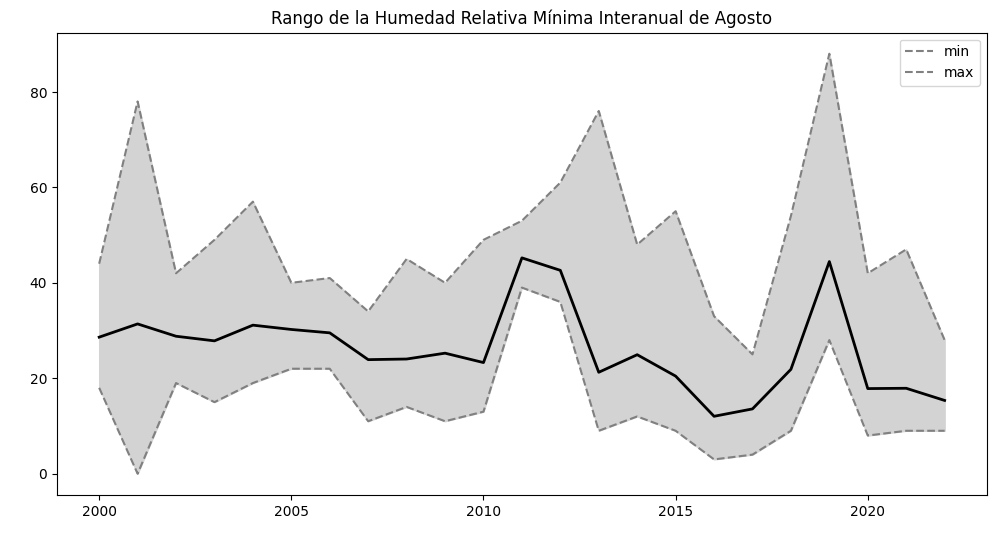

In [94]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Minima' por año
HMin_Agost = df_Agosto.groupby(df_Agosto.index.year)['Humedad_Relativa_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMin_Agost['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMin_Agost[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMin_Agost.index, HMin_Agost['min'], HMin_Agost['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Mínima Interanual de Agosto')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

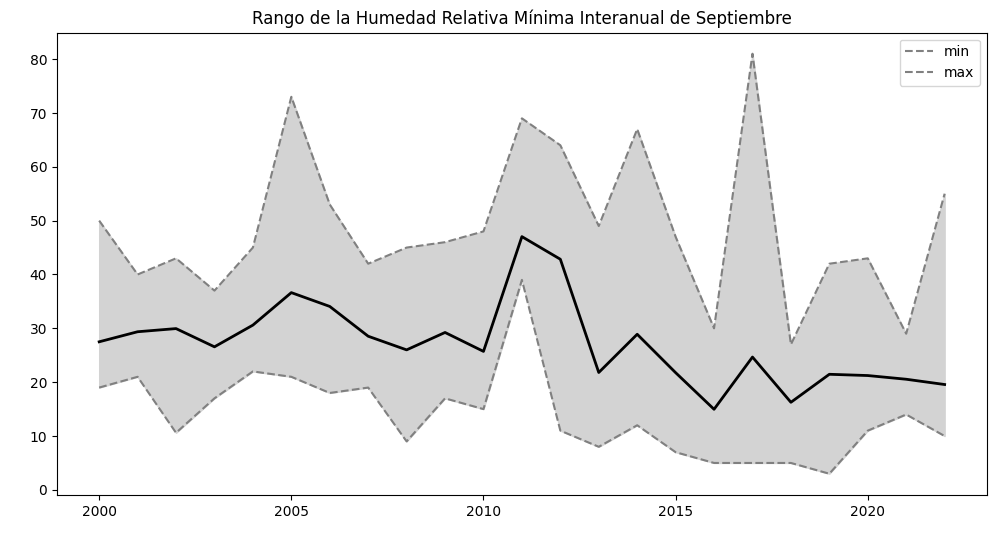

In [95]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Minima' por año
HMin_Sept = df_Septiembre.groupby(df_Septiembre.index.year)['Humedad_Relativa_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMin_Sept['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMin_Sept[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMin_Sept.index, HMin_Sept['min'], HMin_Sept['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Mínima Interanual de Septiembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

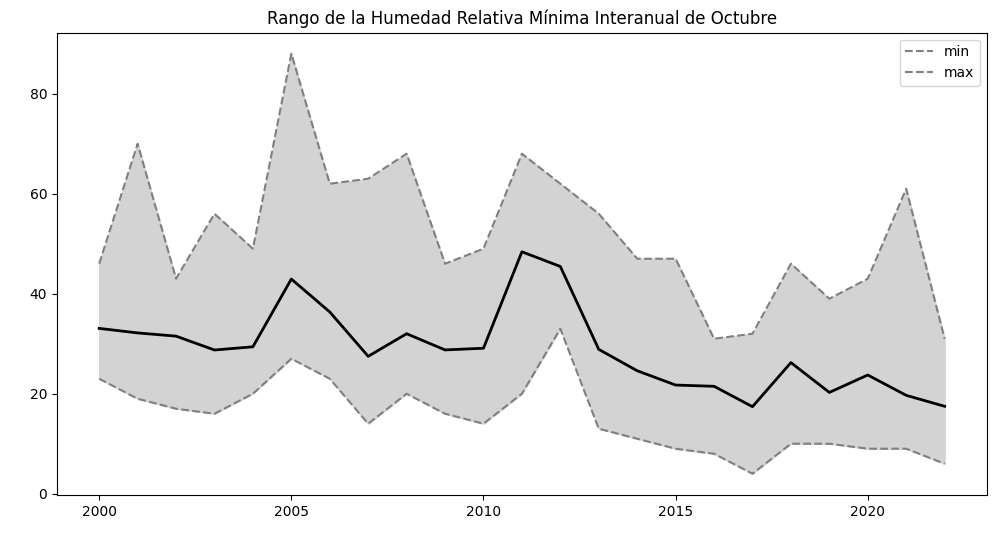

In [96]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Minima' por año
HMin_Oct = df_Octubre.groupby(df_Octubre.index.year)['Humedad_Relativa_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMin_Oct['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMin_Oct[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMin_Oct.index, HMin_Oct['min'], HMin_Oct['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Mínima Interanual de Octubre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

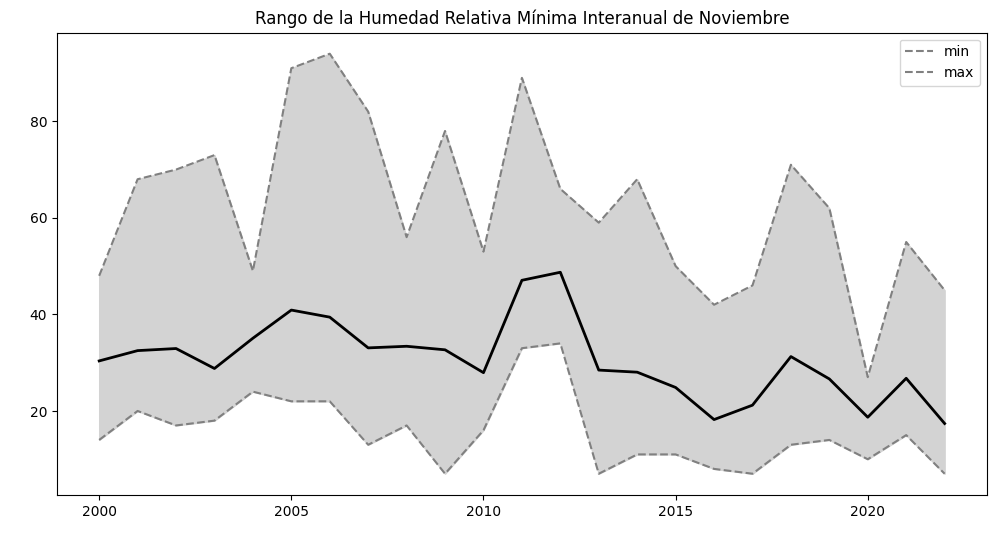

In [97]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Minima' por año
HMin_Nov = df_Noviembre.groupby(df_Noviembre.index.year)['Humedad_Relativa_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMin_Nov['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMin_Nov[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMin_Nov.index, HMin_Nov['min'], HMin_Nov['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Mínima Interanual de Noviembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


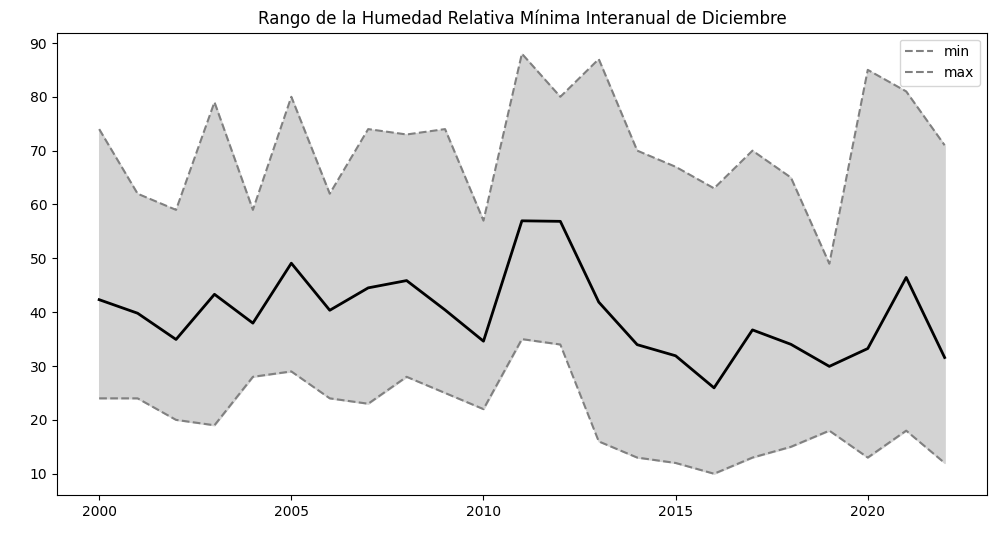

In [98]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Minima' por año
HMin_Dic = df_Diciembre.groupby(df_Diciembre.index.year)['Humedad_Relativa_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMin_Dic['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMin_Dic[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMin_Dic.index, HMin_Dic['min'], HMin_Dic['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Mínima Interanual de Diciembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


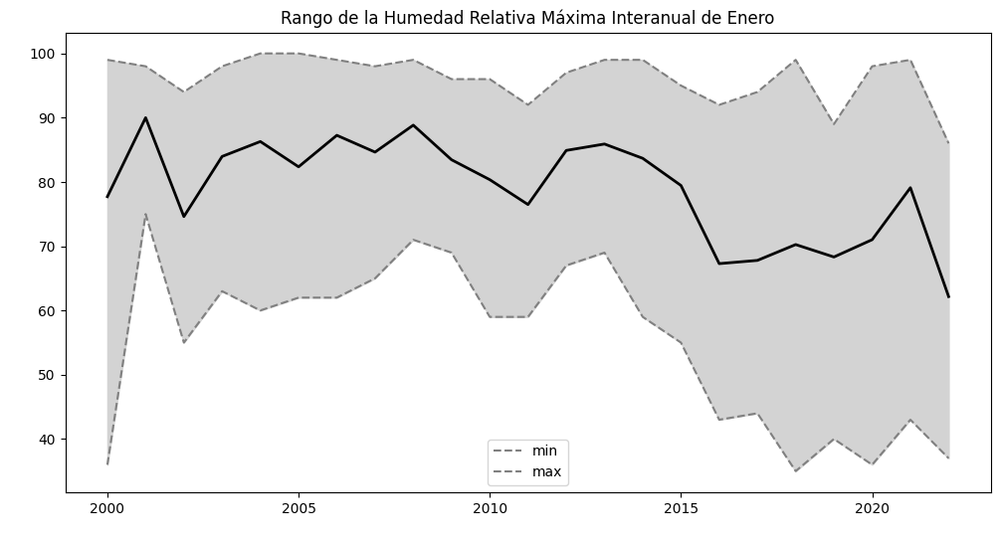

In [99]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Maxima' por año
HMax_Ene = df_enero.groupby(df_enero.index.year)['Humedad_Relativa_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMax_Ene['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMax_Ene[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMax_Ene.index, HMax_Ene['min'], HMax_Ene['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Máxima Interanual de Enero')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


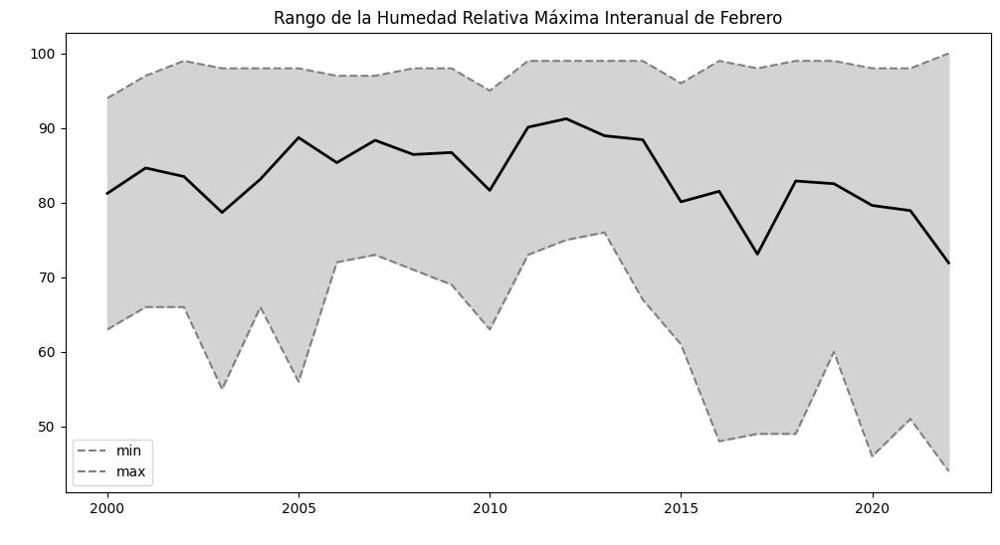

In [100]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Maxima' por año
HMax_Feb = df_febrero.groupby(df_febrero.index.year)['Humedad_Relativa_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMax_Feb['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMax_Feb[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMax_Feb.index, HMax_Feb['min'], HMax_Feb['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Máxima Interanual de Febrero')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

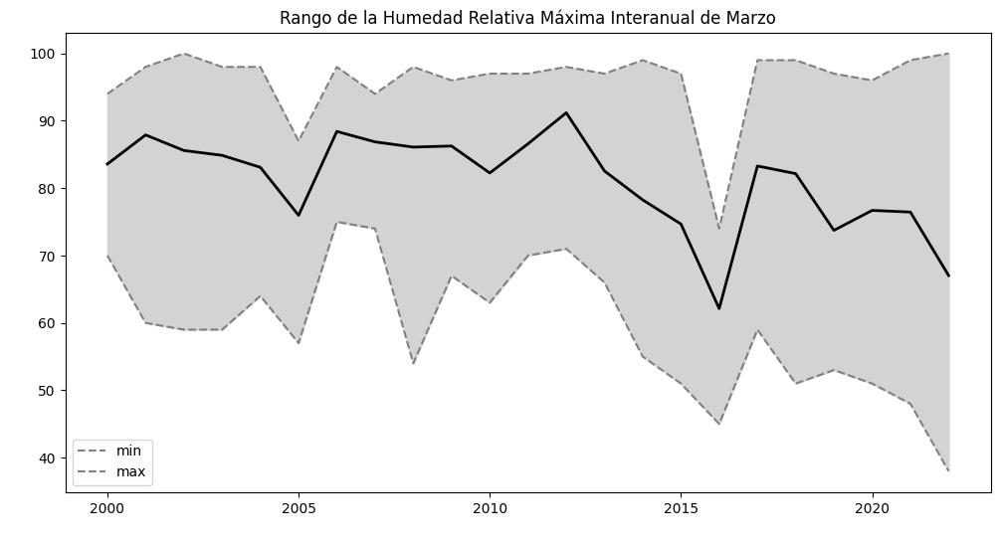

In [101]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Maxima' por año
HMax_Mar = df_marzo.groupby(df_marzo.index.year)['Humedad_Relativa_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMax_Mar['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMax_Mar[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMax_Mar.index, HMax_Mar['min'], HMax_Mar['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Máxima Interanual de Marzo')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

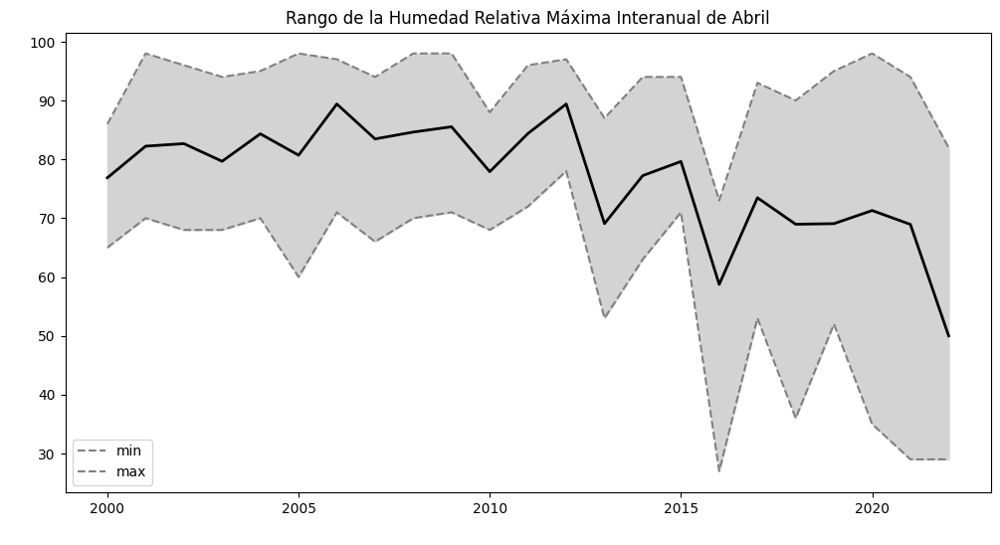

In [102]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Maxima' por año
HMax_Abr = df_abril.groupby(df_abril.index.year)['Humedad_Relativa_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMax_Abr['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMax_Abr[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMax_Abr.index, HMax_Abr['min'], HMax_Abr['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Máxima Interanual de Abril')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

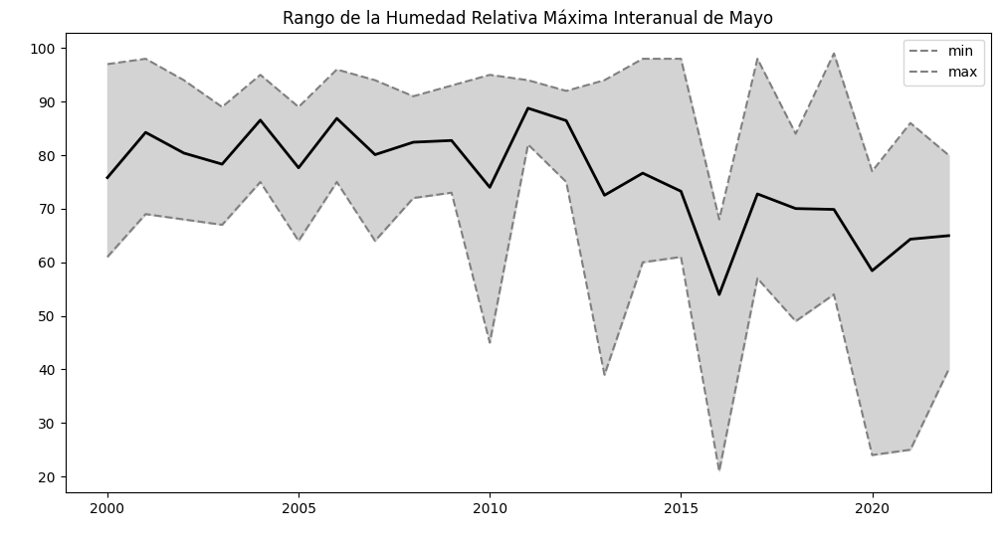

In [103]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Maxima' por año
HMax_May = df_mayo.groupby(df_mayo.index.year)['Humedad_Relativa_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMax_May['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMax_May[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMax_May.index, HMax_May['min'], HMax_May['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Máxima Interanual de Mayo')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

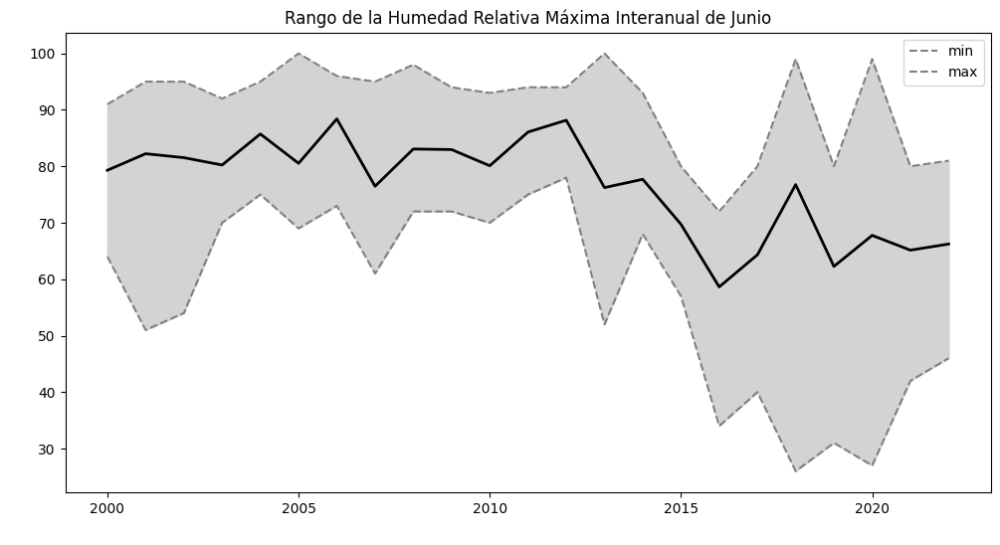

In [104]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Maxima' por año
HMax_Jun = df_junio.groupby(df_junio.index.year)['Humedad_Relativa_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMax_Jun['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMax_Jun[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMax_Jun.index, HMax_Jun['min'], HMax_Jun['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Máxima Interanual de Junio')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

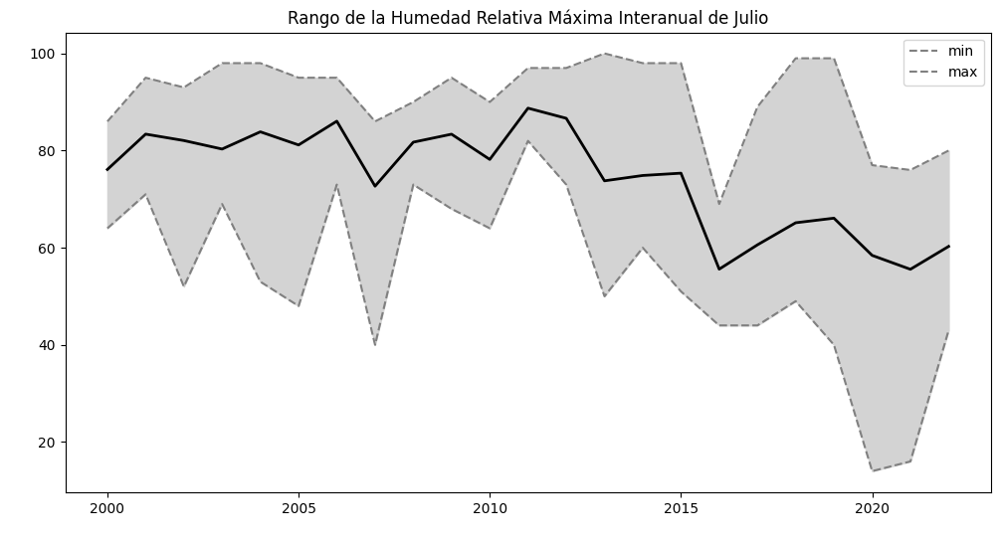

In [105]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Maxima' por año
HMax_Jul = df_julio.groupby(df_julio.index.year)['Humedad_Relativa_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMax_Jul['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMax_Jul[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMax_Jul.index, HMax_Jul['min'], HMax_Jul['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Máxima Interanual de Julio')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

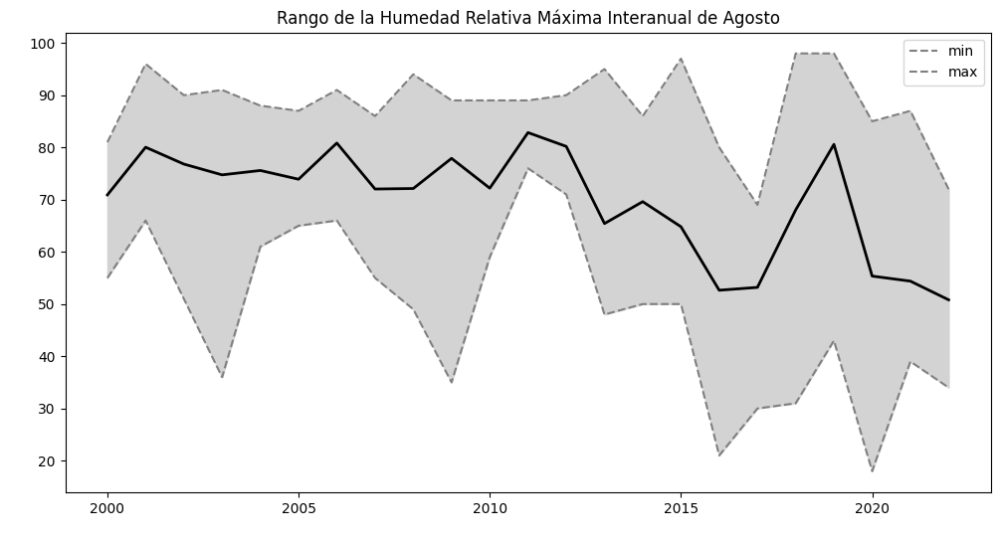

In [106]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Maxima' por año
HMax_Agt = df_Agosto.groupby(df_Agosto.index.year)['Humedad_Relativa_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMax_Agt['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMax_Agt[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMax_Agt.index, HMax_Agt['min'], HMax_Agt['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Máxima Interanual de Agosto')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

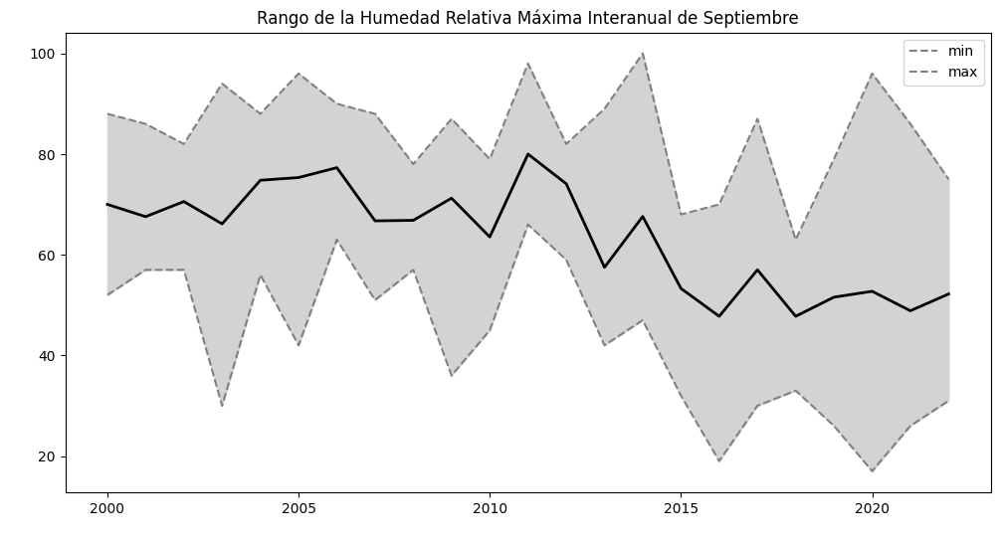

In [107]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Maxima' por año
HMax_Sep = df_Septiembre.groupby(df_Septiembre.index.year)['Humedad_Relativa_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMax_Sep['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMax_Sep[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMax_Sep.index, HMax_Sep['min'], HMax_Sep['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Máxima Interanual de Septiembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

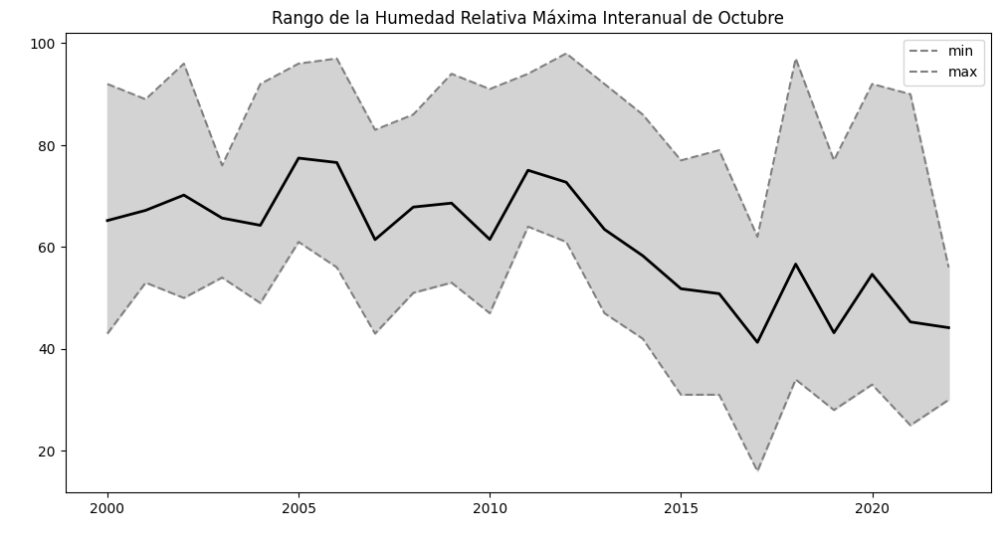

In [108]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Maxima' por año
HMax_Oct = df_Octubre.groupby(df_Octubre.index.year)['Humedad_Relativa_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMax_Oct['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMax_Oct[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMax_Oct.index, HMax_Oct['min'], HMax_Oct['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Máxima Interanual de Octubre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


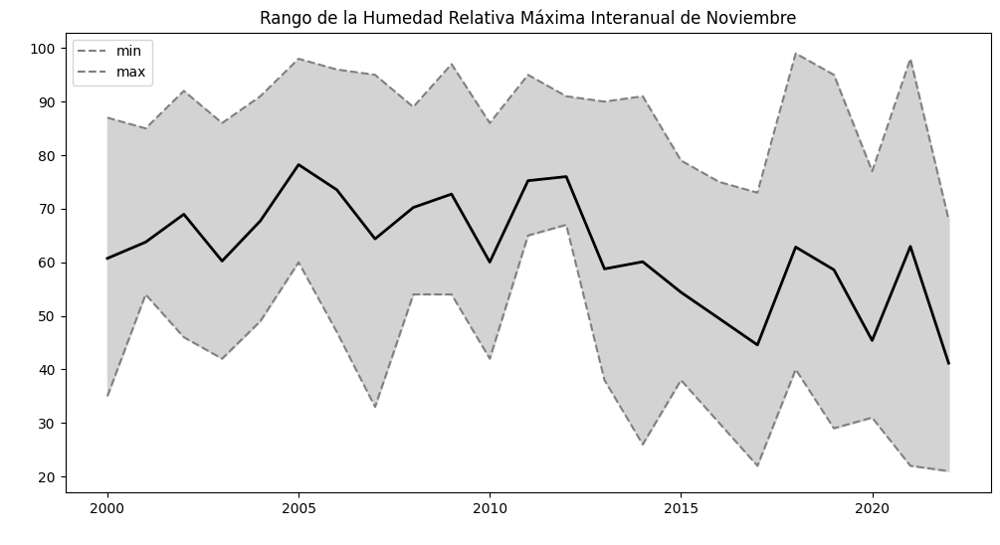

In [109]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Maxima' por año
HMax_Nov = df_Noviembre.groupby(df_Noviembre.index.year)['Humedad_Relativa_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMax_Nov['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMax_Nov[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMax_Nov.index, HMax_Nov['min'], HMax_Nov['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Máxima Interanual de Noviembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

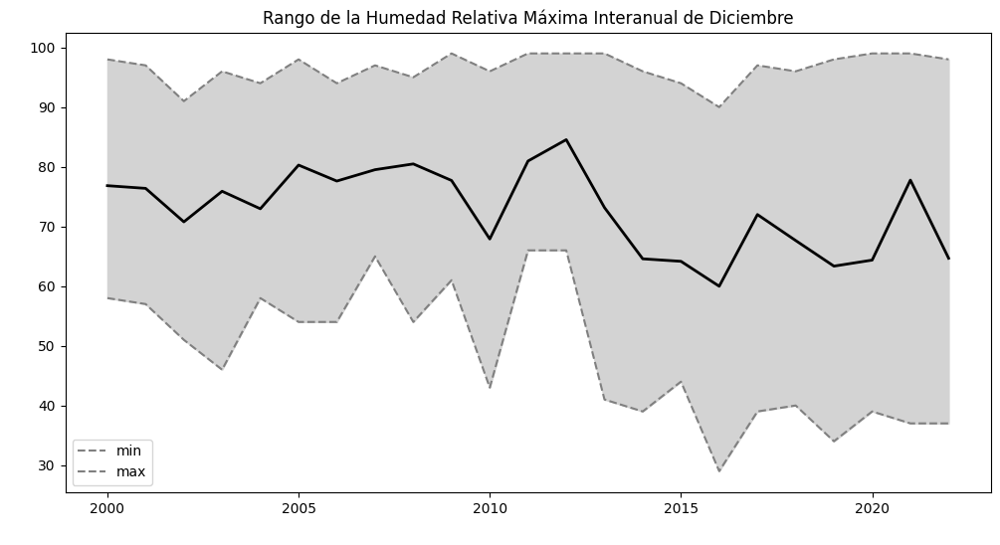

In [110]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Humedad_Relativa_Maxima' por año
HMax_Dic = df_Diciembre.groupby(df_Diciembre.index.year)['Humedad_Relativa_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
HMax_Dic['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
HMax_Dic[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(HMax_Dic.index, HMax_Dic['min'], HMax_Dic['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Humedad Relativa Máxima Interanual de Diciembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

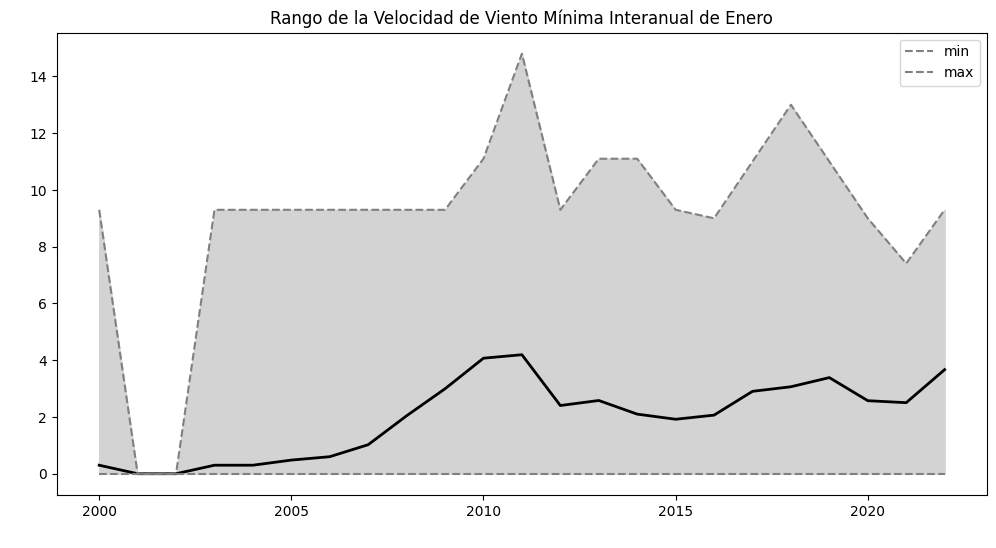

In [111]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Minima' por año
VMin_Ene = df_enero.groupby(df_enero.index.year)['Velocidad_de_Viento_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMin_Ene['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMin_Ene[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMin_Ene.index, VMin_Ene['min'], VMin_Ene['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Mínima Interanual de Enero')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

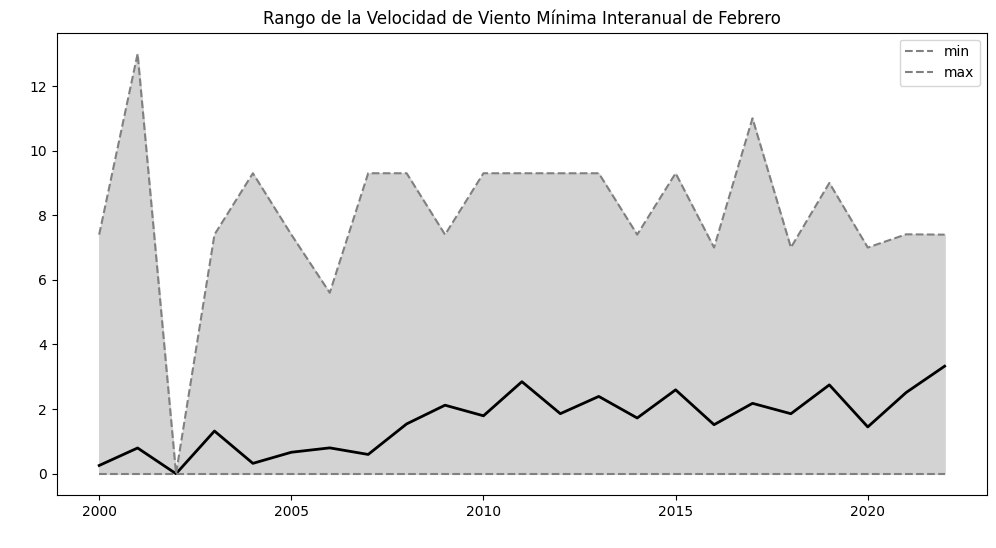

In [112]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Minima' por año
VMin_Feb = df_febrero.groupby(df_febrero.index.year)['Velocidad_de_Viento_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMin_Feb['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMin_Feb[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMin_Feb.index, VMin_Feb['min'], VMin_Feb['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Mínima Interanual de Febrero')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

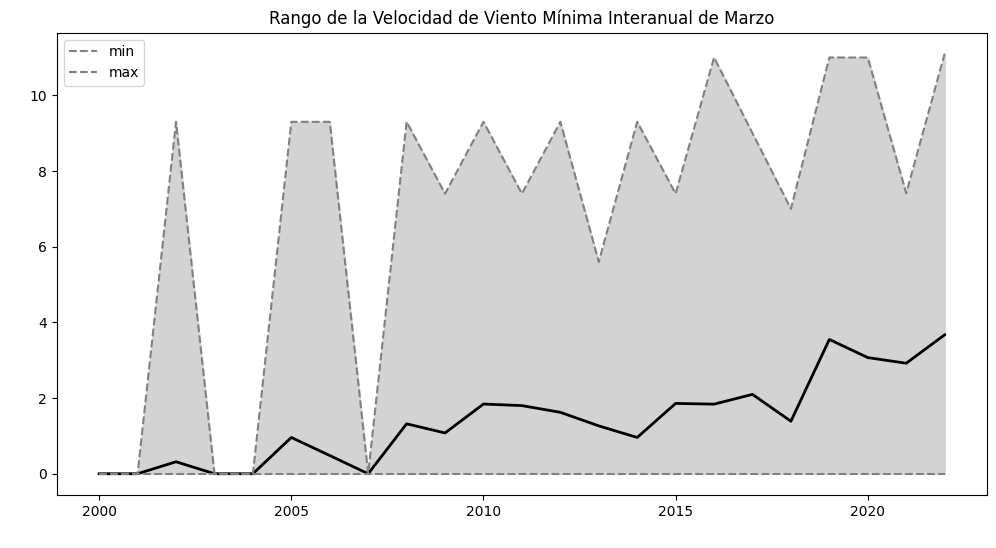

In [113]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Minima' por año
VMin_Mar = df_marzo.groupby(df_marzo.index.year)['Velocidad_de_Viento_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMin_Mar['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMin_Mar[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMin_Mar.index, VMin_Mar['min'], VMin_Mar['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Mínima Interanual de Marzo')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

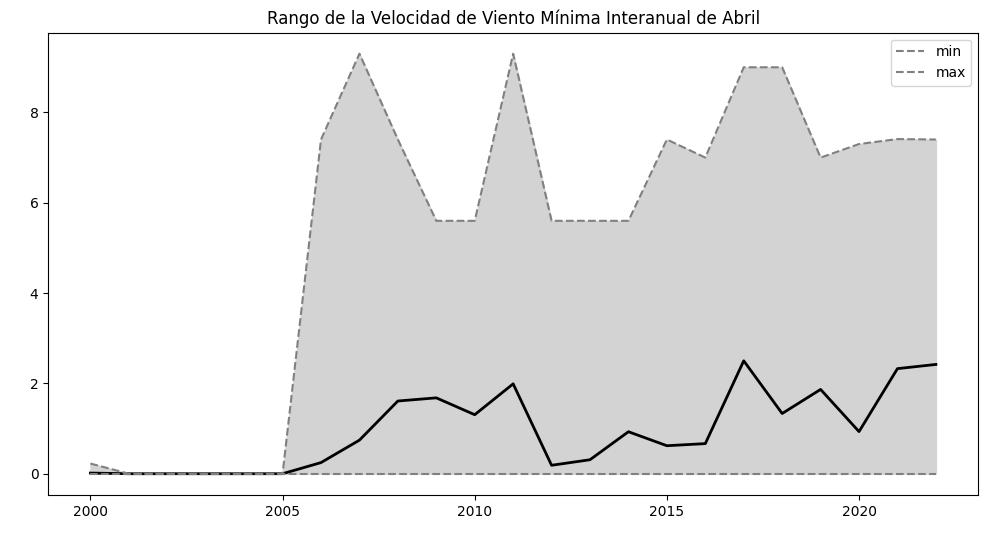

In [114]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Minima' por año
VMin_Abr = df_abril.groupby(df_abril.index.year)['Velocidad_de_Viento_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMin_Abr['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMin_Abr[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMin_Abr.index, VMin_Abr['min'], VMin_Abr['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Mínima Interanual de Abril')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


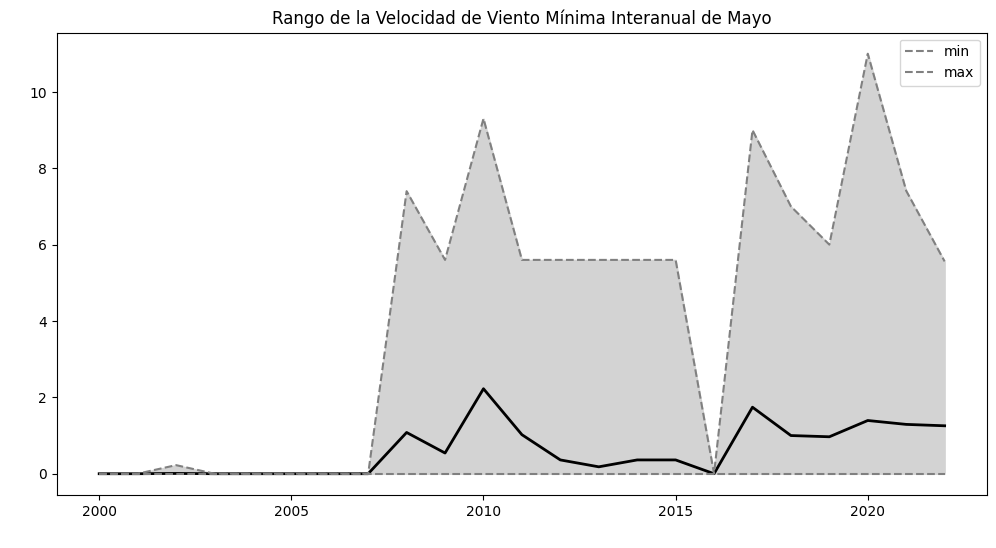

In [115]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Minima' por año
VMin_May = df_mayo.groupby(df_mayo.index.year)['Velocidad_de_Viento_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMin_May['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMin_May[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMin_May.index, VMin_May['min'], VMin_May['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Mínima Interanual de Mayo')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

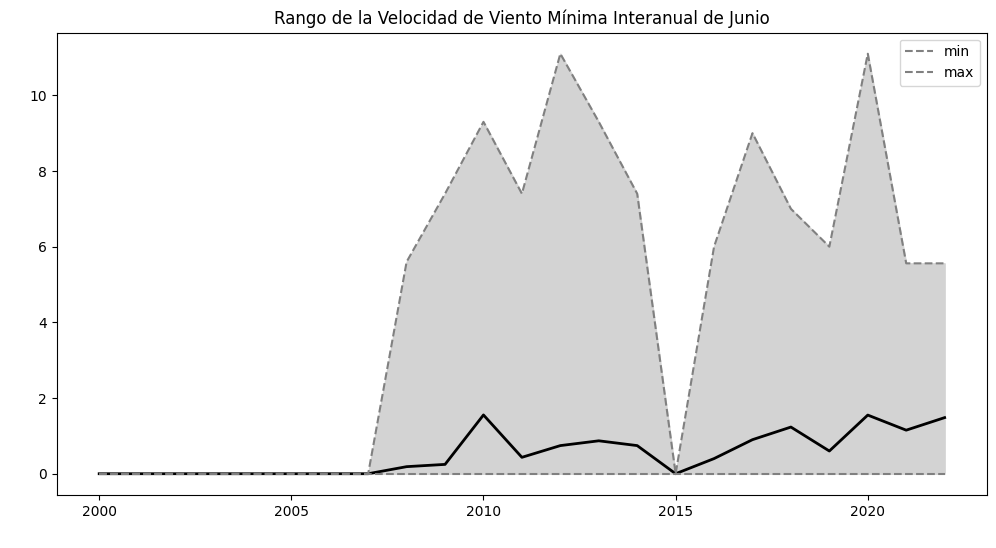

In [116]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Minima' por año
VMin_Jun = df_junio.groupby(df_junio.index.year)['Velocidad_de_Viento_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMin_Jun['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMin_Jun[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMin_Jun.index, VMin_Jun['min'], VMin_Jun['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Mínima Interanual de Junio')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

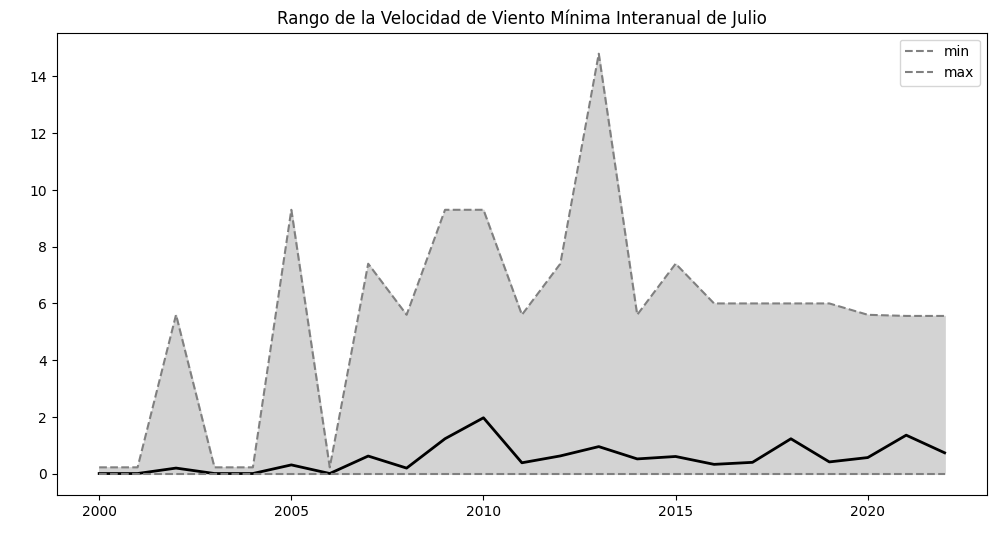

In [117]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Minima' por año
VMin_Jul = df_julio.groupby(df_julio.index.year)['Velocidad_de_Viento_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMin_Jul['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMin_Jul[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMin_Jul.index, VMin_Jul['min'], VMin_Jul['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Mínima Interanual de Julio')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

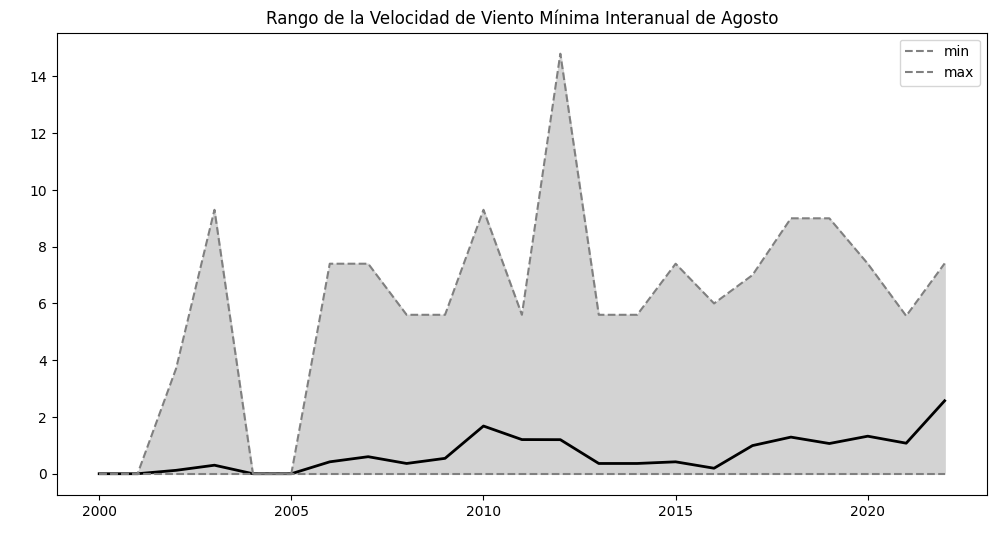

In [118]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Minima' por año
VMin_Agt = df_Agosto.groupby(df_Agosto.index.year)['Velocidad_de_Viento_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMin_Agt['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMin_Agt[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMin_Agt.index, VMin_Agt['min'], VMin_Agt['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Mínima Interanual de Agosto')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

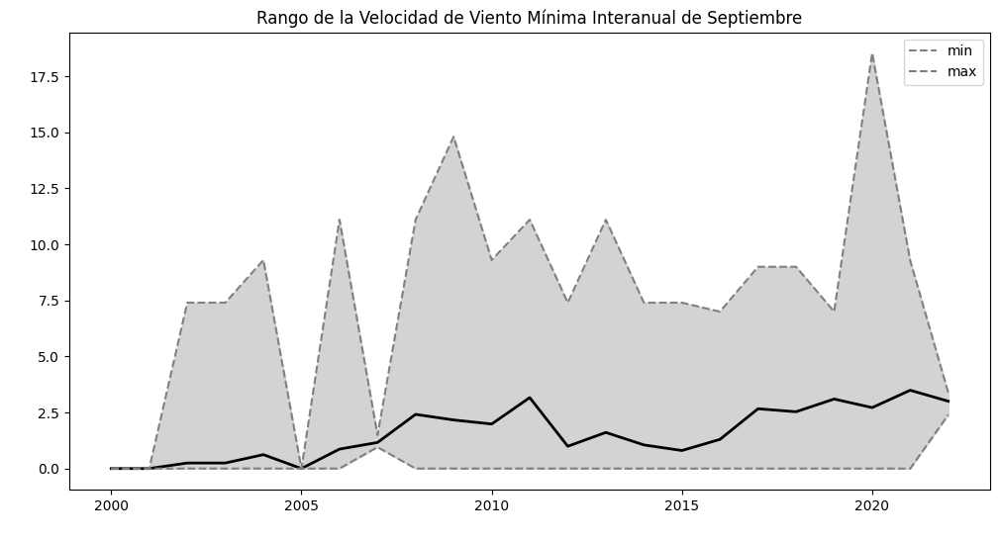

In [119]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Minima' por año
VMin_Sep = df_Septiembre.groupby(df_Septiembre.index.year)['Velocidad_de_Viento_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMin_Sep['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMin_Sep[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMin_Sep.index, VMin_Sep['min'], VMin_Sep['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Mínima Interanual de Septiembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


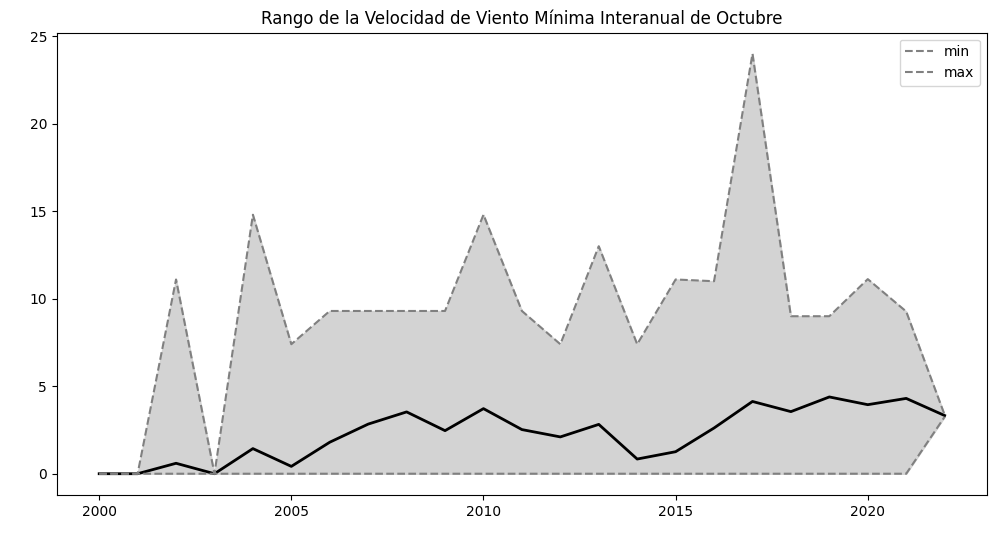

In [120]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Minima' por año
VMin_Oct = df_Octubre.groupby(df_Octubre.index.year)['Velocidad_de_Viento_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMin_Oct['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMin_Oct[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMin_Oct.index, VMin_Oct['min'], VMin_Oct['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Mínima Interanual de Octubre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


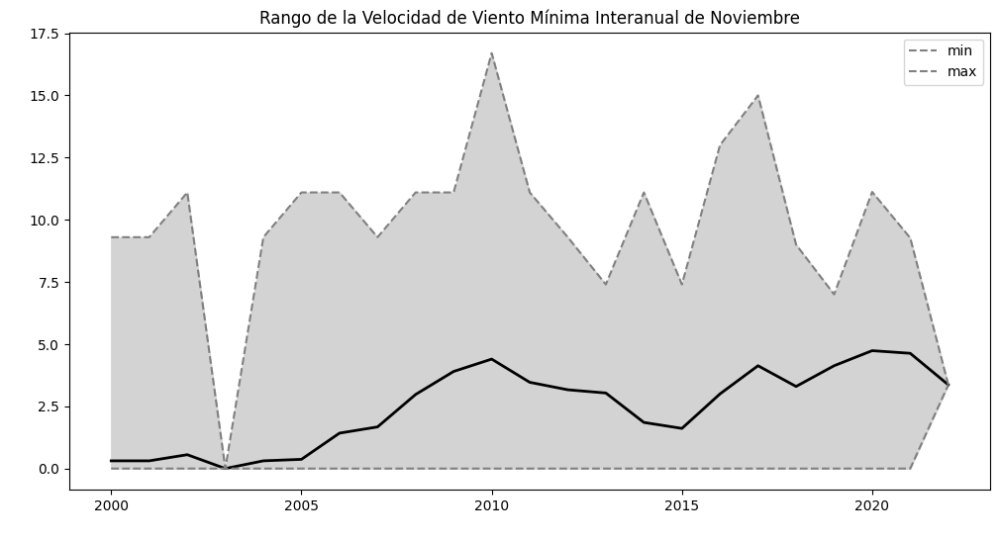

In [121]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Minima' por año
VMin_Nov = df_Noviembre.groupby(df_Noviembre.index.year)['Velocidad_de_Viento_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMin_Nov['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMin_Nov[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMin_Nov.index, VMin_Nov['min'], VMin_Nov['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Mínima Interanual de Noviembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


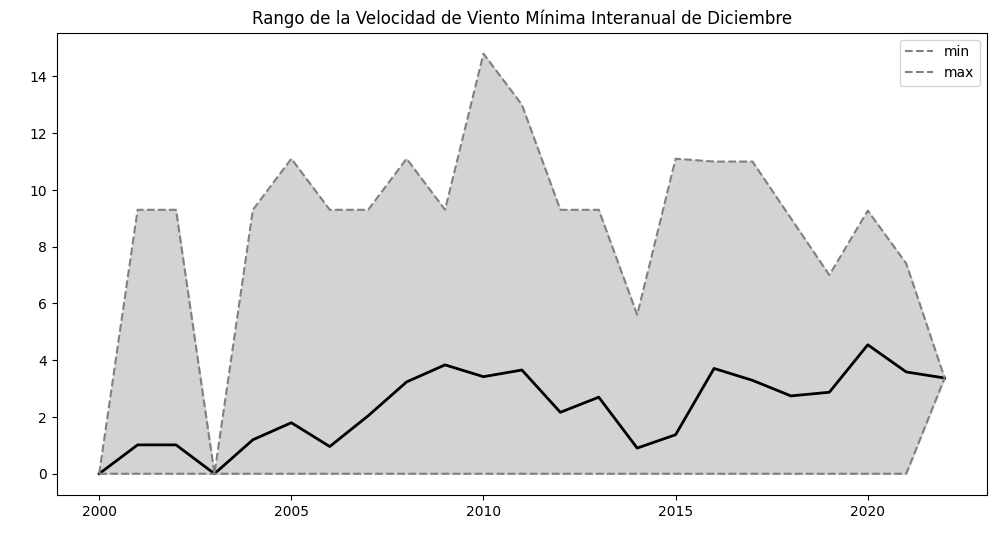

In [122]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Minima' por año
VMin_Dic = df_Diciembre.groupby(df_Diciembre.index.year)['Velocidad_de_Viento_Minima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMin_Dic['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMin_Dic[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMin_Dic.index, VMin_Dic['min'], VMin_Dic['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Mínima Interanual de Diciembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


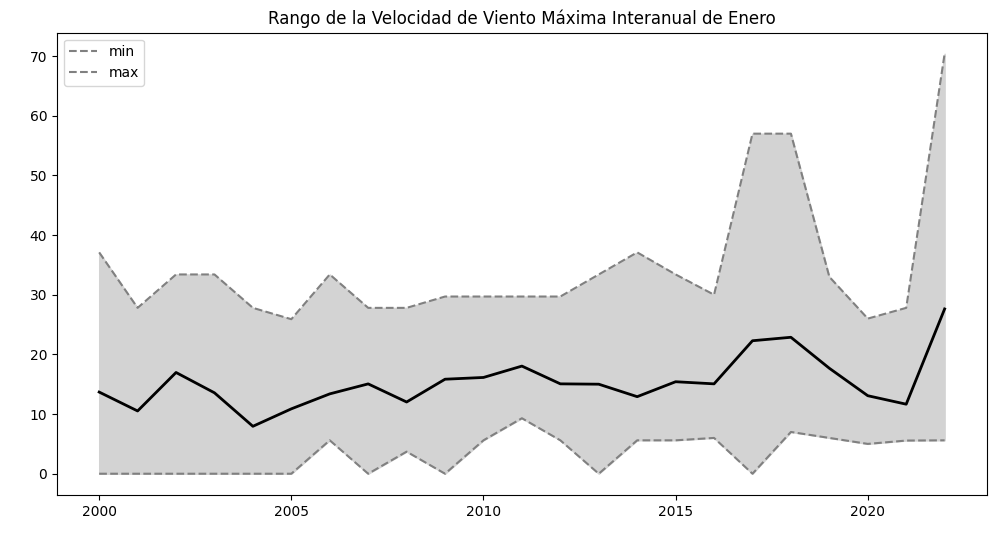

In [123]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Maxima' por año
VMax_Ene = df_enero.groupby(df_enero.index.year)['Velocidad_de_Viento_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMax_Ene['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMax_Ene[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMax_Ene.index, VMax_Ene['min'], VMax_Ene['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Máxima Interanual de Enero')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


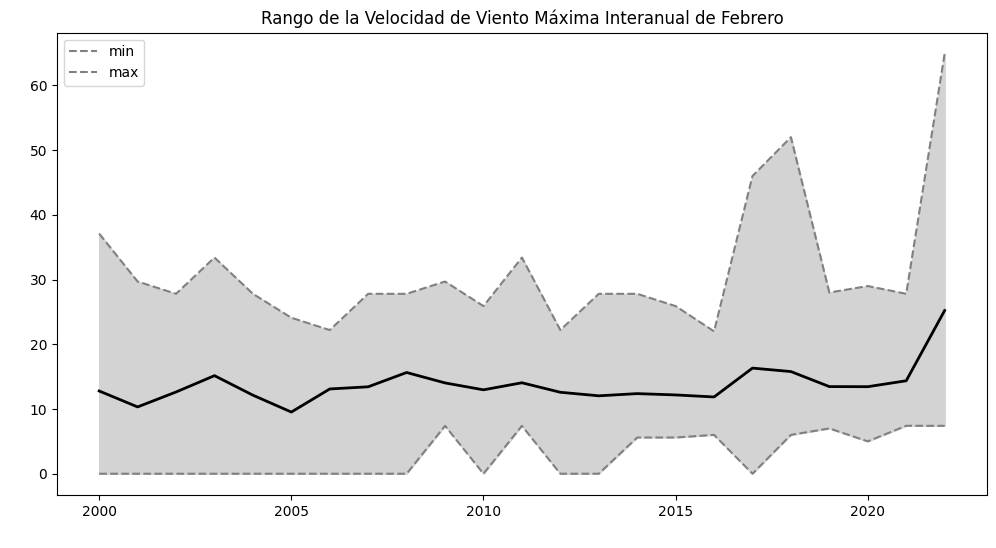

In [124]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Maxima' por año
VMax_Feb = df_febrero.groupby(df_febrero.index.year)['Velocidad_de_Viento_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMax_Feb['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMax_Feb[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMax_Feb.index, VMax_Feb['min'], VMax_Feb['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Máxima Interanual de Febrero')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

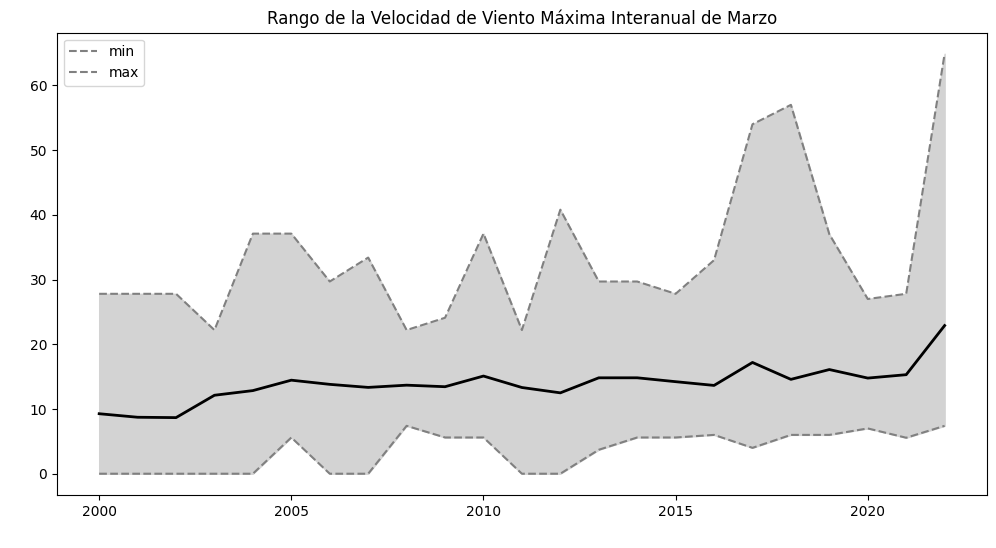

In [125]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Maxima' por año
VMax_Mar = df_marzo.groupby(df_marzo.index.year)['Velocidad_de_Viento_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMax_Mar['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMax_Mar[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMax_Mar.index, VMax_Mar['min'], VMax_Mar['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Máxima Interanual de Marzo')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

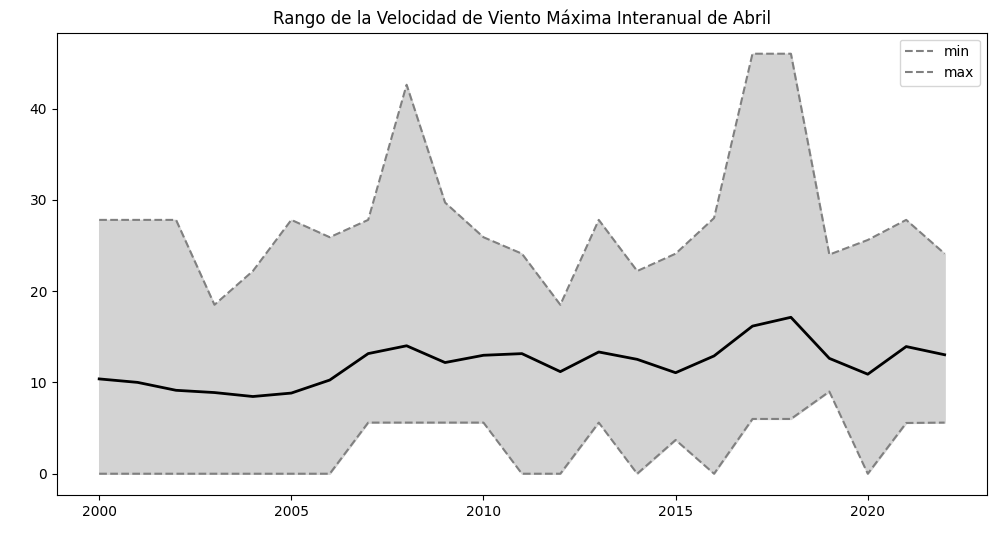

In [126]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Maxima' por año
VMax_Abr = df_abril.groupby(df_abril.index.year)['Velocidad_de_Viento_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMax_Abr['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMax_Abr[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMax_Abr.index, VMax_Abr['min'], VMax_Abr['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Máxima Interanual de Abril')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


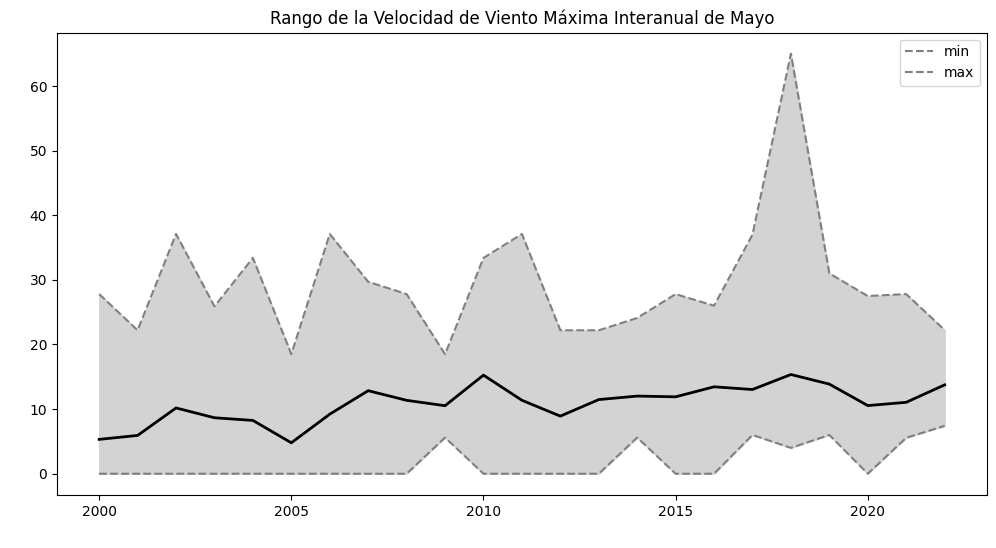

In [127]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Maxima' por año
VMax_May = df_mayo.groupby(df_mayo.index.year)['Velocidad_de_Viento_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMax_May['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMax_May[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMax_May.index, VMax_May['min'], VMax_May['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Máxima Interanual de Mayo')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

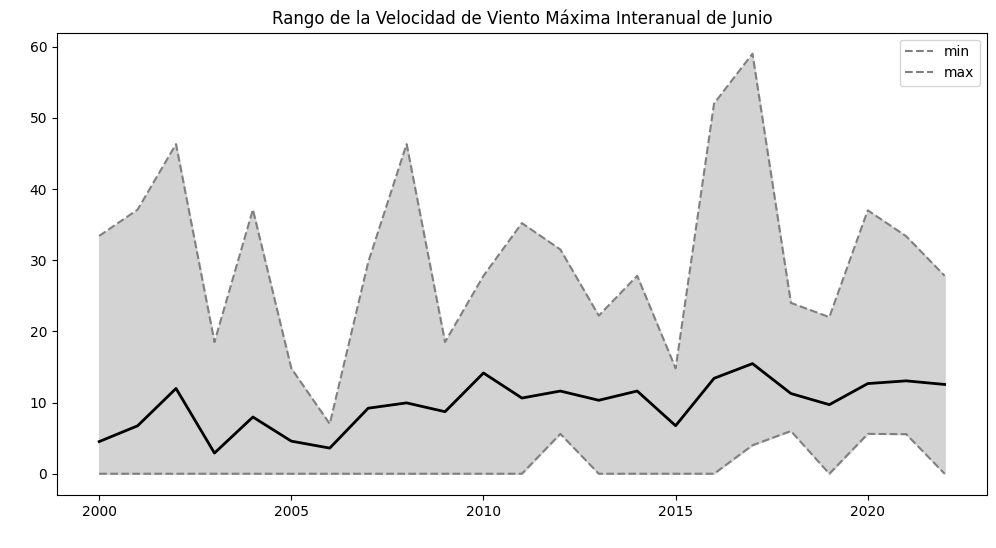

In [128]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Maxima' por año
VMax_Jun = df_junio.groupby(df_junio.index.year)['Velocidad_de_Viento_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMax_Jun['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMax_Jun[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMax_Jun.index, VMax_Jun['min'], VMax_Jun['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Máxima Interanual de Junio')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


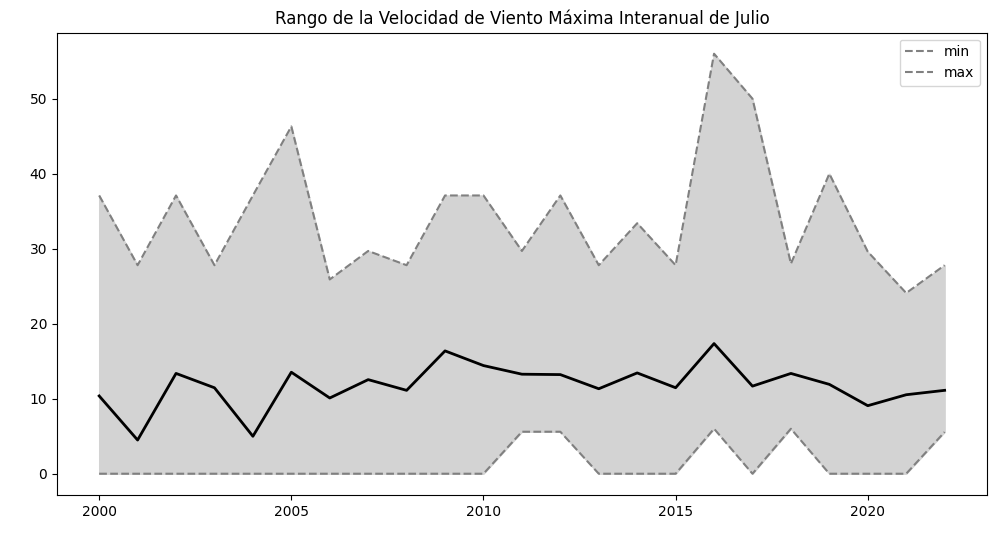

In [129]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Maxima' por año
VMax_Jul = df_julio.groupby(df_julio.index.year)['Velocidad_de_Viento_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMax_Jul['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMax_Jul[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMax_Jul.index, VMax_Jul['min'], VMax_Jul['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Máxima Interanual de Julio')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


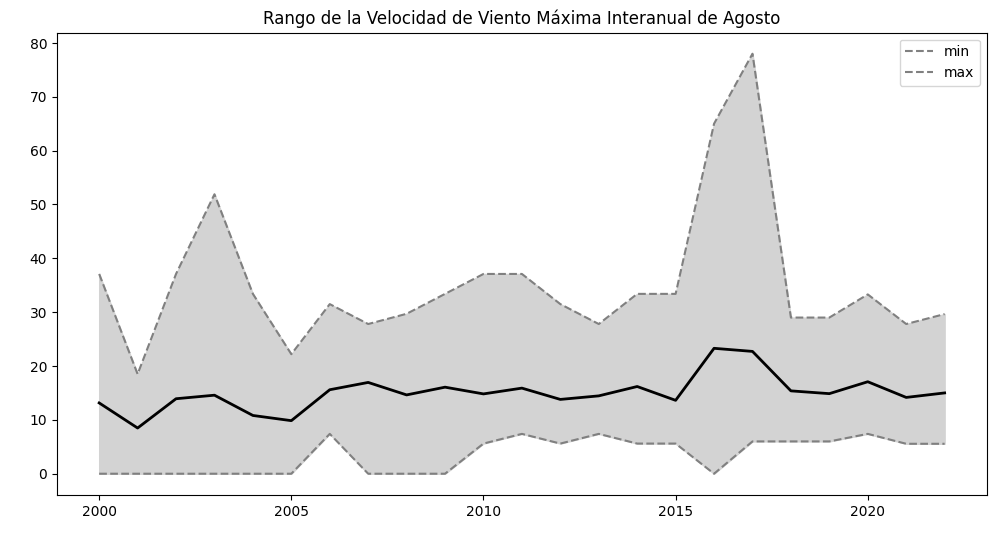

In [130]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Maxima' por año
VMax_Agt = df_Agosto.groupby(df_Agosto.index.year)['Velocidad_de_Viento_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMax_Agt['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMax_Agt[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMax_Agt.index, VMax_Agt['min'], VMax_Agt['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Máxima Interanual de Agosto')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

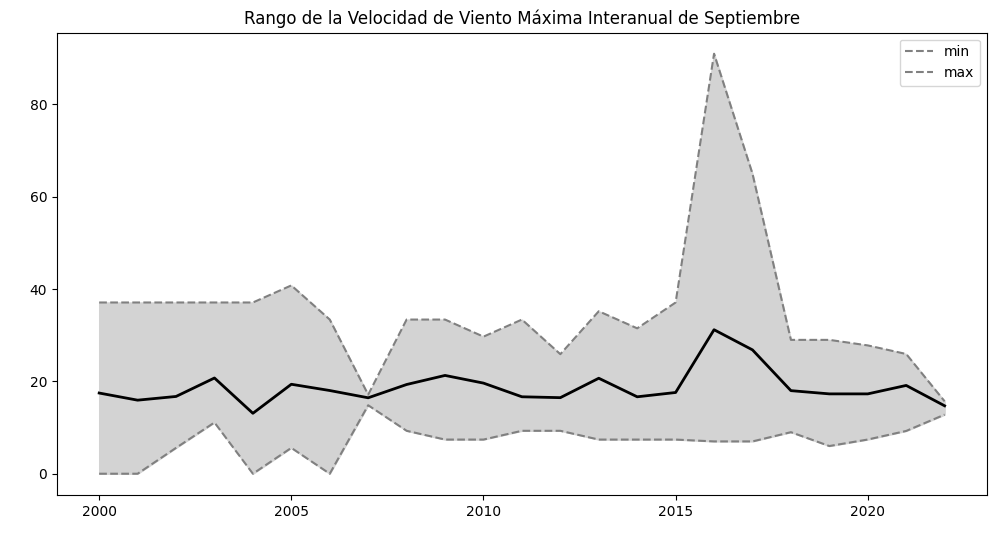

In [131]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Maxima' por año
VMax_Sep = df_Septiembre.groupby(df_Septiembre.index.year)['Velocidad_de_Viento_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMax_Sep['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMax_Sep[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMax_Sep.index, VMax_Sep['min'], VMax_Sep['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Máxima Interanual de Septiembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


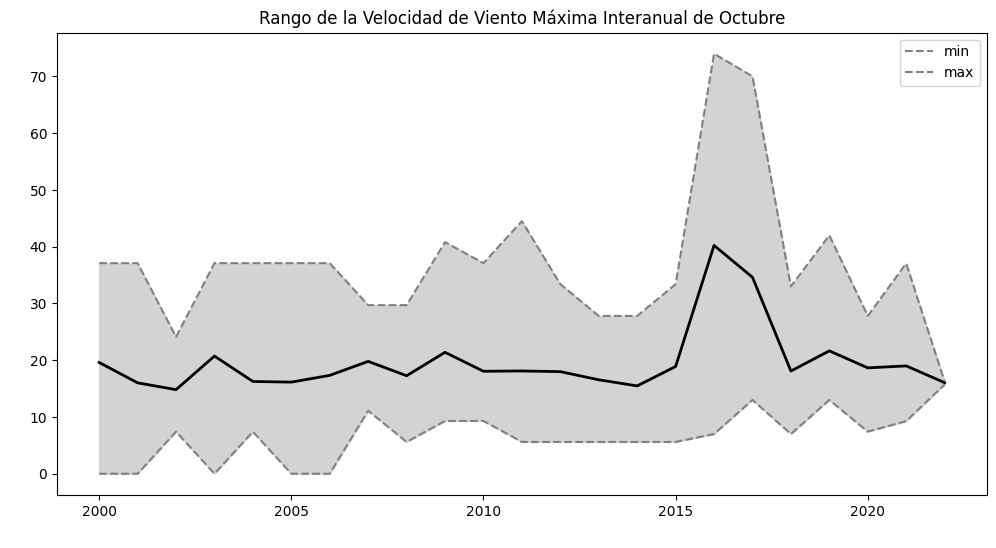

In [132]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Maxima' por año
VMax_Oct = df_Octubre.groupby(df_Octubre.index.year)['Velocidad_de_Viento_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMax_Oct['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMax_Oct[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMax_Oct.index, VMax_Oct['min'], VMax_Oct['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Máxima Interanual de Octubre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


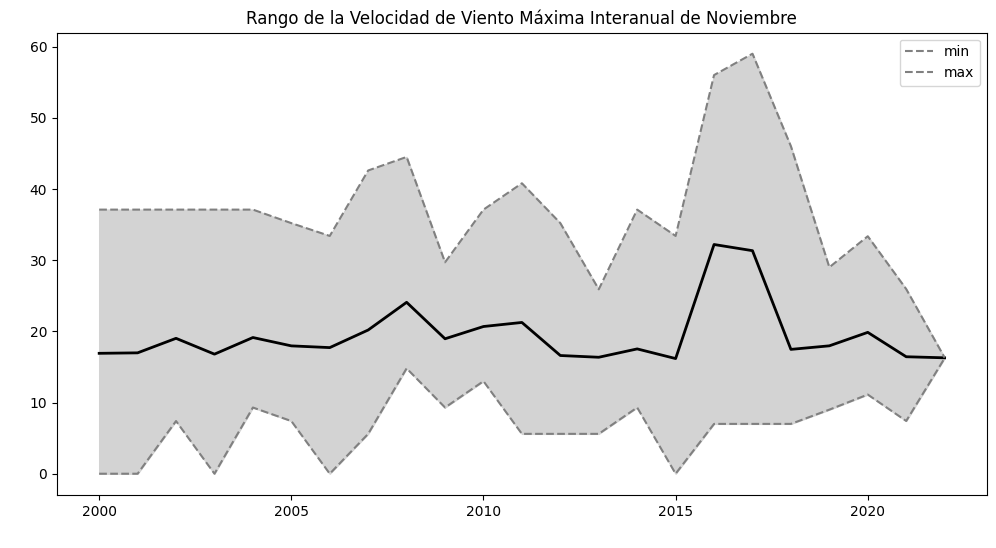

In [133]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Maxima' por año
VMax_Nov = df_Noviembre.groupby(df_Noviembre.index.year)['Velocidad_de_Viento_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMax_Nov['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMax_Nov[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMax_Nov.index, VMax_Nov['min'], VMax_Nov['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Máxima Interanual de Noviembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


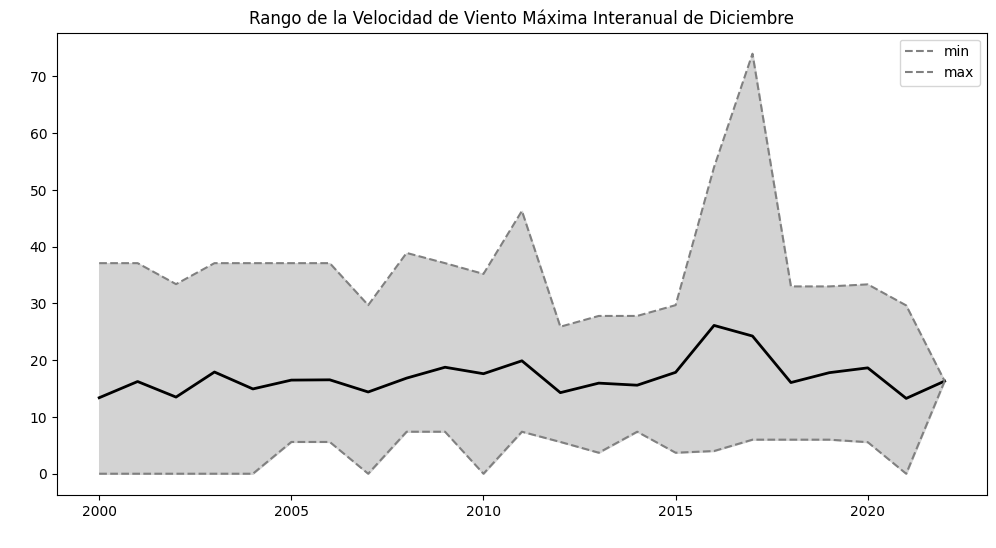

In [134]:
# Calcular el promedio, valor mínimo y valor máximo de la columna 'Velocidad_de_Viento_Maxima' por año
VMax_Dic = df_Diciembre.groupby(df_Diciembre.index.year)['Velocidad_de_Viento_Maxima'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
VMax_Dic['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
VMax_Dic[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(VMax_Dic.index, VMax_Dic['min'], VMax_Dic['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Velocidad de Viento Máxima Interanual de Diciembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

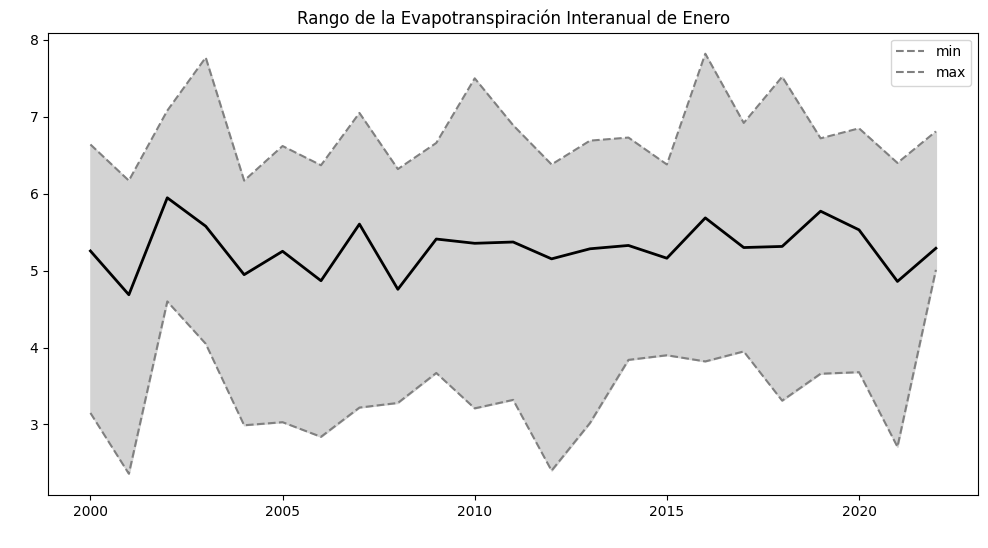

In [135]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘eTo’ por año
Evapo_Ene = df_enero.groupby(df_enero.index.year)['eTo'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
Evapo_Ene['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
Evapo_Ene[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(Evapo_Ene.index, Evapo_Ene['min'], Evapo_Ene['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Evapotranspiración Interanual de Enero')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

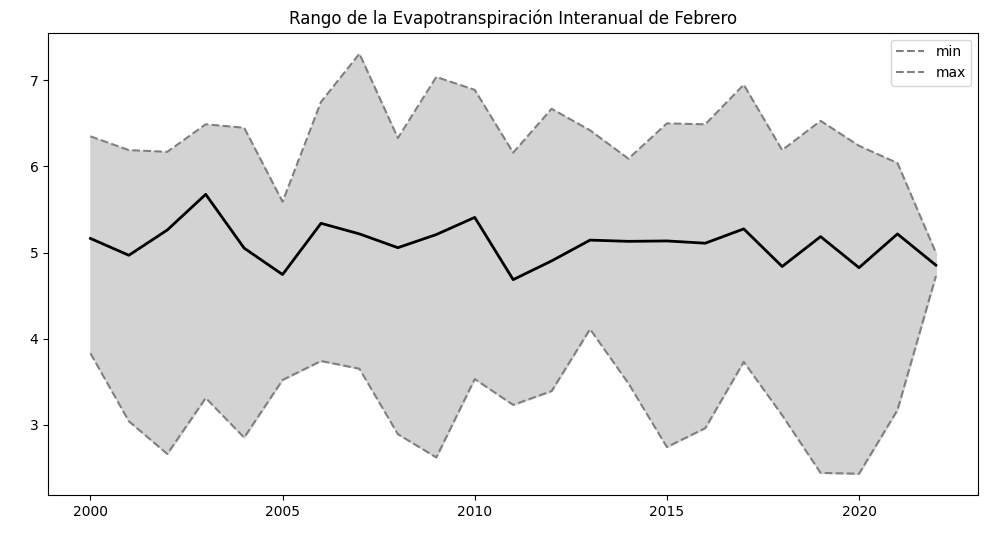

In [136]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘eTo’ por año
Evapo_Feb = df_febrero.groupby(df_febrero.index.year)['eTo'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
Evapo_Feb['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
Evapo_Feb[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(Evapo_Feb.index, Evapo_Feb['min'], Evapo_Feb['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Evapotranspiración Interanual de Febrero')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


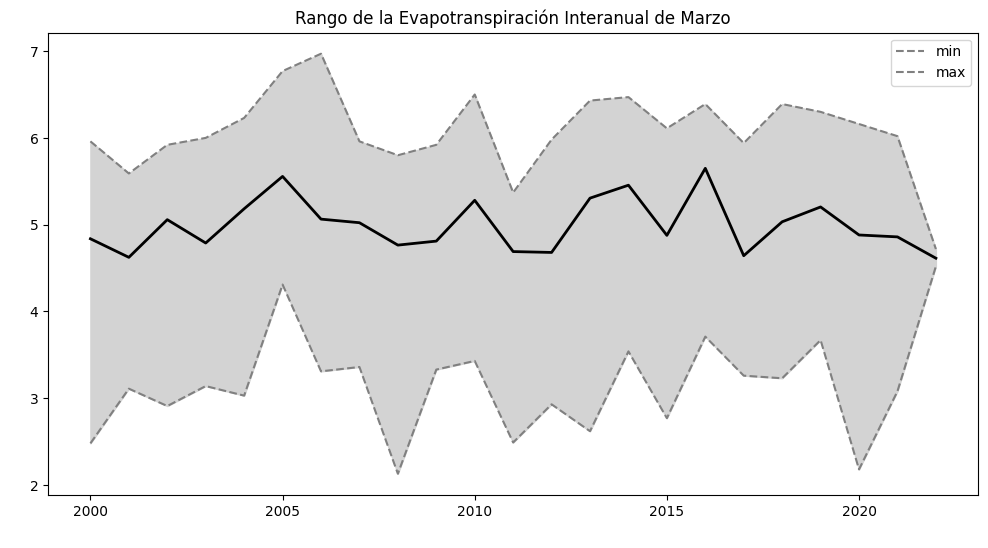

In [137]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘eTo’ por año
Evapo_Mar = df_marzo.groupby(df_marzo.index.year)['eTo'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
Evapo_Mar['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
Evapo_Mar[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(Evapo_Mar.index, Evapo_Mar['min'], Evapo_Mar['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Evapotranspiración Interanual de Marzo')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

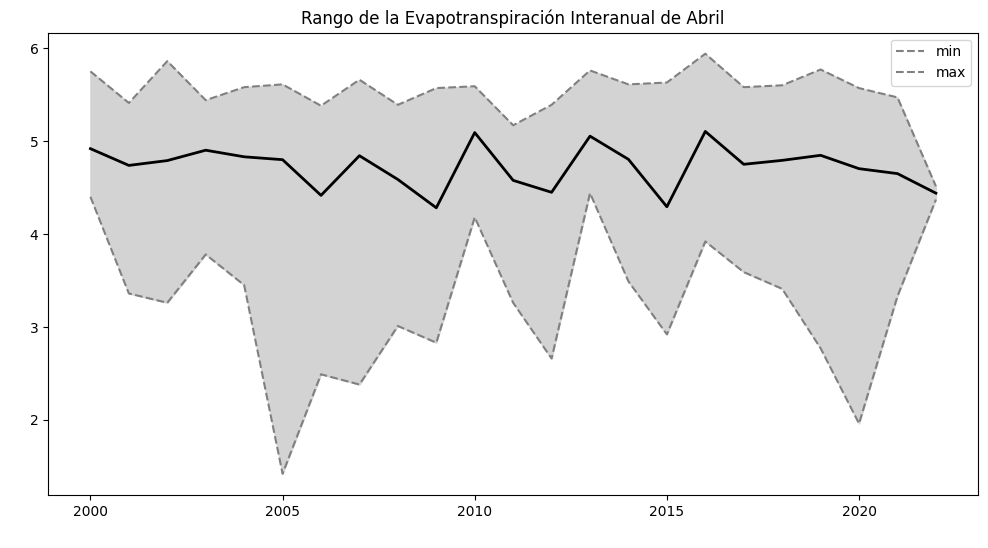

In [138]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘eTo’ por año
Evapo_Abr = df_abril.groupby(df_abril.index.year)['eTo'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
Evapo_Abr['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
Evapo_Abr[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(Evapo_Abr.index, Evapo_Abr['min'], Evapo_Abr['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Evapotranspiración Interanual de Abril')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

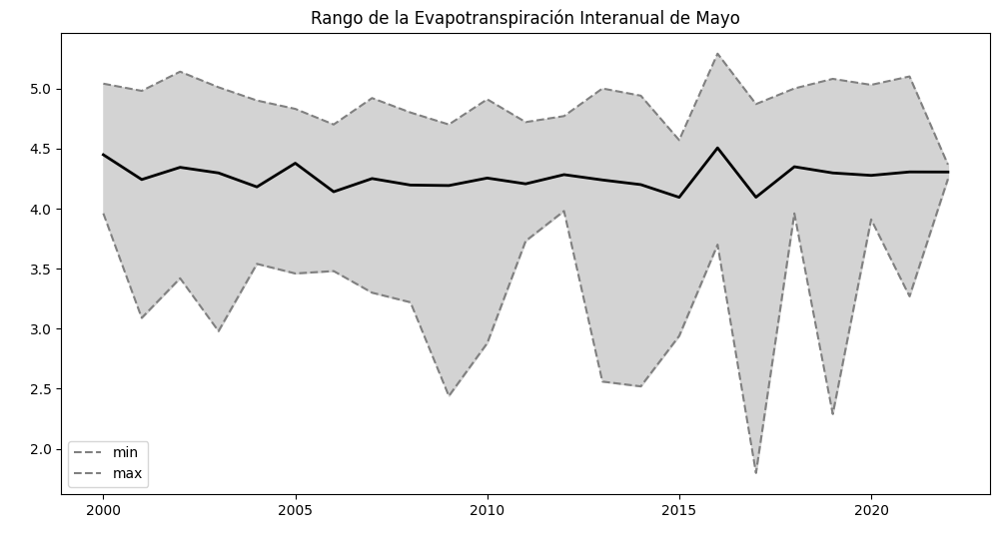

In [139]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘eTo’ por año
Evapo_May = df_mayo.groupby(df_mayo.index.year)['eTo'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
Evapo_May['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
Evapo_May[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(Evapo_May.index, Evapo_May['min'], Evapo_May['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Evapotranspiración Interanual de Mayo')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


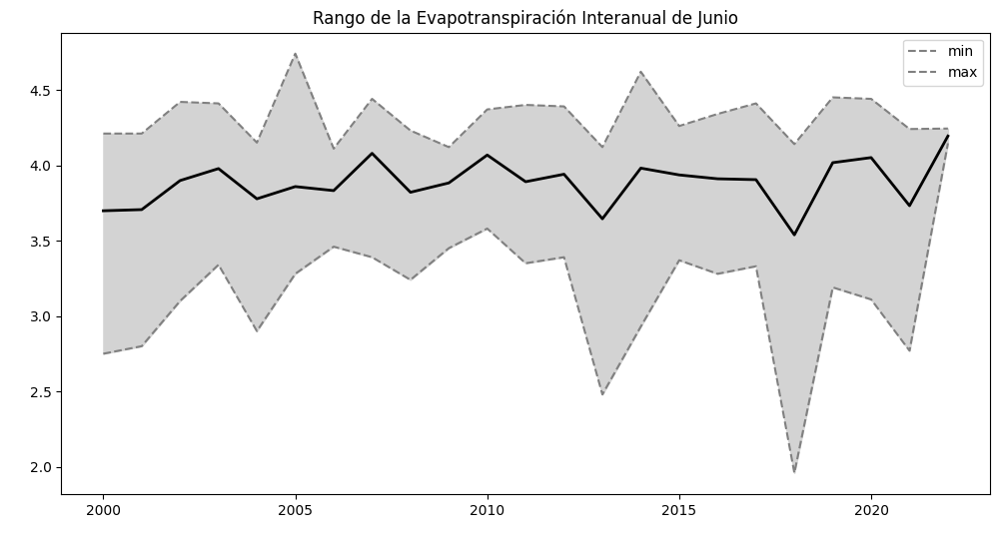

In [140]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘eTo’ por año
Evapo_Jun = df_junio.groupby(df_junio.index.year)['eTo'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
Evapo_Jun['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
Evapo_Jun[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(Evapo_Jun.index, Evapo_Jun['min'], Evapo_Jun['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Evapotranspiración Interanual de Junio')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

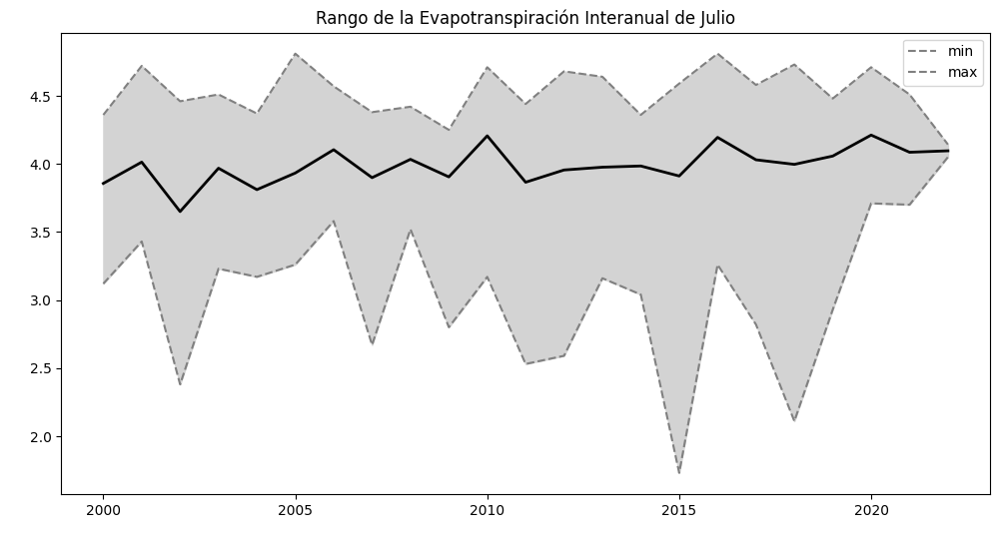

In [141]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘eTo’ por año
Evapo_Jul = df_julio.groupby(df_julio.index.year)['eTo'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
Evapo_Jul['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
Evapo_Jul[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(Evapo_Jul.index, Evapo_Jul['min'], Evapo_Jul['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Evapotranspiración Interanual de Julio')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


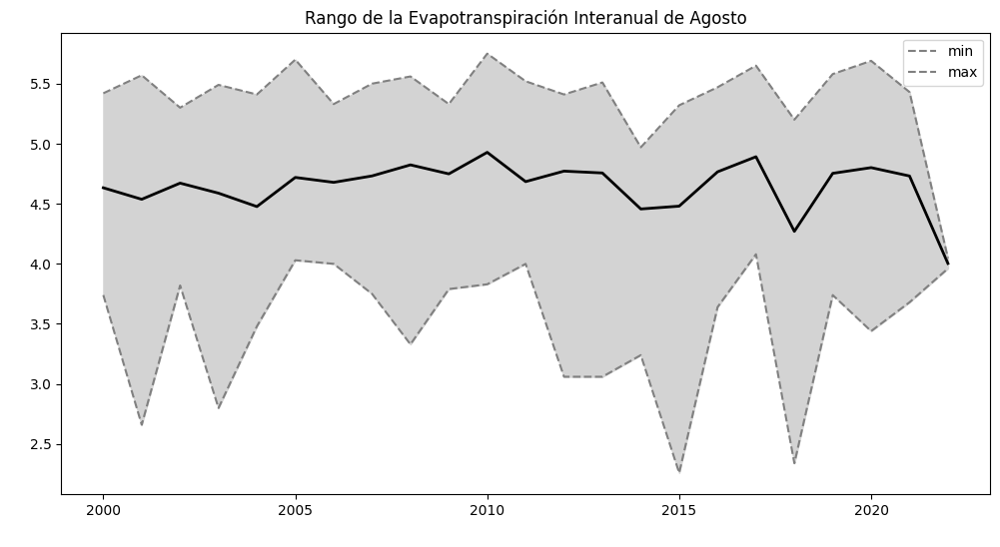

In [142]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘eTo’ por año
Evapo_Agt = df_Agosto.groupby(df_Agosto.index.year)['eTo'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
Evapo_Agt['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
Evapo_Agt[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(Evapo_Agt.index, Evapo_Agt['min'], Evapo_Agt['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Evapotranspiración Interanual de Agosto')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


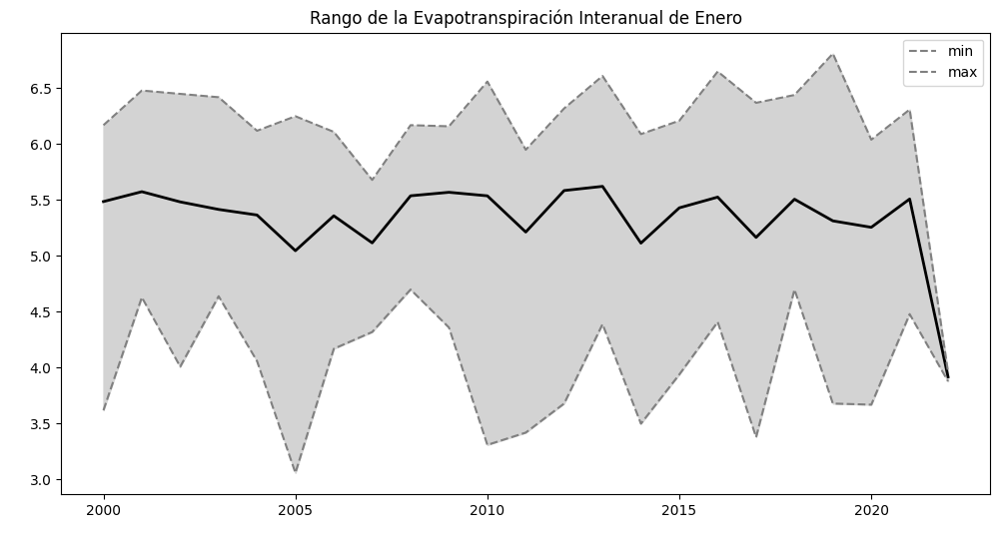

In [143]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘eTo’ por año
Evapo_Sep = df_Septiembre.groupby(df_Septiembre.index.year)['eTo'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
Evapo_Sep['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
Evapo_Sep[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(Evapo_Sep.index, Evapo_Sep['min'], Evapo_Sep['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Evapotranspiración Interanual de Enero')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


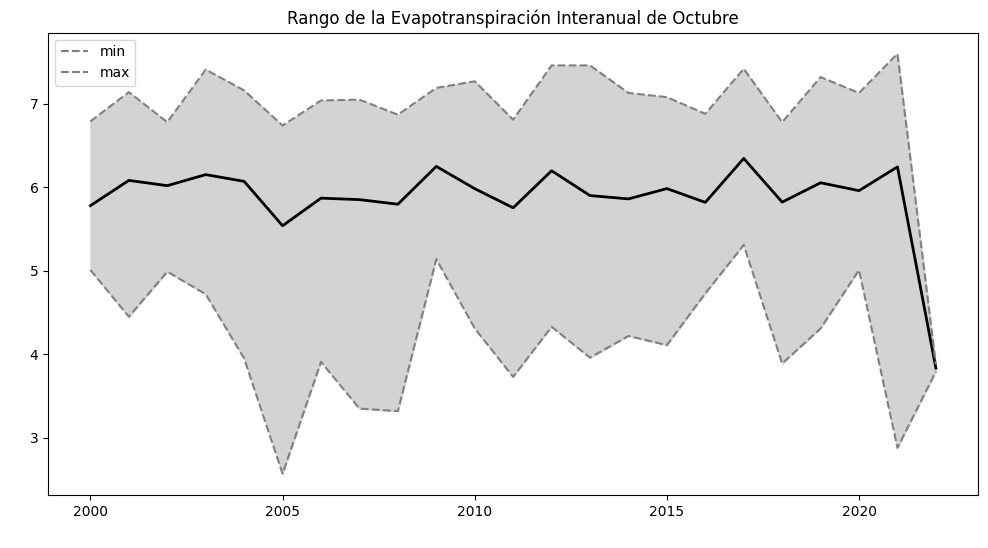

In [144]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘eTo’ por año
Evapo_Oct = df_Octubre.groupby(df_Octubre.index.year)['eTo'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
Evapo_Oct['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
Evapo_Oct[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(Evapo_Oct.index, Evapo_Oct['min'], Evapo_Oct['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Evapotranspiración Interanual de Octubre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()

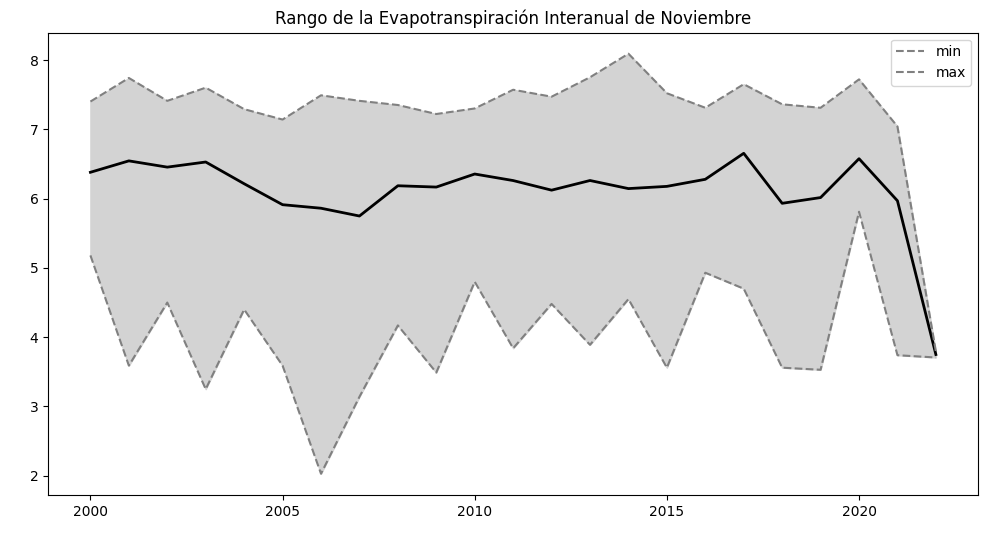

In [145]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘eTo’ por año
Evapo_Nov = df_Noviembre.groupby(df_Noviembre.index.year)['eTo'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
Evapo_Nov['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
Evapo_Nov[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(Evapo_Nov.index, Evapo_Nov['min'], Evapo_Nov['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Evapotranspiración Interanual de Noviembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()


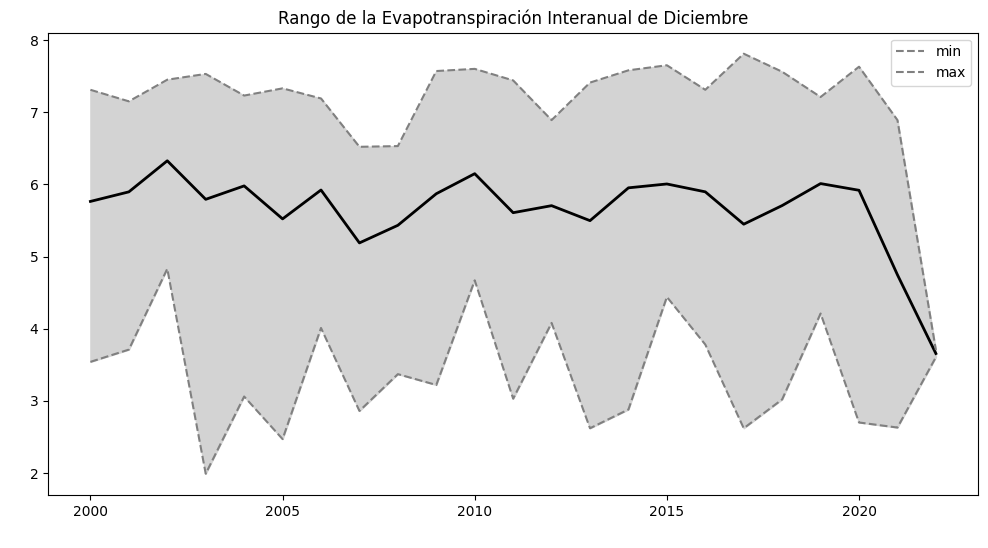

In [146]:
# Calcular el promedio, valor mínimo y valor máximo de la columna ‘eTo’ por año
Evapo_Dic = df_Diciembre.groupby(df_Diciembre.index.year)['eTo'].agg(['mean', 'min', 'max'])

# Crear una figura con tamaño específico
fig, ax = plt.subplots(figsize=(12, 6))

# Graficar el promedio
Evapo_Dic['mean'].plot(color='black', linewidth=2, ax=ax)

# Graficar las líneas de valor mínimo y máximo
Evapo_Dic[['min', 'max']].plot(color='gray', linestyle='--', ax=ax)

# Rellenar la distancia entre el mínimo y el máximo
ax.fill_between(Evapo_Dic.index, Evapo_Dic['min'], Evapo_Dic['max'], color='lightgray')

# Configurar el título y las etiquetas de los ejes
plt.title('Rango de la Evapotranspiración Interanual de Diciembre')
plt.xlabel(' ')
plt.ylabel(' ')

# Mostrar el gráfico
plt.show()